In [2]:
import numpy as np
import pandas as pd
import plotly
from plotnine import *
from statsmodels import *
import statsmodels.api as sm
import plyer
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Math

<br><br>

<hr><hr>

## import data

#### Define X (Independent Variables) in dataframe structure

In [3]:
## get path
pathh = plyer.filechooser.open_file()[0]

In [4]:
dat_org = pd.read_excel(pathh)
dat_org.describe
dat_org.columns

c:\Users\habib\AppData\Local\Programs\Python\Python311\Lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored


Index(['RTO_Name', 'Code', 'Area_Mount', 'Area_Flat', 'Percent_Mountain',
       'Indi_Forest', 'Perc_IndForest', 'Area_Water', 'Percen_Water',
       'Area_Ex_Forest', 'Percet_Ex_Forest', 'Area_Wetland', 'Percent_Wetland',
       'Area_Protect', 'Prcen_protect', 'Area_Grass', 'Perc_Grass',
       'Sum_ACCESS', 'Dom_18_Ann', 'Dom_21_Ann', 'Int_18_Ann', 'Int_21_Ann',
       'Per_Coas_View', 'Coast_View', 'Dis_Airpo', 'X_C', 'Y_C', 'DisToCity'],
      dtype='object')

In [5]:
X = dat_org[ ['Area_Mount', 
'Area_Flat', 'Indi_Forest', 
'Area_Wetland',  'Area_Protect', 
'Area_Grass',  'Sum_ACCESS', 'Coast_View', 'Dis_Airpo', 'DisToCity']]
X.columns
X.shape

(31, 10)

<br><hr>

## Domestic Tourism 2018
#### Define data for Domestic Tourism in 2018

In [6]:
y1 = dat_org['Dom_18_Ann']
y1_log = np.log(y1)
dat1 = pd.concat([y1, X], axis = 1, join = "outer")
dat1.index = dat_org['RTO_Name']
dat1.columns =  ['y1', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 
'AreaGr', 'SumAcc', 'CoastV', 'DisAir', 'DisCity']
dat1['RTO_Names']= dat_org['RTO_Name'].values
dat1['y1_log'] = y1_log.values
dat1
dat1.columns

Index(['y1', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 'AreaGr',
       'SumAcc', 'CoastV', 'DisAir', 'DisCity', 'RTO_Names', 'y1_log'],
      dtype='object')

<br><br>
#### define a regression Model

<br><br>

In [7]:
regr = linear_model.LinearRegression()
scaler = MinMaxScaler(feature_range=(0, 1))

<br><br><hr><hr>

#### for Area Mount

<IPython.core.display.Math object>

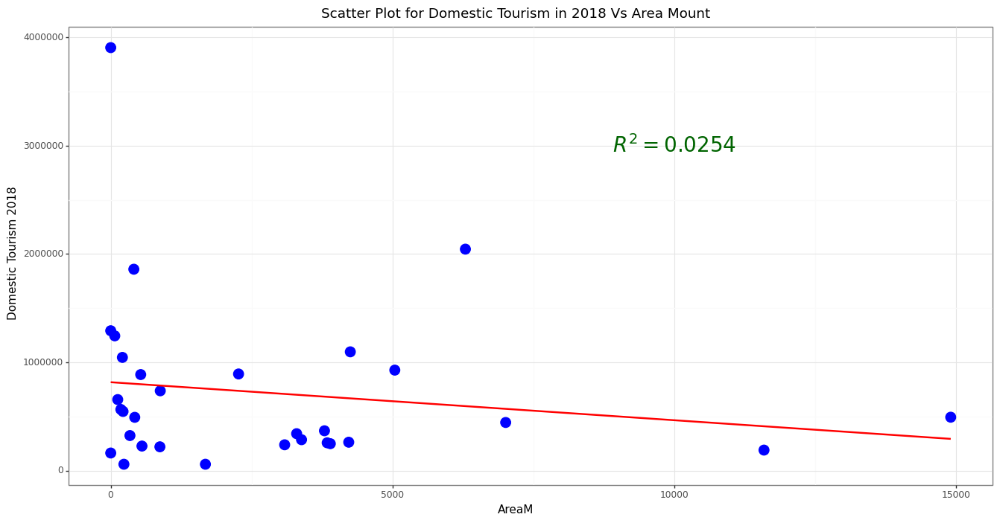

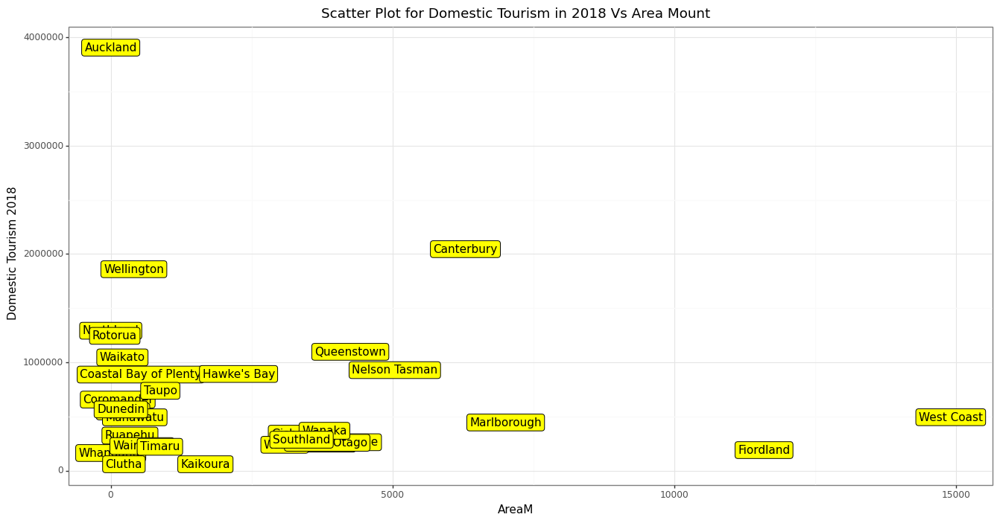

<IPython.core.display.Math object>

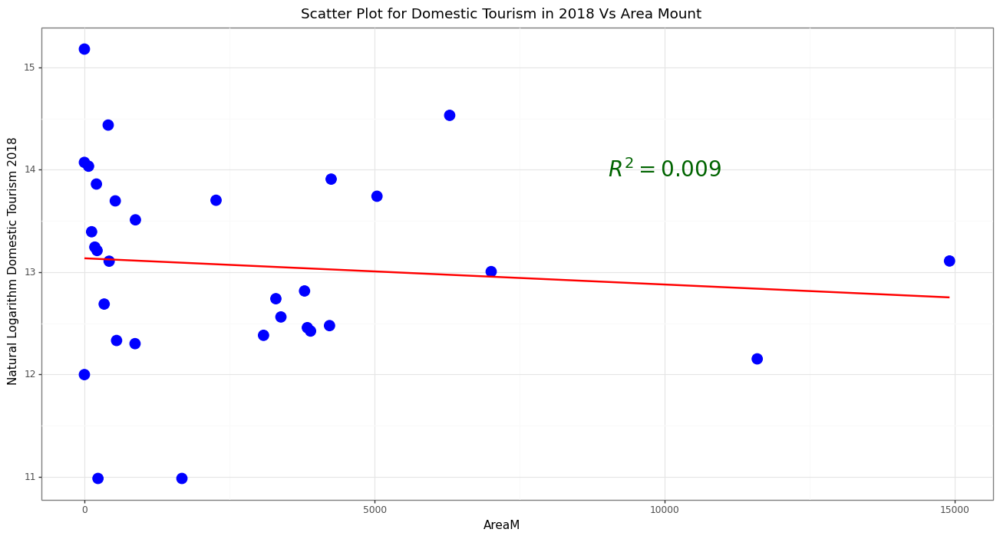

In [8]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y1)
preds = Model1.predict(x)
R2 = r2_score(y1, preds).round(4)
display(Math(r'R^2_{{Model}} = {}'.format(R2)))
P1 = (ggplot(dat1, aes(x = 'AreaM', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Mount", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0254$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'AreaM', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Mount", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model2 = regr.fit(x, y1_log)
preds2 = Model2.predict(x)
R22 = r2_score(y1_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))

P2 = (ggplot(dat1, aes(x = 'AreaM', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Mount", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.009$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br> 
<hr><hr>
<br><br>

#### For Area Flat

<IPython.core.display.Math object>

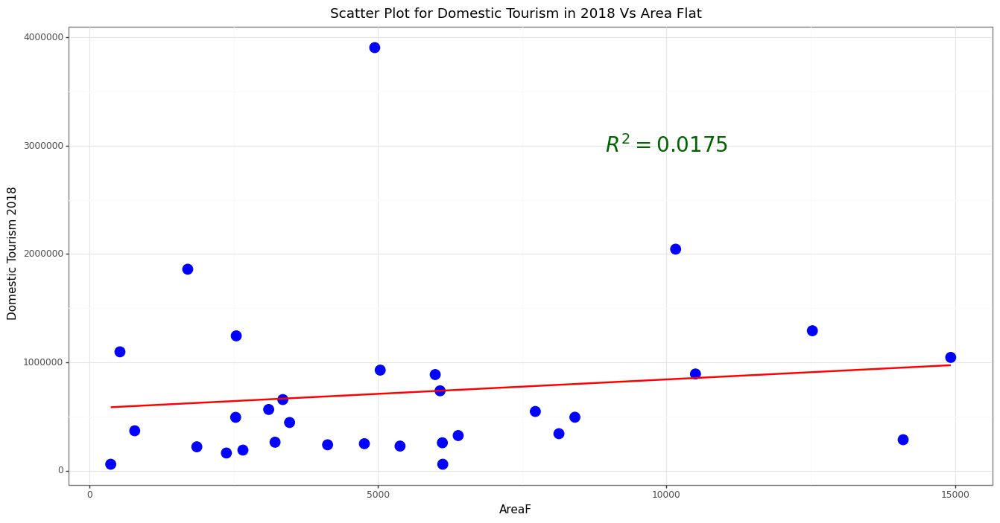

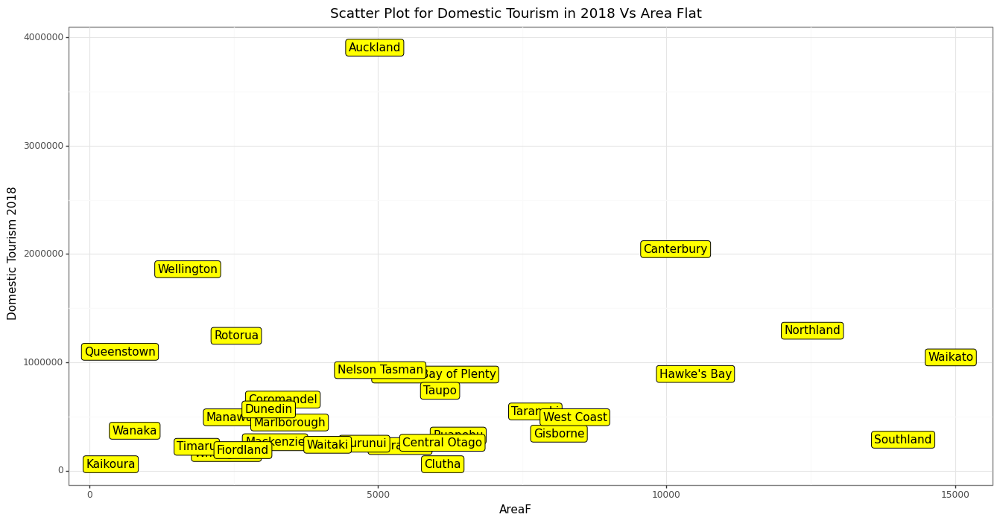

<IPython.core.display.Math object>

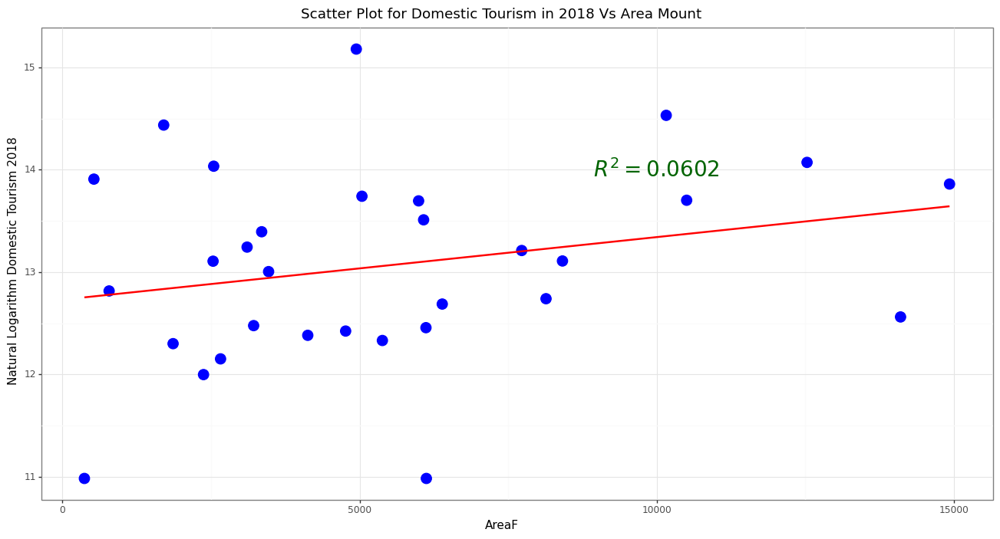

In [9]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y1)
preds21 = Model2.predict(x1)
R2 = r2_score(y1, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat1, aes(x = 'AreaF', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Flat", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0175$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'AreaF', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Flat", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model22 = regr.fit(x1, y1_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y1_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))
P2 = (ggplot(dat1, aes(x = 'AreaF', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Mount", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0602$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>

#### for Area InForest

<IPython.core.display.Math object>

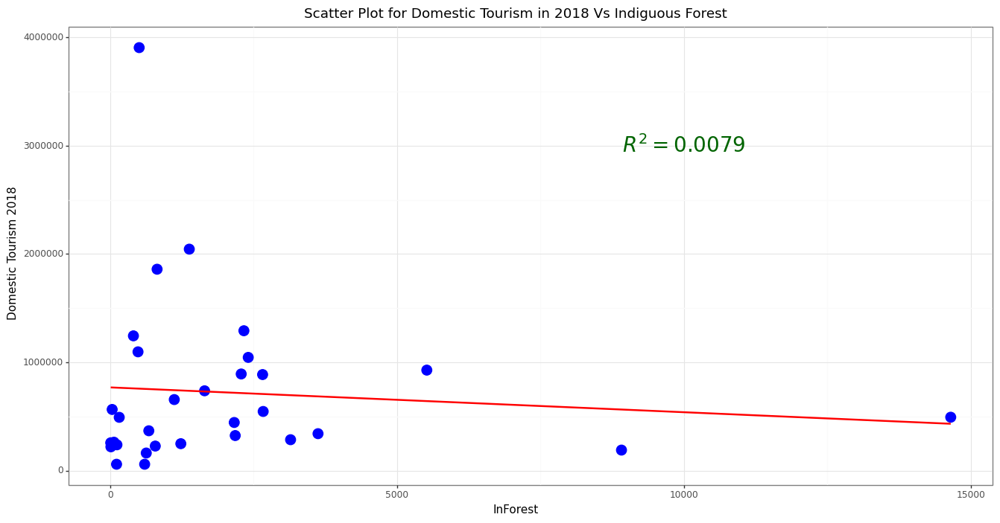

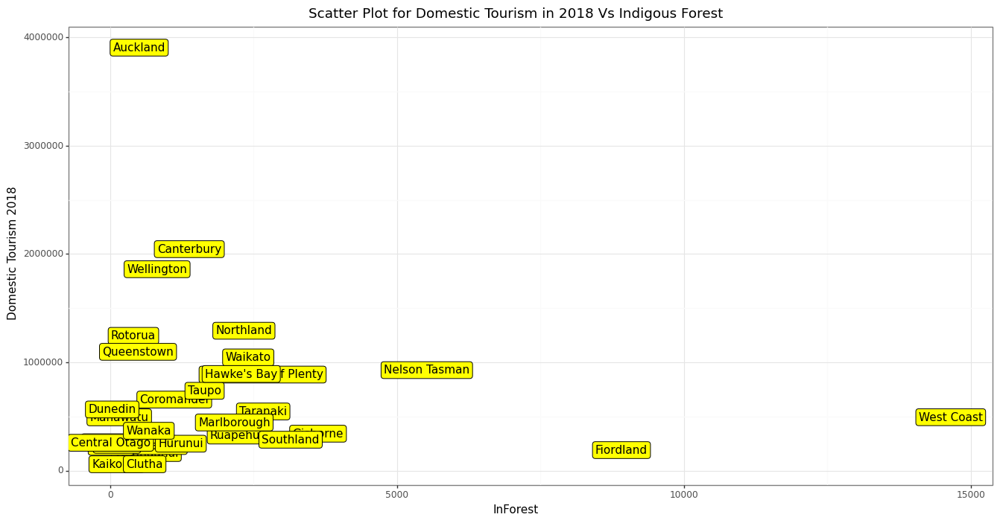

<IPython.core.display.Math object>

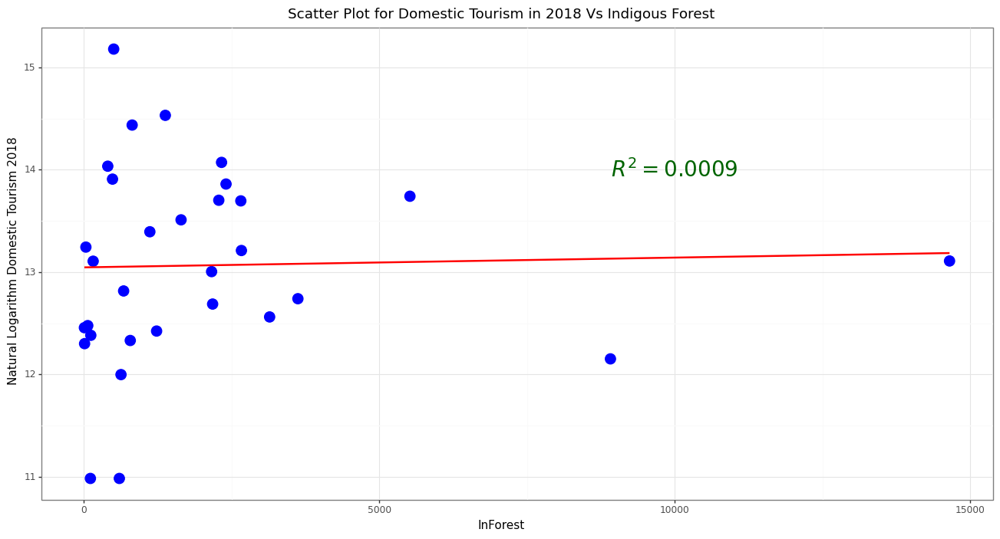

In [10]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y1)
preds31 = Model3.predict(x2)
R231 = r2_score(y1, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))
P1 = (ggplot(dat1, aes(x = 'InForest', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Indiguous Forest", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0079$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'InForest', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Indigous Forest", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model32 = regr.fit(x2, y1_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y1_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))

P2 = (ggplot(dat1, aes(x = 'InForest', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Indigous Forest", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0009$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<hr><hr>
<br><br>

#### For Area Wetland

<IPython.core.display.Math object>

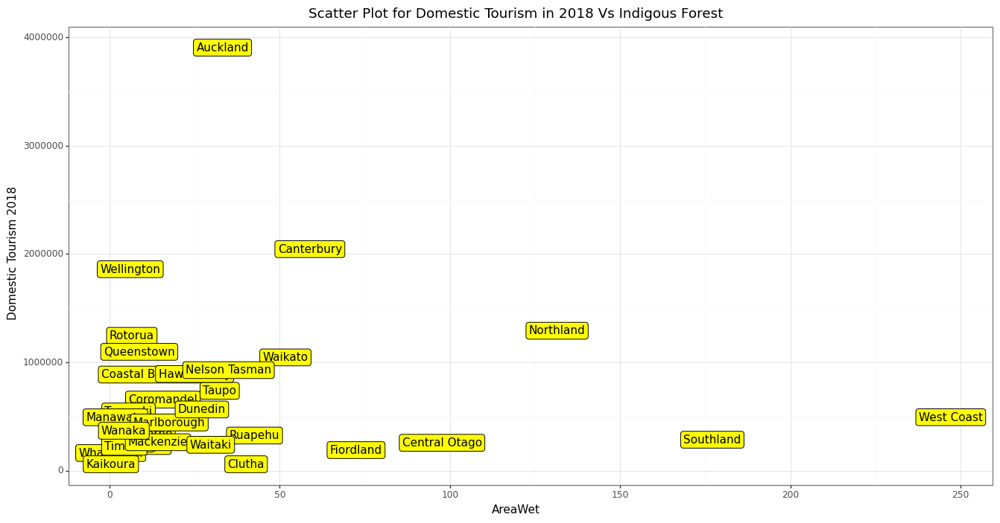

<IPython.core.display.Math object>

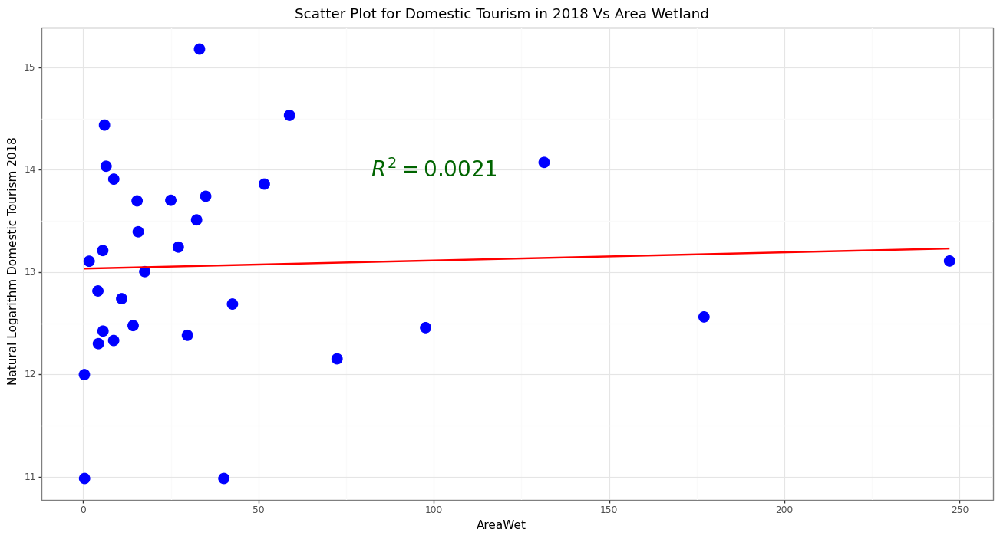

In [11]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y1)
preds41 = Model41.predict(x3)
R241 = r2_score(y1, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))
P1 = (ggplot(dat1, aes(x = 'AreaWet', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Wetland", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100,  y = 3000000, label = r"$R^2 = 0.0$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


## create label plot

P = (ggplot(dat1, aes(x = 'AreaWet', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Indigous Forest", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)    
#### get logarithm of y


Model42 = regr.fit(x3, y1_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y1_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))
P2 = (ggplot(dat1, aes(x = 'AreaWet', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Wetland", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 100, y = 14, label = r"$R^2 = 0.0021$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<hr><hr>
<br><br>


#### For Area Protect

<IPython.core.display.Math object>

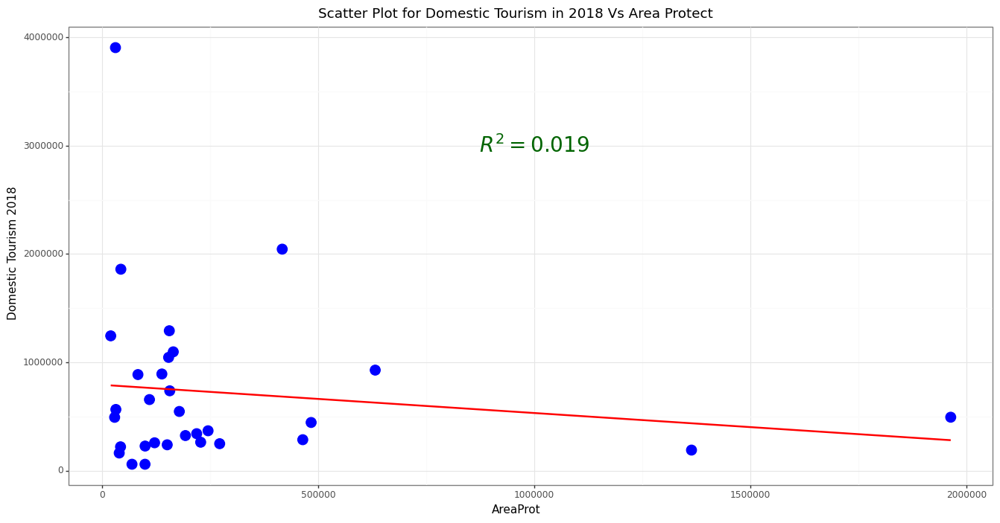

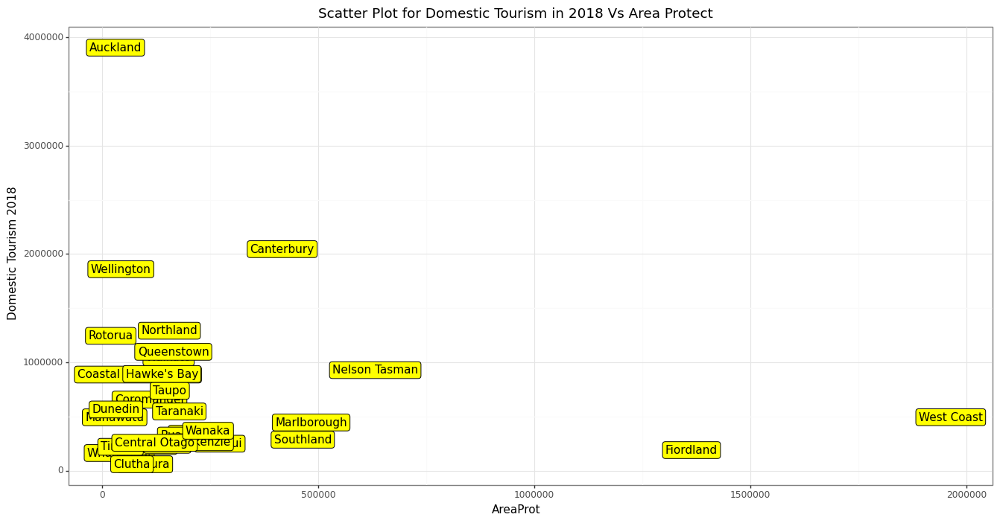

<IPython.core.display.Math object>

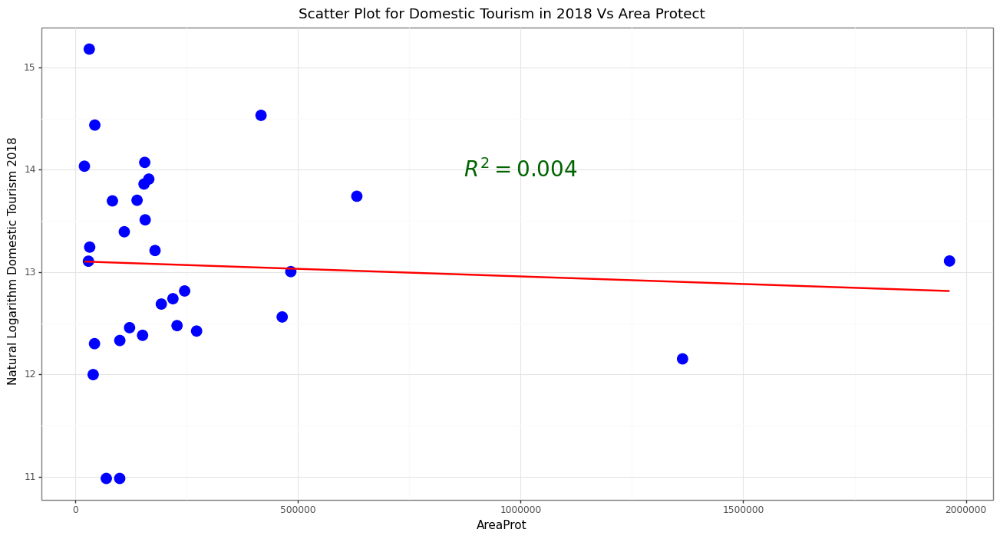

In [12]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y1)
preds51 = Model51.predict(x4)
R251 = r2_score(y1, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))
P1 = (ggplot(dat1, aes(x = 'AreaProt', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Protect", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000,  y = 3000000, label = r"$R^2 = 0.019$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)


## create label plot

P = (ggplot(dat1, aes(x = 'AreaProt', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Protect", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model52 = regr.fit(x4, y1_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y1_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))

P2 = (ggplot(dat1, aes(x = 'AreaProt', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Protect", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000, y = 14, label = r"$R^2 = 0.004$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr>

<br><br> 
#### For Area Grass

<IPython.core.display.Math object>

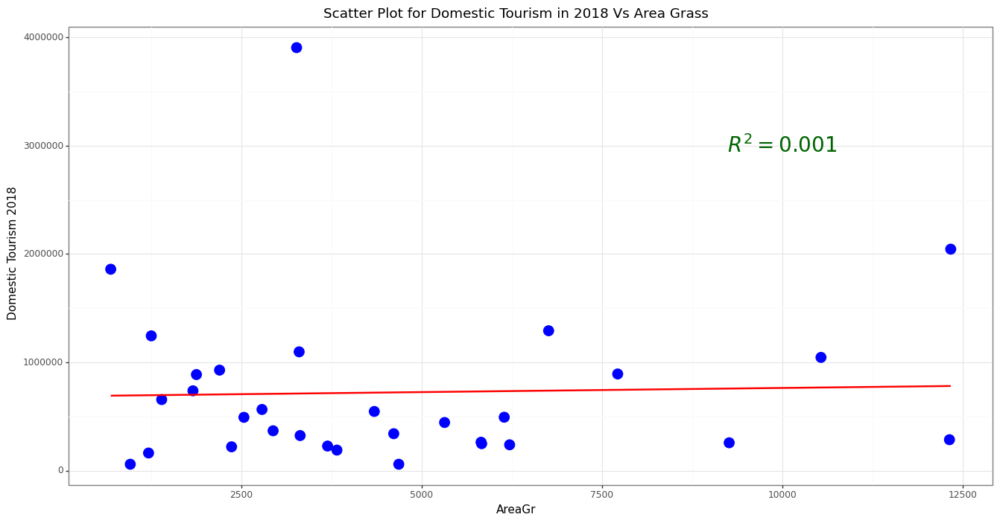

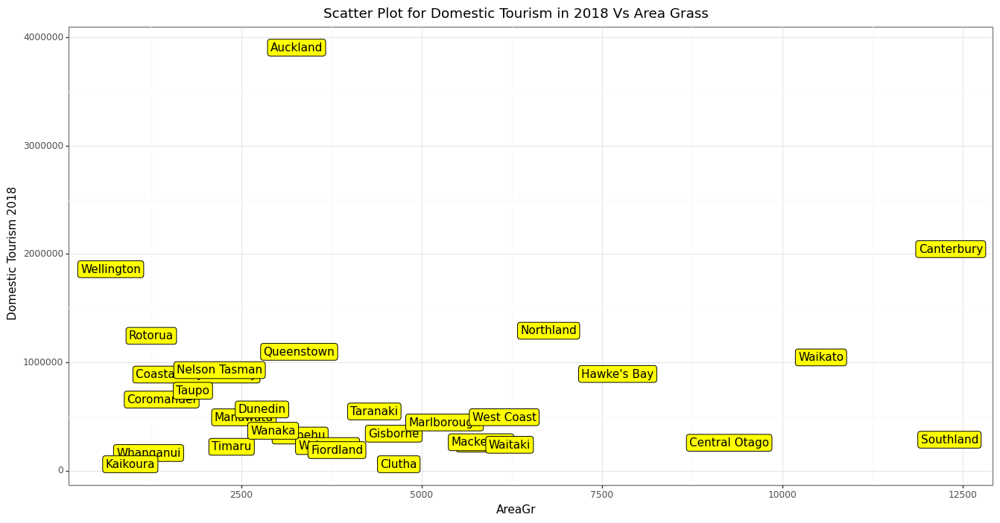

<IPython.core.display.Math object>

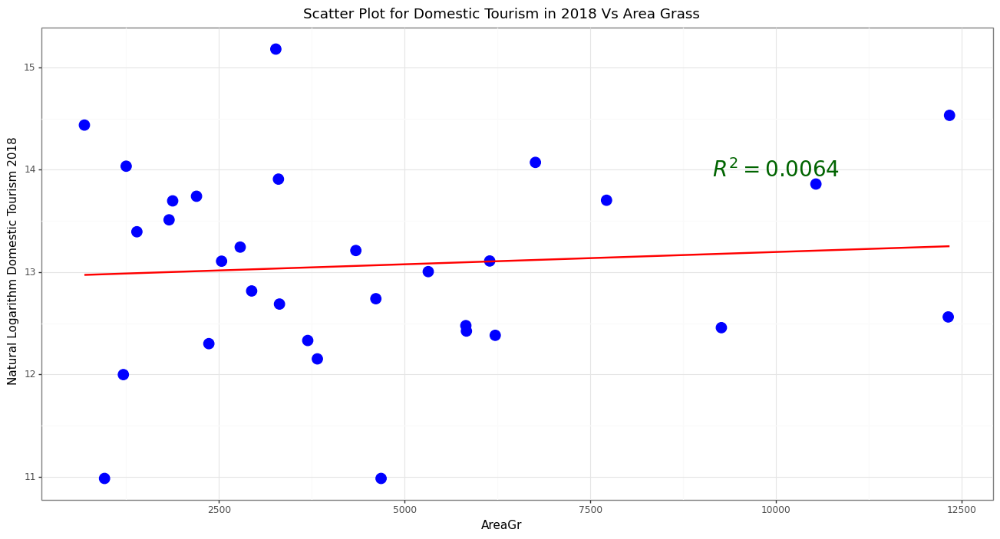

In [13]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y1)
preds61 = Model61.predict(x5)
R261 = r2_score(y1, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))
P1 = (ggplot(dat1, aes(x = 'AreaGr', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Grass", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000,  y = 3000000, label = r"$R^2 = 0.001$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'AreaGr', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Grass", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model62 = regr.fit(x5, y1_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y1_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))
P2 = (ggplot(dat1, aes(x = 'AreaGr', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Area Grass", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0064$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>

#### For Sum ACCESS

<IPython.core.display.Math object>

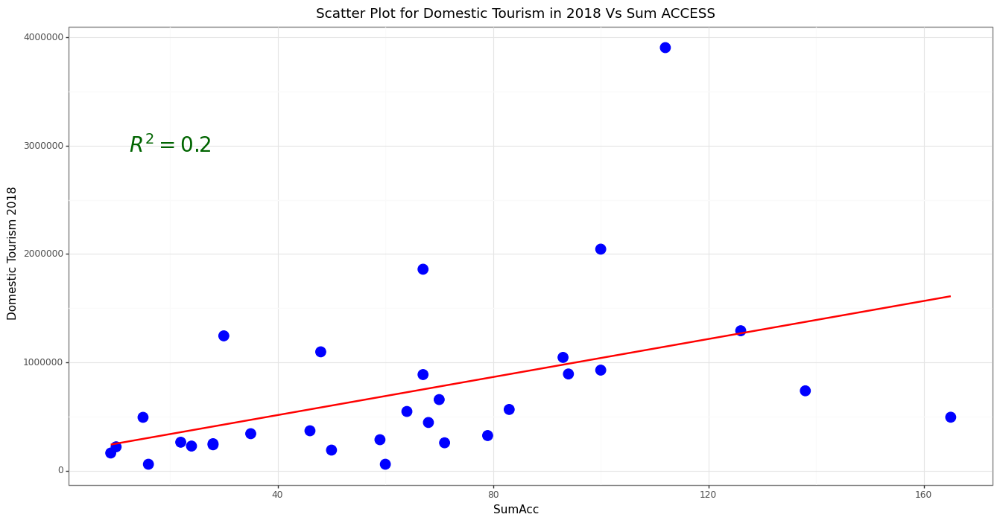

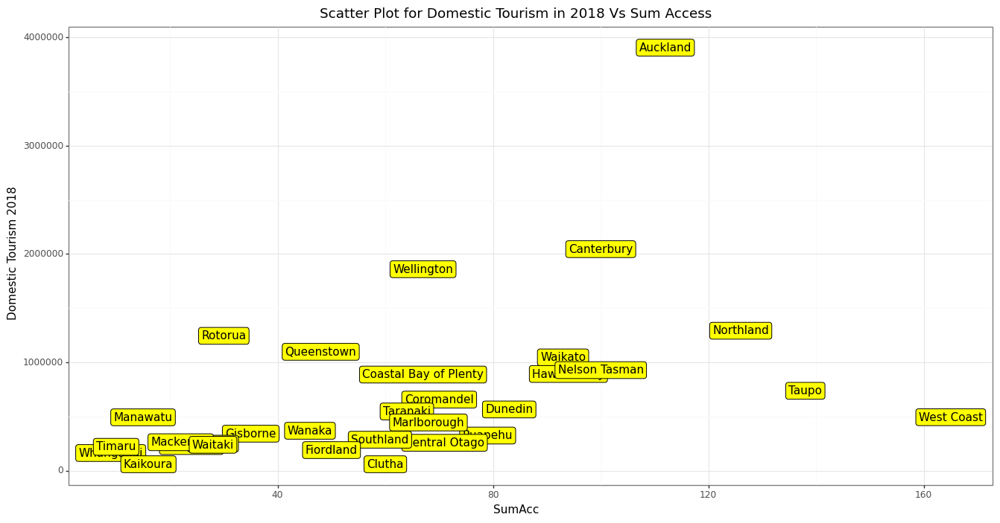

<IPython.core.display.Math object>

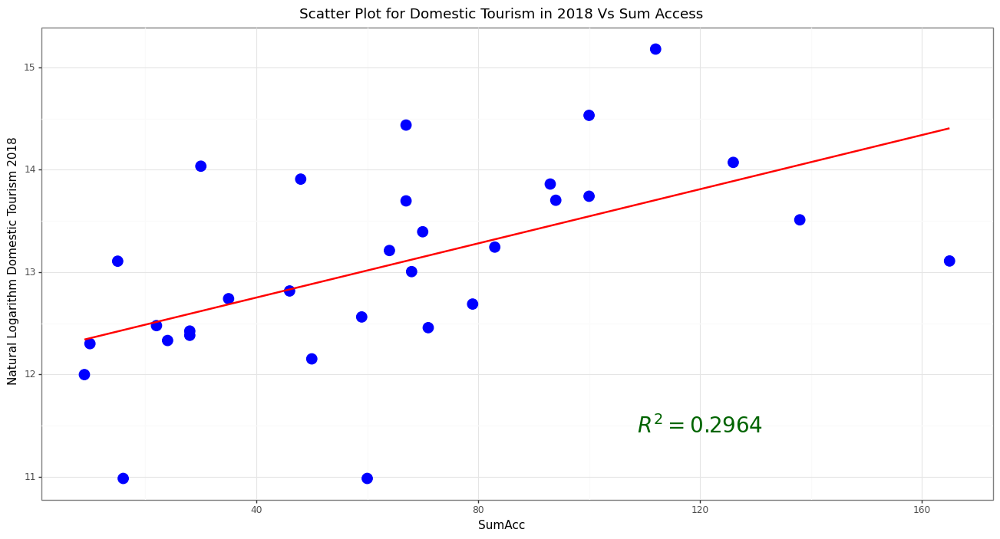

In [14]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y1)
preds71 = Model71.predict(x6)
R271 = r2_score(y1, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))
P1 = (ggplot(dat1, aes(x = 'SumAcc', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Sum ACCESS", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 20,  y = 3000000, label = r"$R^2 = 0.2$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'SumAcc', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Sum Access", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model72 = regr.fit(x6, y1_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y1_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))
P2 = (ggplot(dat1, aes(x = 'SumAcc', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Sum Access", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 120, y = 11.5, label = r"$R^2 = 0.2964$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Coast View

<IPython.core.display.Math object>

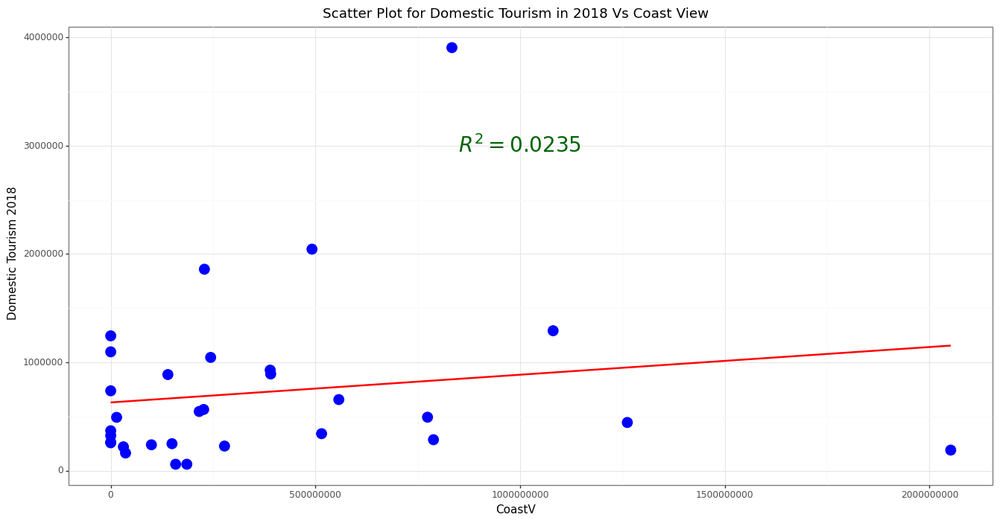

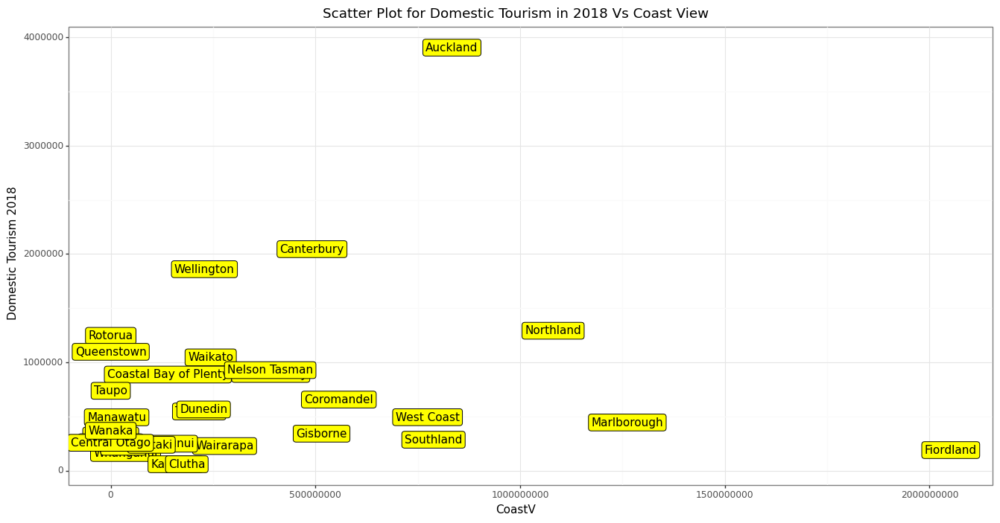

<IPython.core.display.Math object>

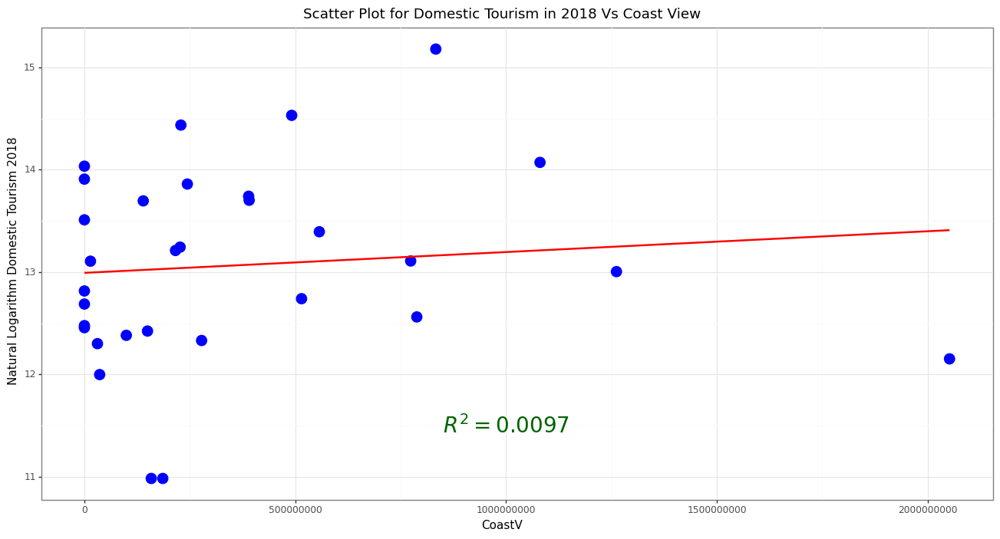

In [15]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y1)
preds81 = Model81.predict(x7)
R281 = r2_score(y1, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))
P1 = (ggplot(dat1, aes(x = 'CoastV', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Coast View", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000000,  y = 3000000, label = r"$R^2 = 0.0235$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot


P = (ggplot(dat1, aes(x = 'CoastV', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Coast View", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model82 = regr.fit(x7, y1_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y1_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))

P2 = (ggplot(dat1, aes(x = 'CoastV', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Coast View", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000000, y = 11.5, label = r"$R^2 = 0.0097$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Distance AirPort

<IPython.core.display.Math object>

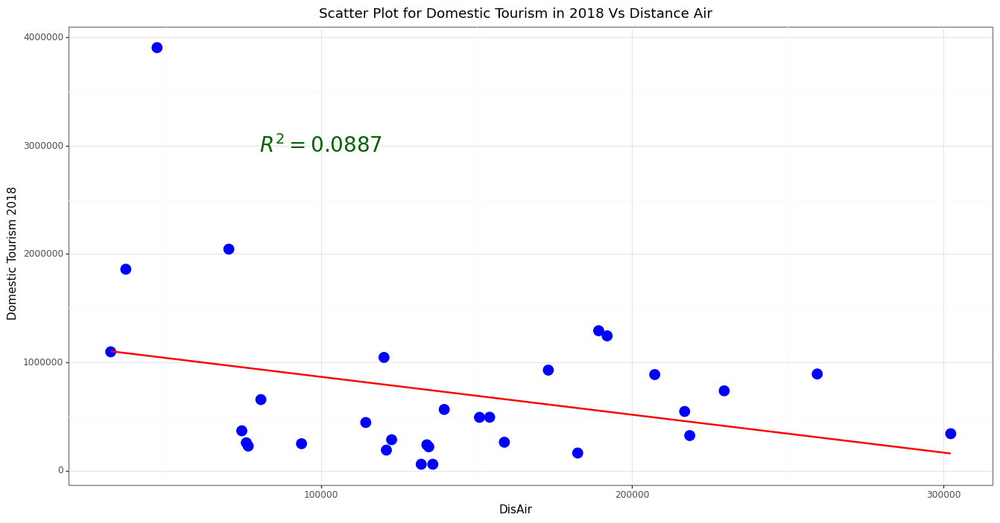

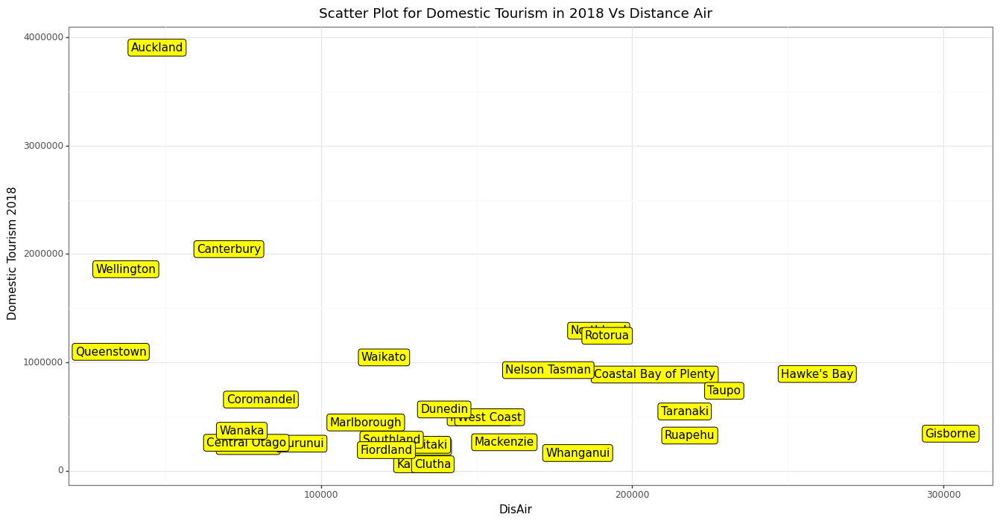

<IPython.core.display.Math object>

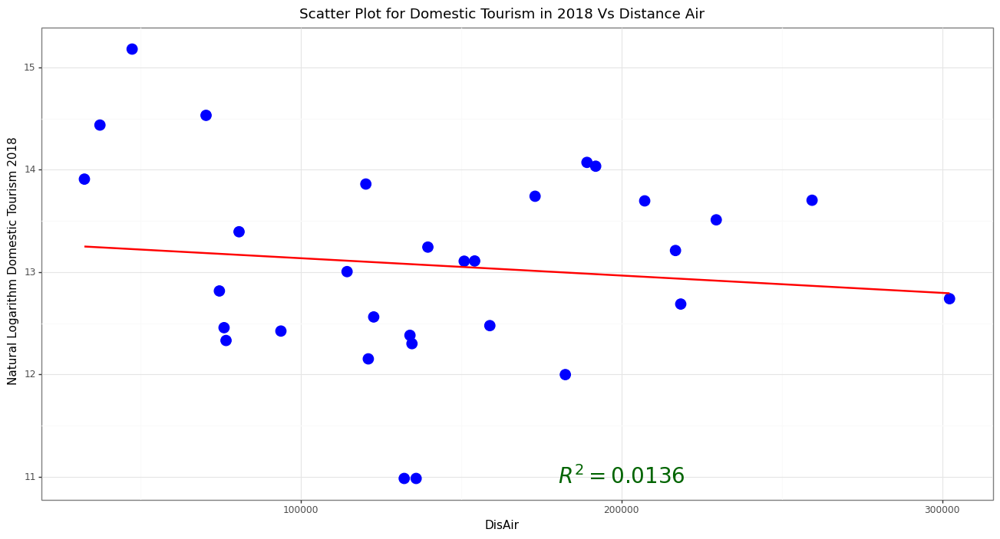

In [16]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y1)
preds91 = Model91.predict(x8)
R291 = r2_score(y1, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat1, aes(x = 'DisAir', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance Air", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0887$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'DisAir', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance Air", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model92 = regr.fit(x8, y1_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y1_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))

P2 = (ggplot(dat1, aes(x = 'DisAir', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance Air", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0136$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Distance City



<IPython.core.display.Math object>

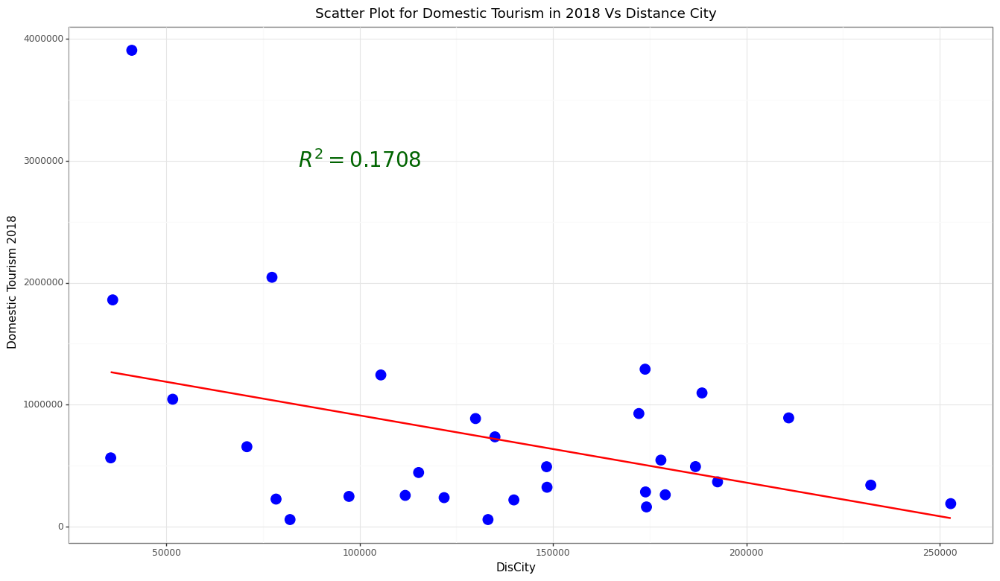

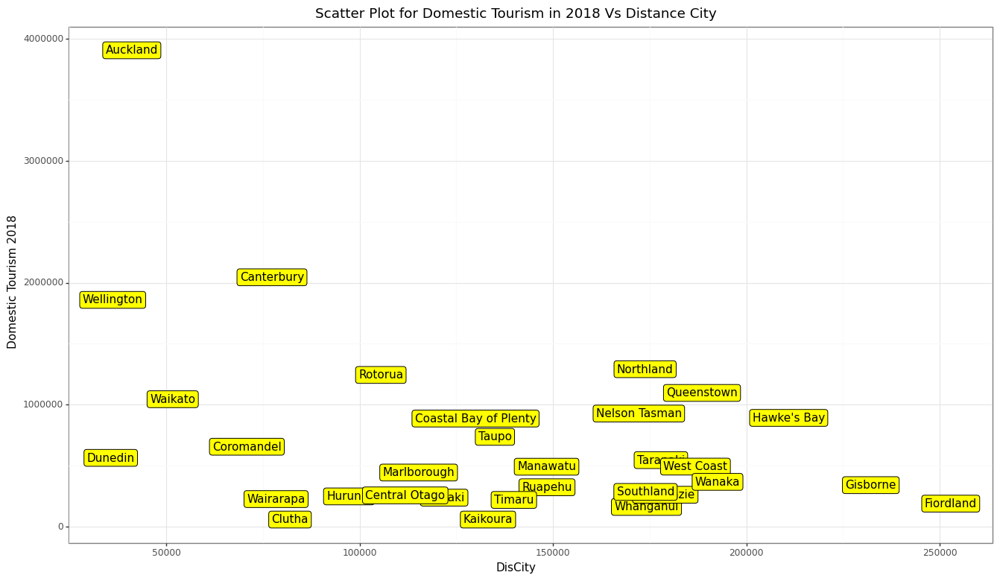

<IPython.core.display.Math object>

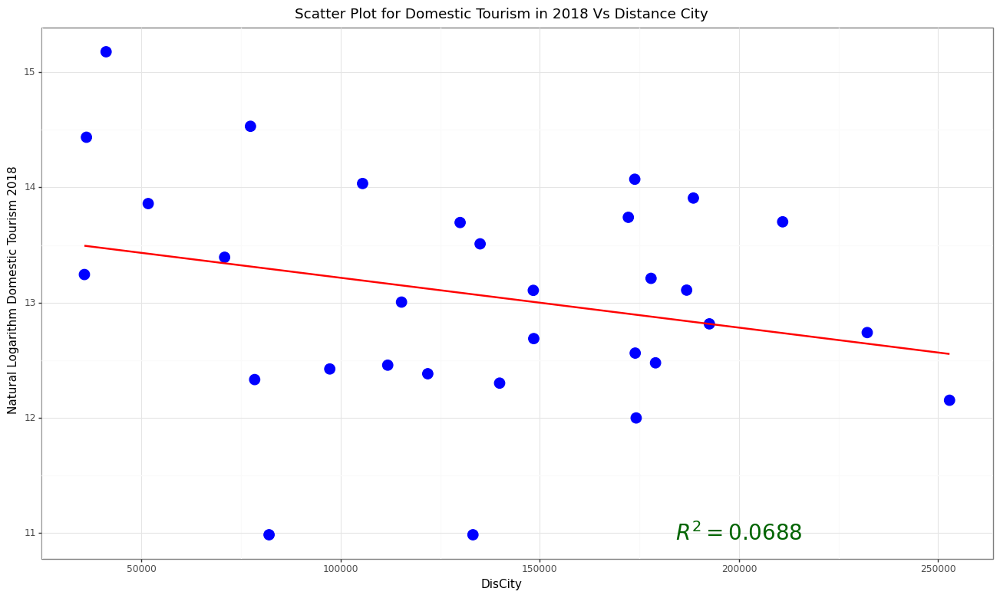

In [17]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y1)
preds91 = Model91.predict(x9)
R291 = r2_score(y1, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat1, aes(x = 'DisCity', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.1708$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'DisCity', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)
#### get logarithm of y


Model92 = regr.fit(x9, y1_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y1_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat1, aes(x = 'DisCity', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0688$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>


#### Define a Model With all variables

In [18]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y1, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
xx = scaler.fit_transform(X)

xx2 = sm.add_constant(xx)

model2 = sm.OLS(y1, xx2).fit()
print_model2 = model2.summary()
print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y1_log, xx2).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:             Dom_18_Ann   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.350
Method:                 Least Squares   F-statistic:                     2.617
Date:                Thu, 25 May 2023   Prob (F-statistic):             0.0322
Time:                        03:51:59   Log-Likelihood:                -450.74
No. Observations:                  31   AIC:                             923.5
Df Residuals:                      20   BIC:                             939.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         7.748e+05   5.21e+05      1.488   

<br><br>
<hr><hr>
<br><br>


#### Get Correlation Matrix Between Variables

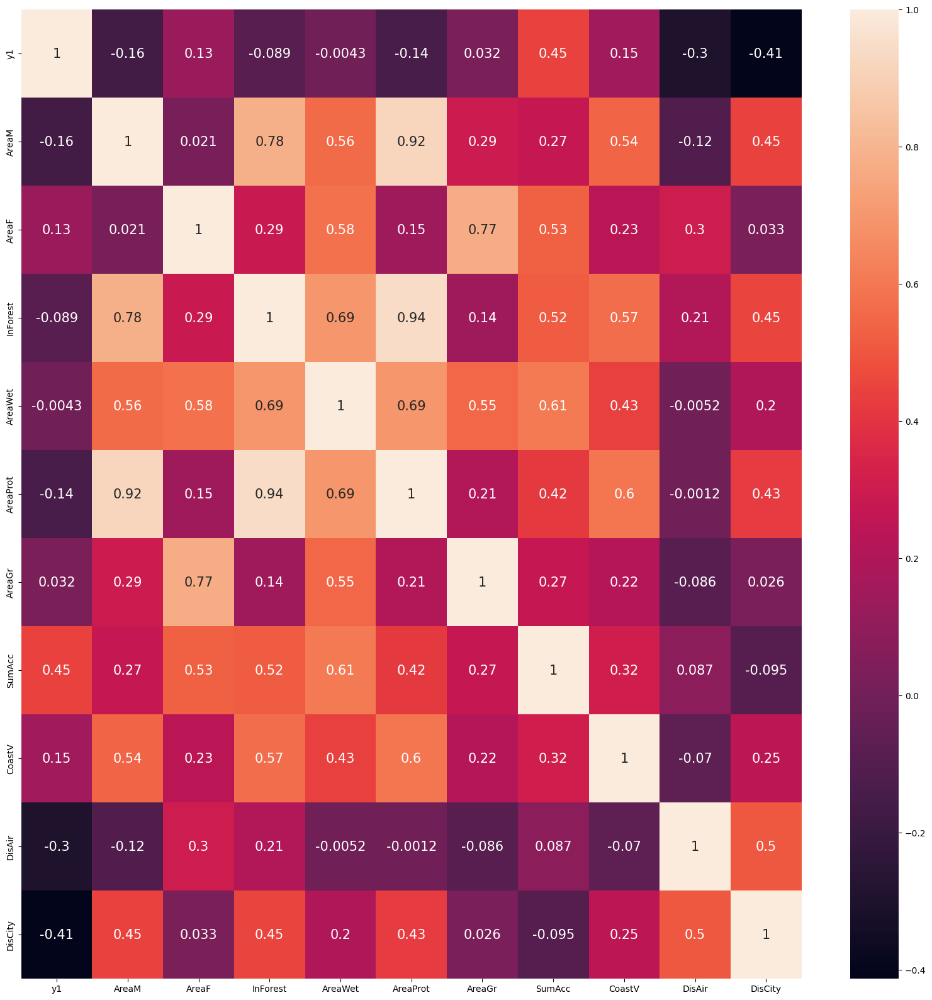

<Figure size 2000x2000 with 0 Axes>

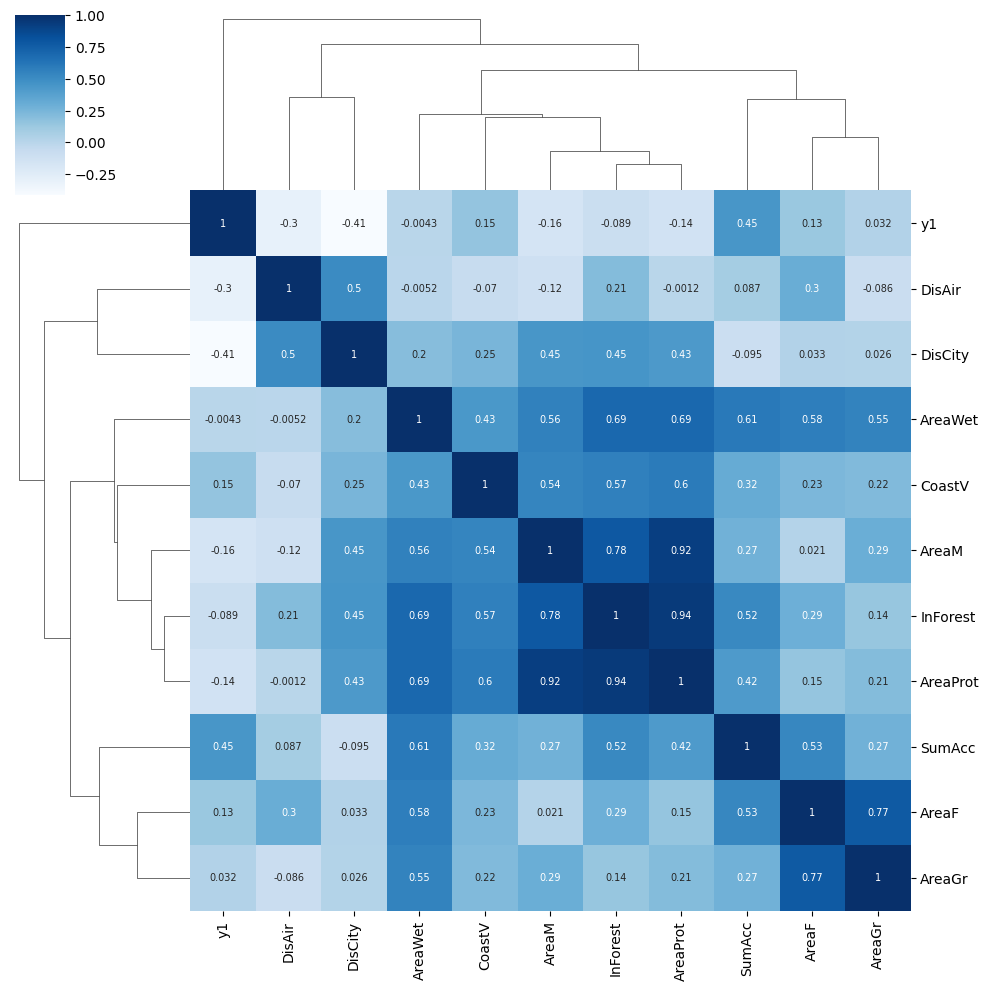

In [19]:
dat1_corr = dat1.drop(['y1_log', 'RTO_Names'], axis = 1)
dat1_corr.columns
dat1_corrr = dat1_corr.corr()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat1_corrr, annot = True, annot_kws = {"size" : 15})
plt.show()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat1_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

In [20]:
X_new = X.drop(['Area_Wetland', 'Dis_Airpo', 'Indi_Forest', 'Area_Protect'], axis = 1)

temp1 = X_new.columns
temp1
xx = scaler.fit_transform(X_new)
xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y1, xx).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y1_log, xx).fit()
print_model3 = model3.summary()
print(print_model3)

                                 OLS Regression Results                                
Dep. Variable:             Dom_18_Ann   R-squared (uncentered):                   0.675
Model:                            OLS   Adj. R-squared (uncentered):              0.597
Method:                 Least Squares   F-statistic:                              8.640
Date:                Thu, 25 May 2023   Prob (F-statistic):                    3.84e-05
Time:                        03:52:00   Log-Likelihood:                         -456.29
No. Observations:                  31   AIC:                                      924.6
Df Residuals:                      25   BIC:                                      933.2
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br>
<hr><hr><hr><hr>
<br><br><br><br>


## Domestic Tourism 2021

#### define data for Domestic Tourism in 2021

In [21]:
y2 = dat_org['Dom_21_Ann']
y2_log = np.log(y2)
dat2 = pd.concat([y2, X], axis = 1, join = "outer")
dat2.index = dat_org['RTO_Name']
dat2.columns =  ['y2', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 
'AreaGr', 'SumAcc', 'CoastV', 'DisAir', 'DisCity']
dat2['RTO_Names']= dat_org['RTO_Name'].values
dat2['y2_log'] = y2_log.values
dat2
dat2.columns

Index(['y2', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 'AreaGr',
       'SumAcc', 'CoastV', 'DisAir', 'DisCity', 'RTO_Names', 'y2_log'],
      dtype='object')

#### For Area Mount

<IPython.core.display.Math object>

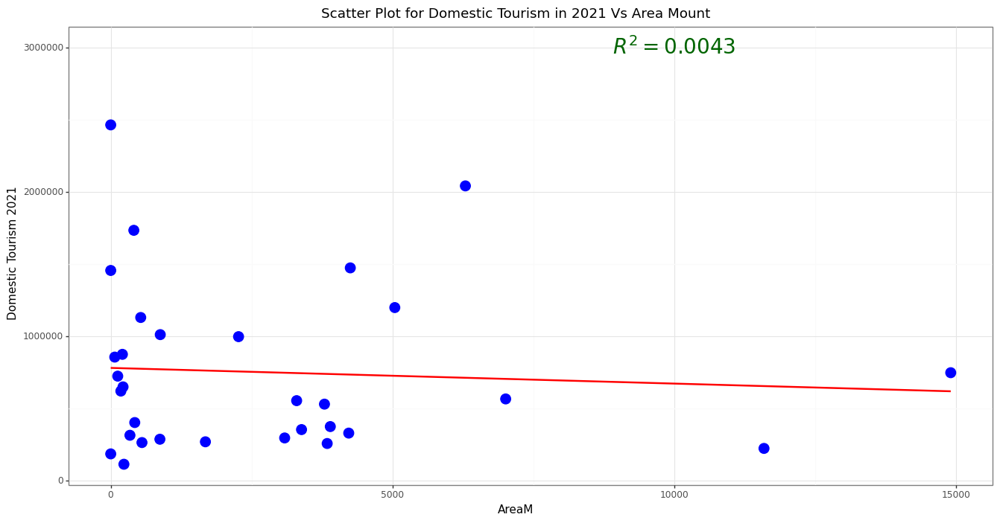

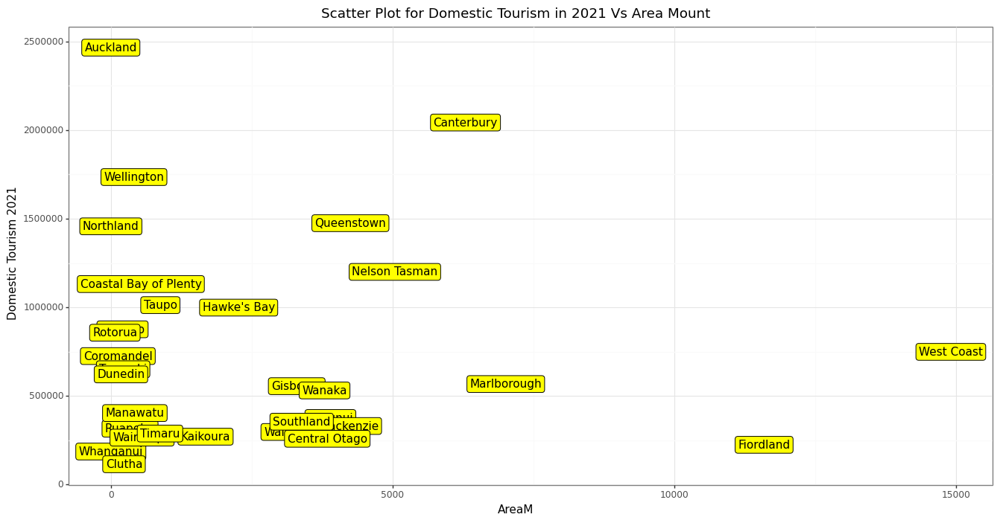

<IPython.core.display.Math object>

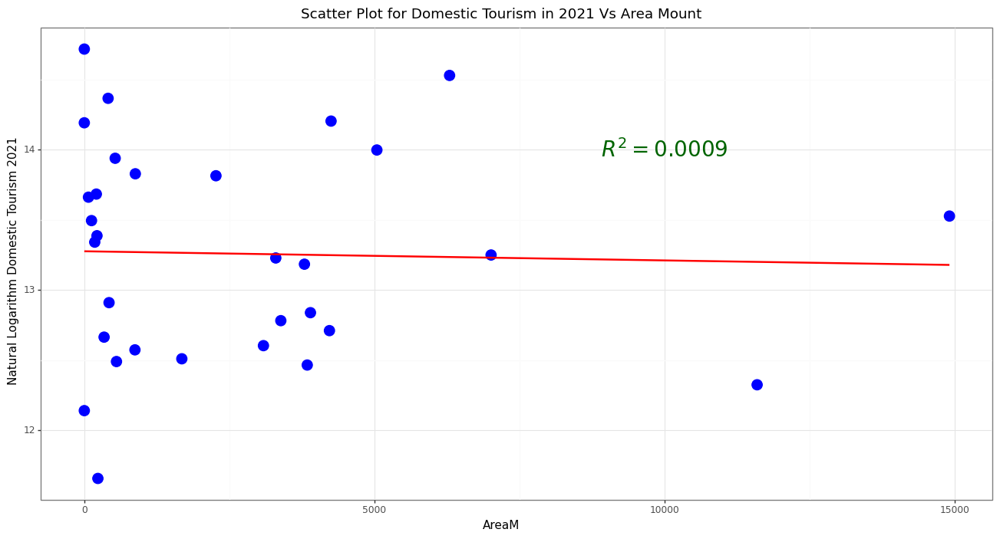

In [22]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y2)
preds = Model1.predict(x)
R2 = r2_score(y2, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat2, aes(x = 'AreaM', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0043$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaM', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y



Model2 = regr.fit(x, y2_log)
preds2 = Model2.predict(x)
R22 = r2_score(y2_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))

P2 = (ggplot(dat2, aes(x = 'AreaM', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0009$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Area Flat

<IPython.core.display.Math object>

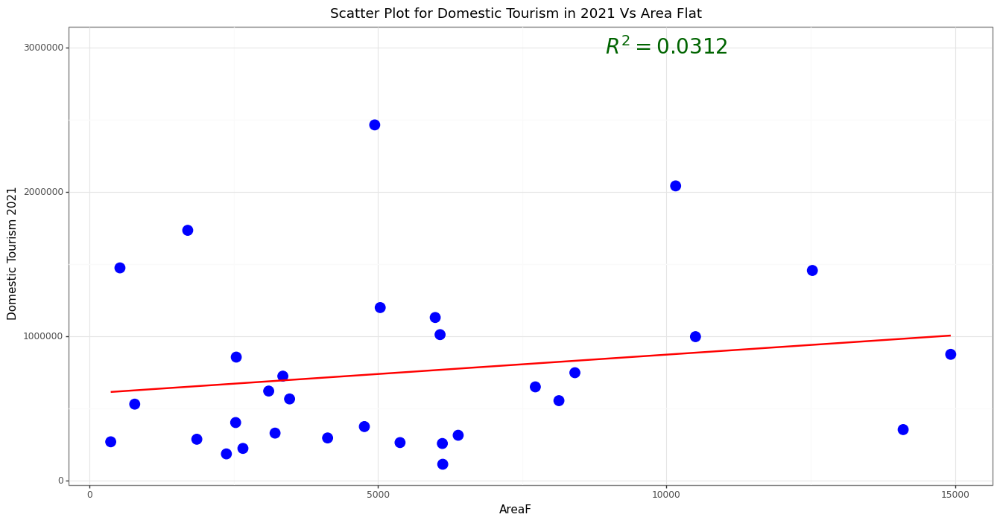

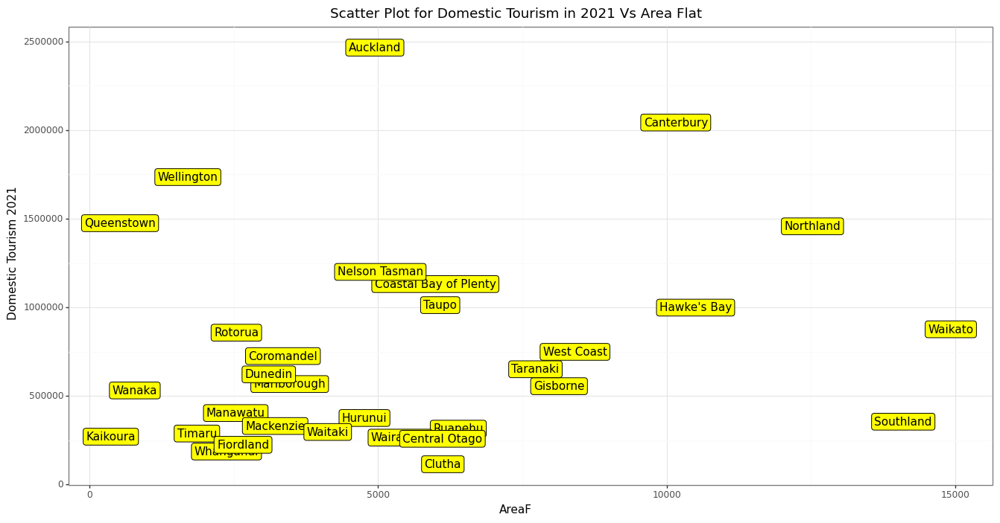

<IPython.core.display.Math object>

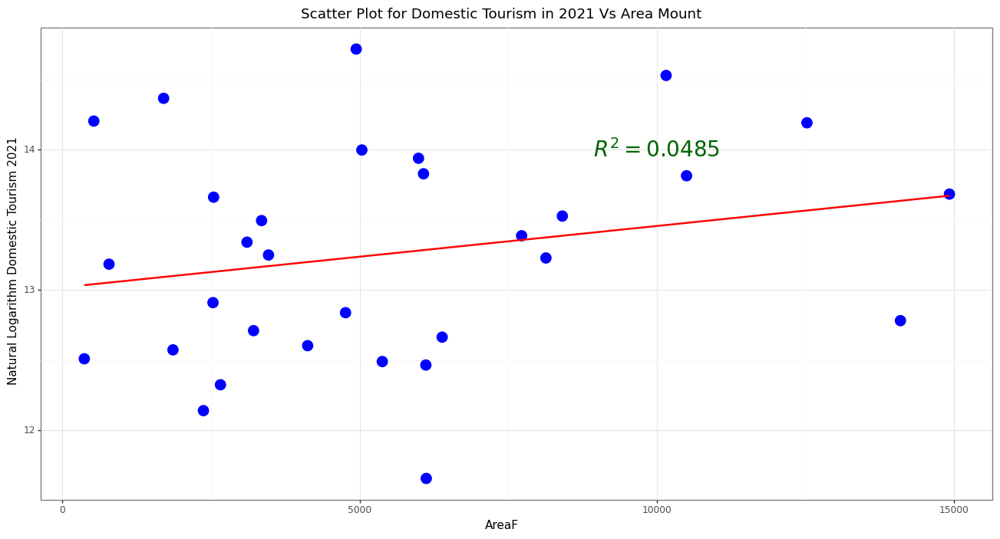

In [23]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y2)
preds21 = Model2.predict(x1)
R2 = r2_score(y2, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat2, aes(x = 'AreaF', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Flat", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0312$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaF', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Flat", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model22 = regr.fit(x1, y2_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y2_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))

P2 = (ggplot(dat2, aes(x = 'AreaF', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0485$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Area InForest

<IPython.core.display.Math object>

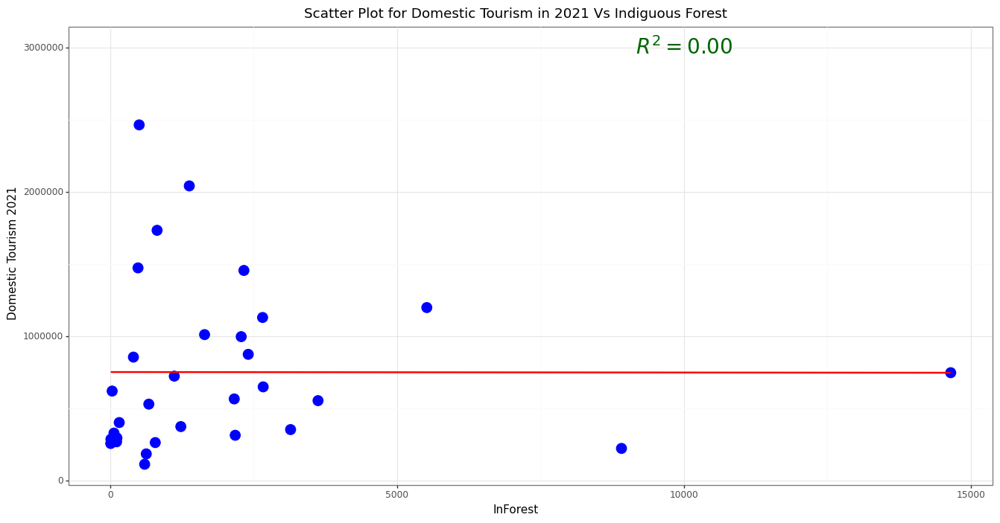

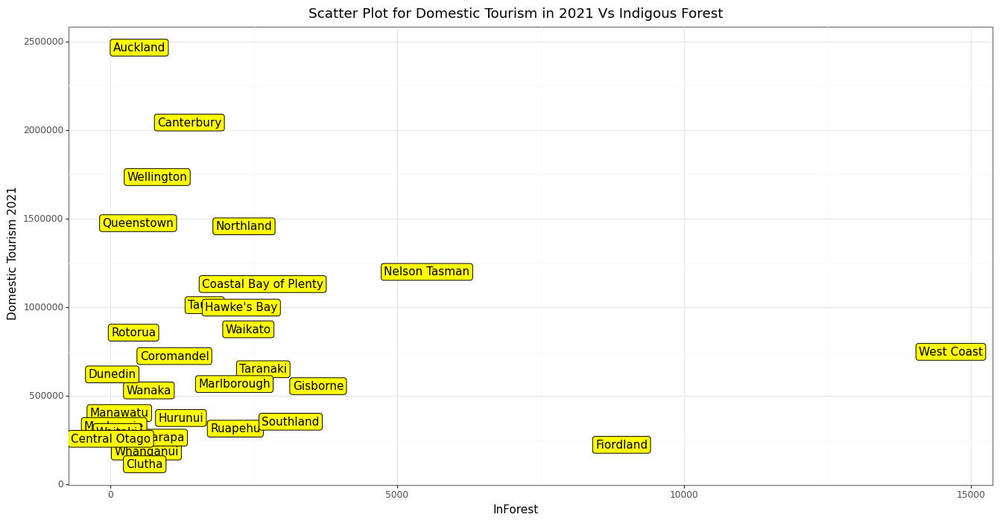

<IPython.core.display.Math object>

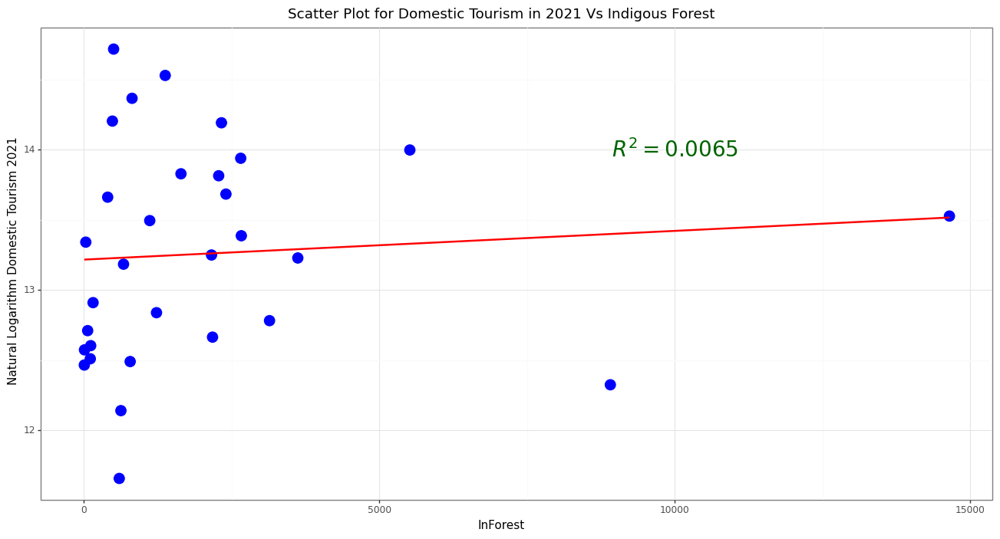

In [24]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y2)
preds31 = Model3.predict(x2)
R231 = r2_score(y2, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat2, aes(x = 'InForest', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indiguous Forest", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.00$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot

P = (ggplot(dat2, aes(x = 'InForest', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indigous Forest", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model32 = regr.fit(x2, y2_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y2_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))


P2 = (ggplot(dat2, aes(x = 'InForest', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indigous Forest", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0065$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Area Wetland

<IPython.core.display.Math object>

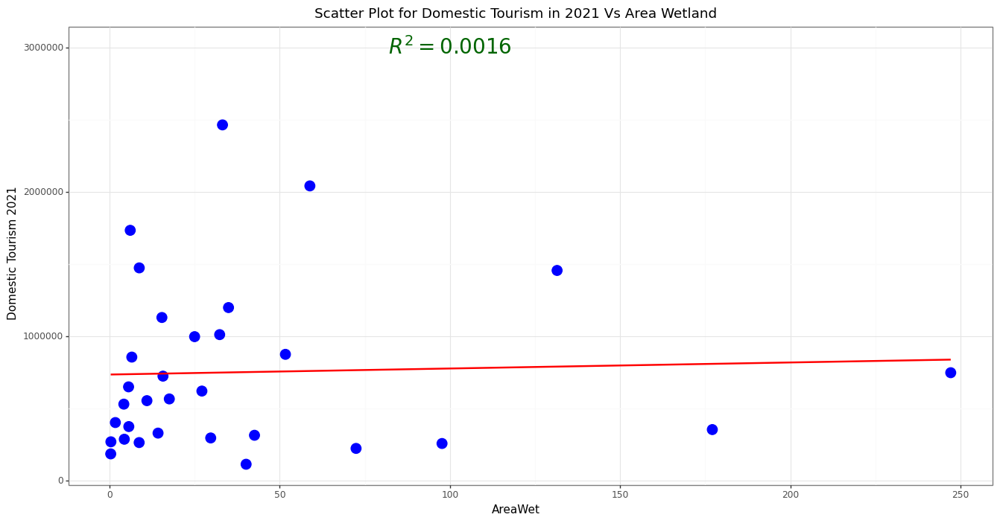

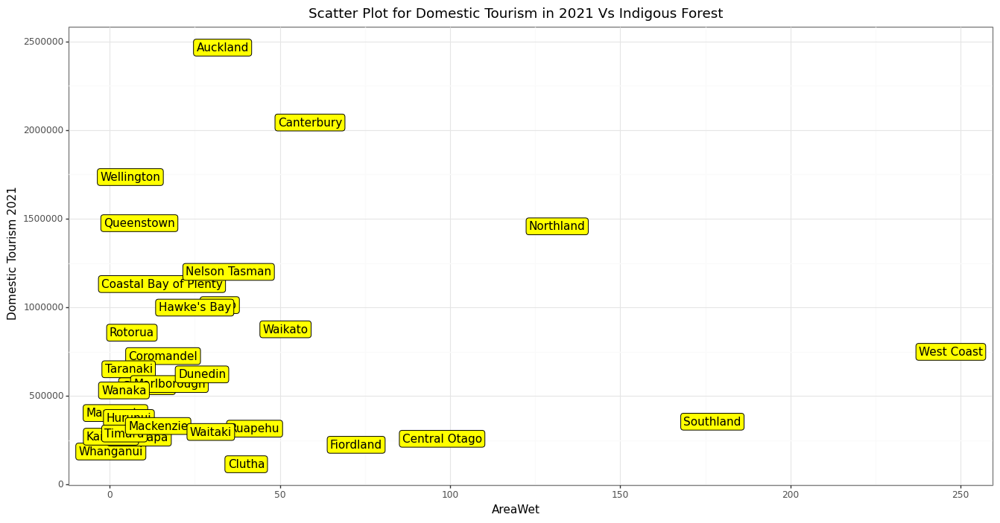

<IPython.core.display.Math object>

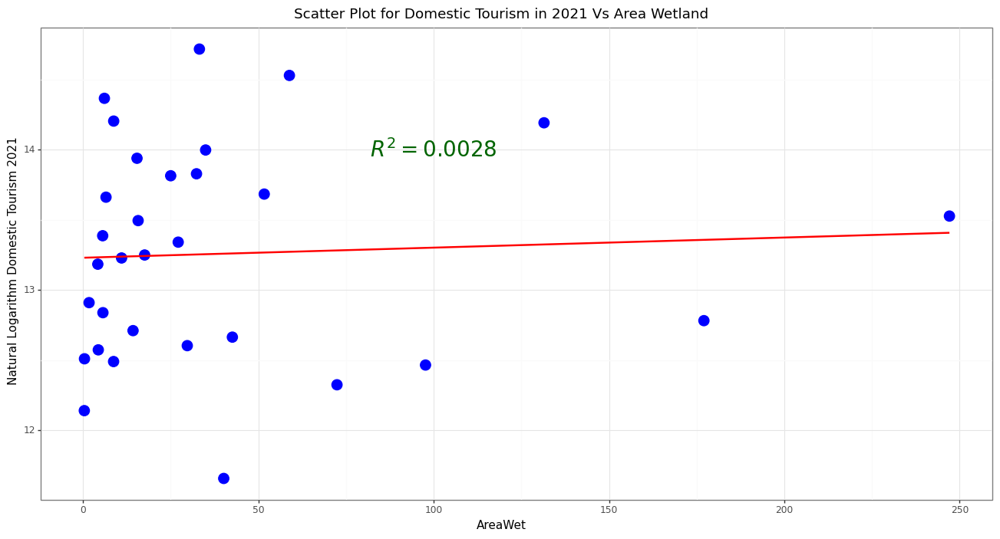

In [25]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y2)
preds41 = Model41.predict(x3)
R241 = r2_score(y2, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))

P1 = (ggplot(dat2, aes(x = 'AreaWet', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Wetland", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100,  y = 3000000, label = r"$R^2 = 0.0016$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaWet', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indigous Forest", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model42 = regr.fit(x3, y2_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y2_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))


P2 = (ggplot(dat2, aes(x = 'AreaWet', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Wetland", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 100, y = 14, label = r"$R^2 = 0.0028$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Area Protect

<IPython.core.display.Math object>

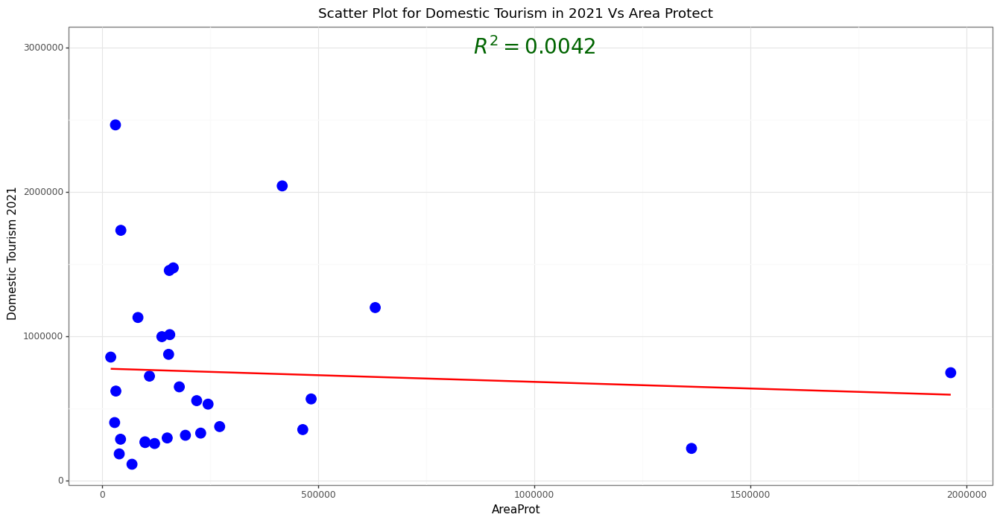

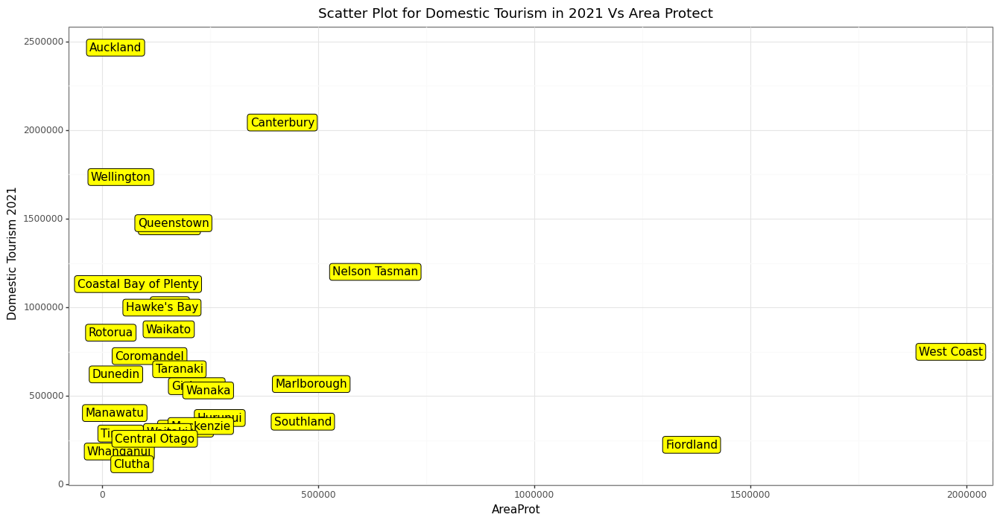

<IPython.core.display.Math object>

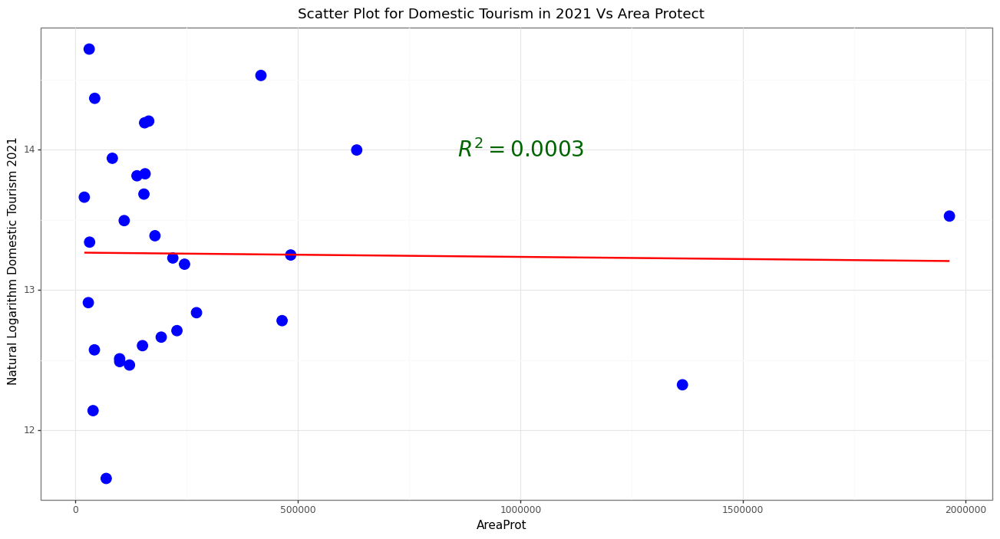

In [26]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y2)
preds51 = Model51.predict(x4)
R251 = r2_score(y2, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))


P1 = (ggplot(dat2, aes(x = 'AreaProt', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Protect", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000,  y = 3000000, label = r"$R^2 = 0.0042$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaProt', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Protect", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y2_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y2_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P2 = (ggplot(dat2, aes(x = 'AreaProt', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Protect", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000, y = 14, label = r"$R^2 = 0.0003$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Area Grass

<IPython.core.display.Math object>

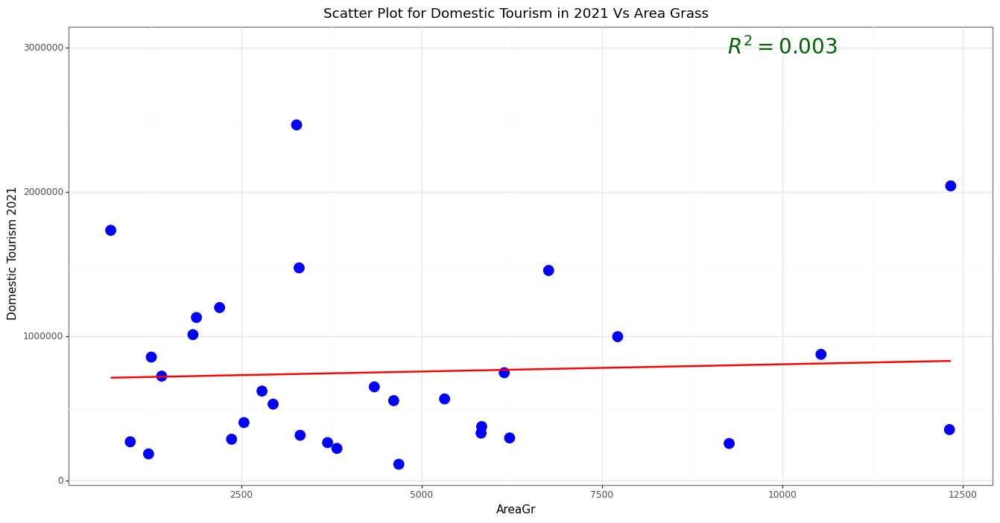

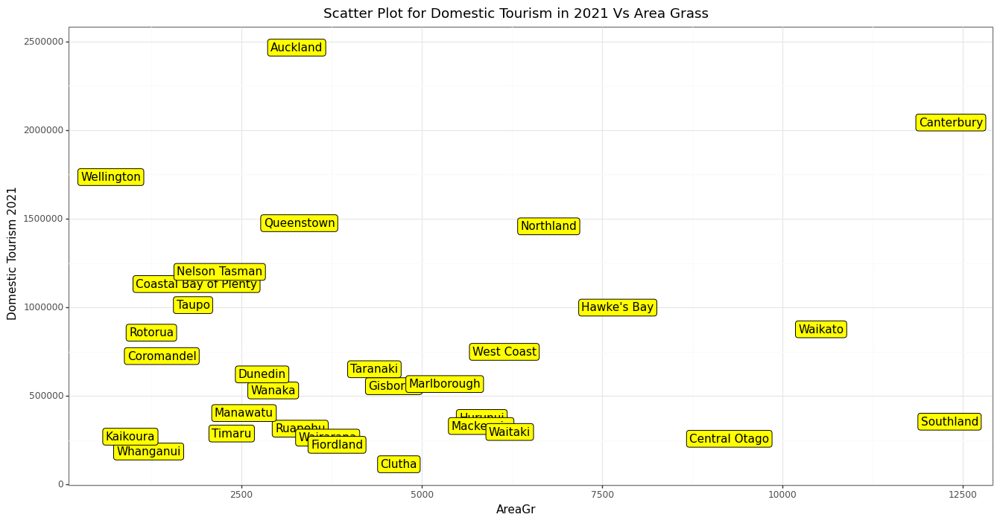

<IPython.core.display.Math object>

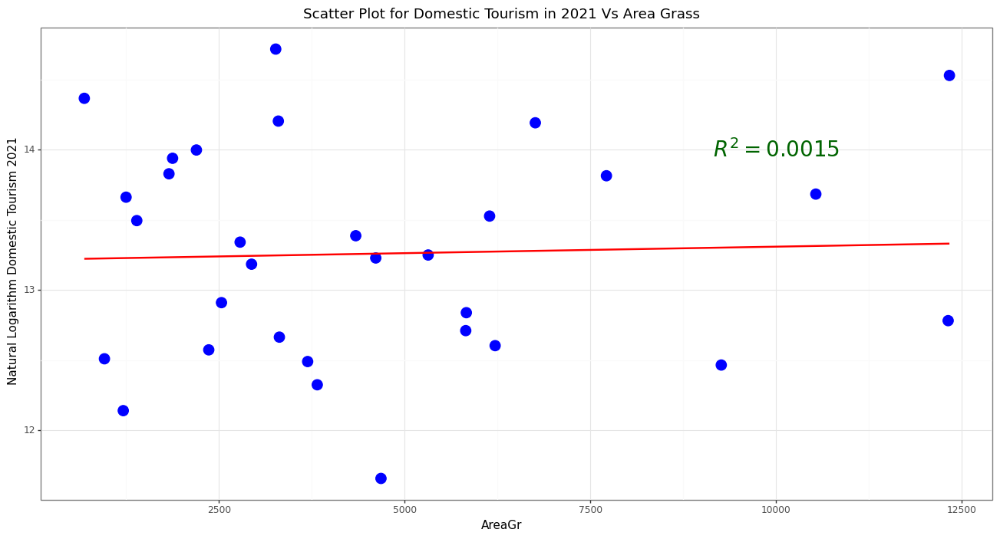

In [27]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y2)
preds61 = Model61.predict(x5)
R261 = r2_score(y2, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))


P1 = (ggplot(dat2, aes(x = 'AreaGr', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Grass", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000,  y = 3000000, label = r"$R^2 = 0.003$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'AreaGr', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Grass", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y2_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y2_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))


P2 = (ggplot(dat2, aes(x = 'AreaGr', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Grass", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0015$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>


#### For Sum ACCESS

<IPython.core.display.Math object>

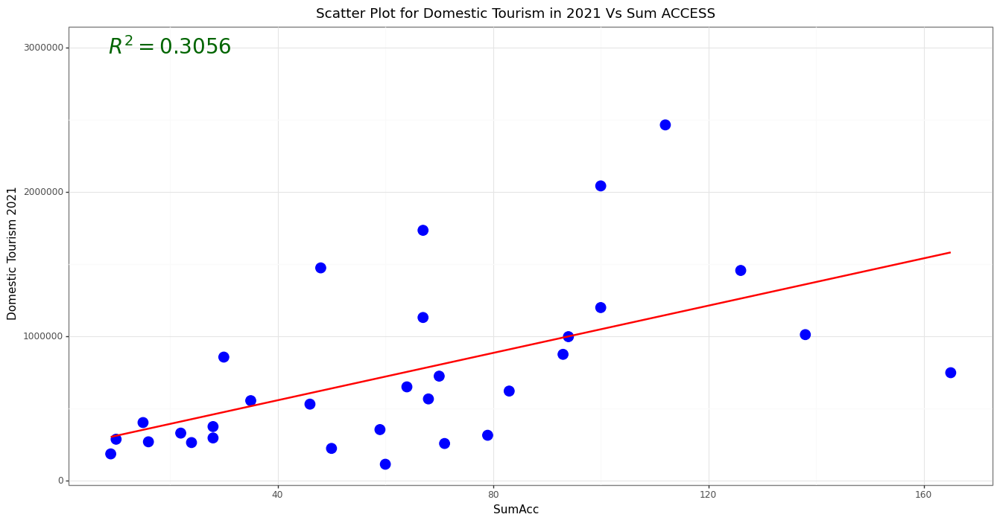

<IPython.core.display.Math object>

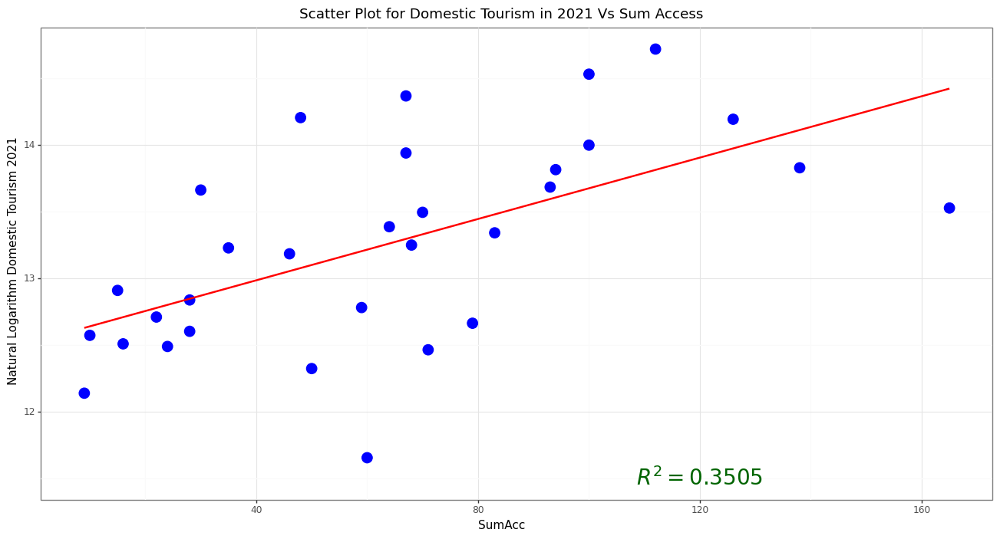

In [28]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y2)
preds71 = Model71.predict(x6)
R271 = r2_score(y2, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


P1 = (ggplot(dat2, aes(x = 'SumAcc', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Sum ACCESS", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 20,  y = 3000000, label = r"$R^2 = 0.3056$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'SumAcc', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Sum Access", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))


#### get logarithm of y


Model72 = regr.fit(x6, y2_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y2_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))

P2 = (ggplot(dat2, aes(x = 'SumAcc', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Sum Access", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 120, y = 11.5, label = r"$R^2 = 0.3505$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br>
<hr><hr>
<br><br>


#### For Coast View

<IPython.core.display.Math object>

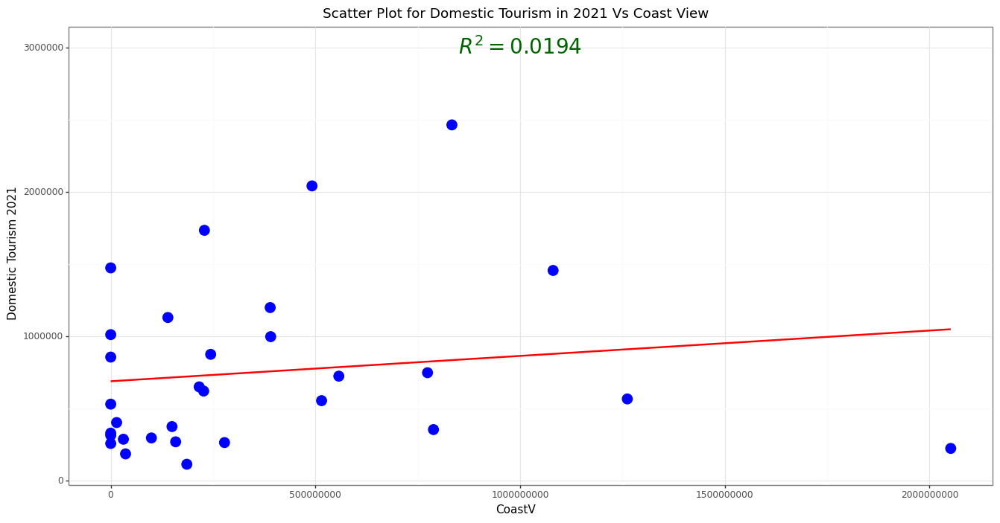

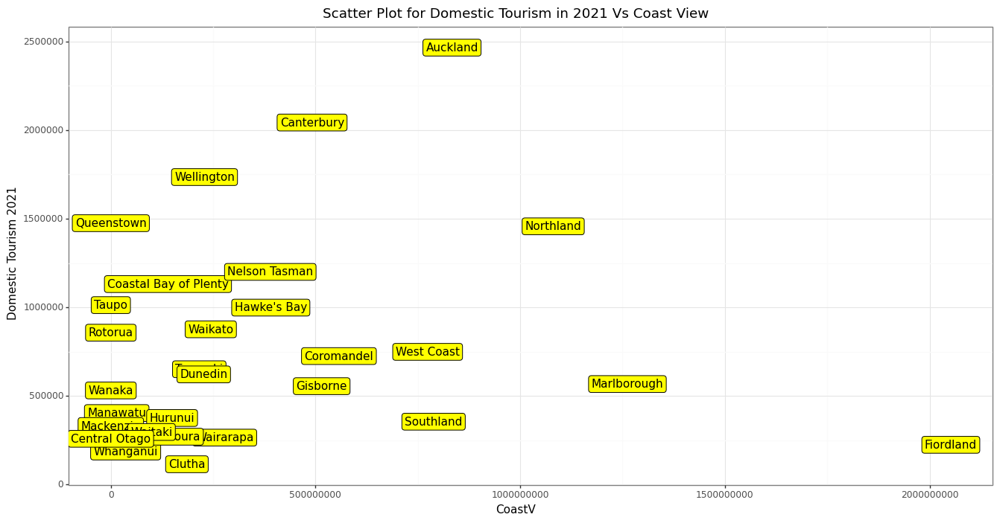

<IPython.core.display.Math object>

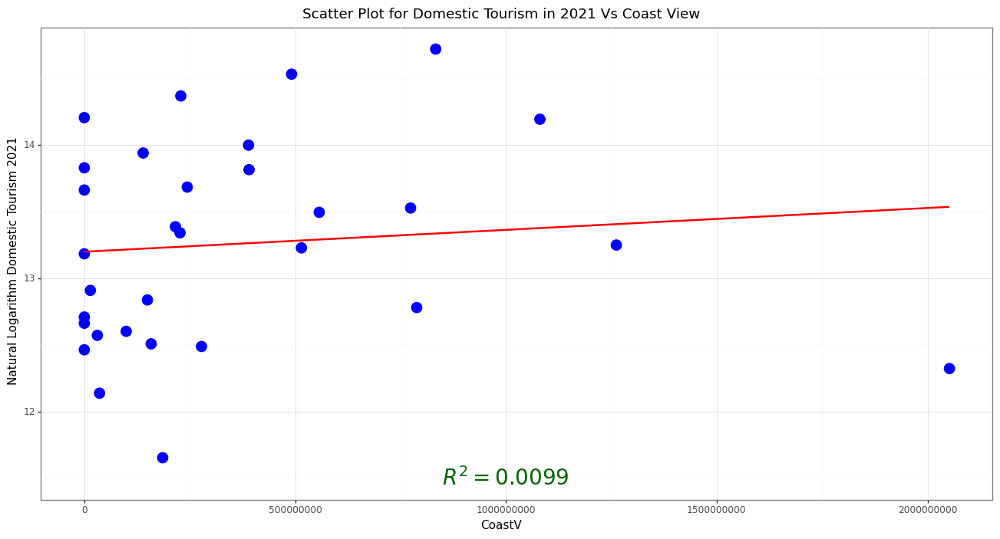

In [29]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y2)
preds81 = Model81.predict(x7)
R281 = r2_score(y2, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat2, aes(x = 'CoastV', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Coast View", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000000,  y = 3000000, label = r"$R^2 = 0.0194$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'CoastV', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Coast View", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model82 = regr.fit(x7, y2_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y2_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))

P2 = (ggplot(dat2, aes(x = 'CoastV', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Coast View", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000000, y = 11.5, label = r"$R^2 = 0.0099$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Distance AirPort

<IPython.core.display.Math object>

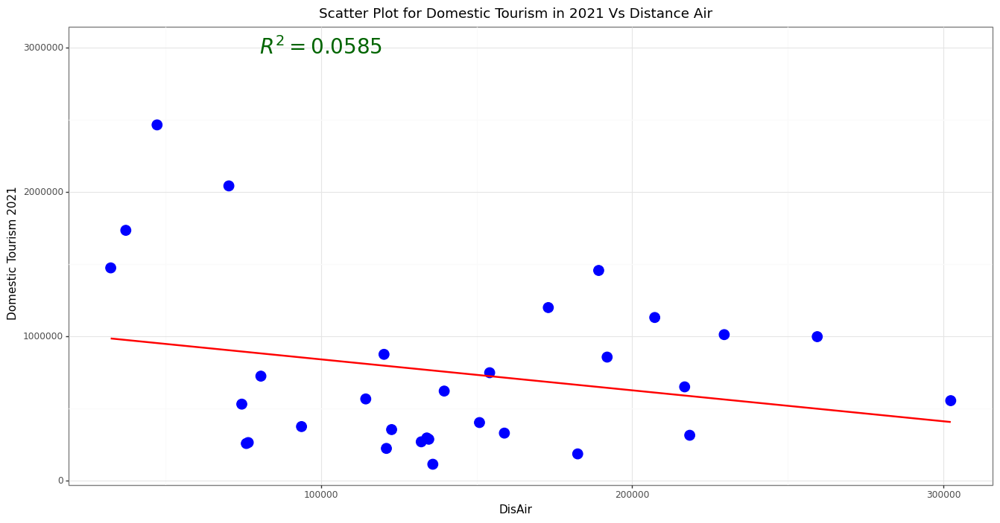

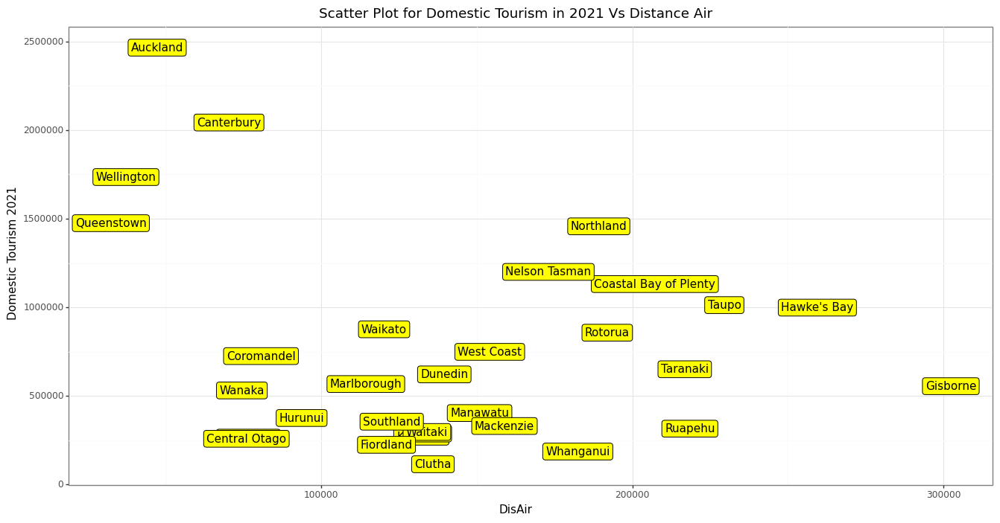

<IPython.core.display.Math object>

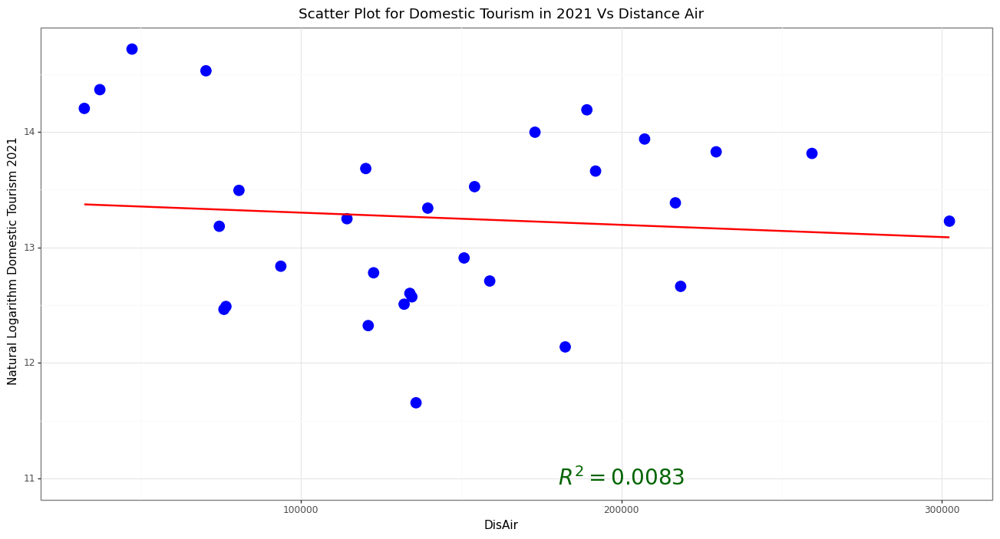

In [30]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y2)
preds91 = Model91.predict(x8)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat2, aes(x = 'DisAir', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Distance Air", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0585$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat2, aes(x = 'DisAir', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Distance Air", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model92 = regr.fit(x8, y2_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'DisAir', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Distance Air", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0083$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>
<br><br>


#### For Distance City

<IPython.core.display.Math object>

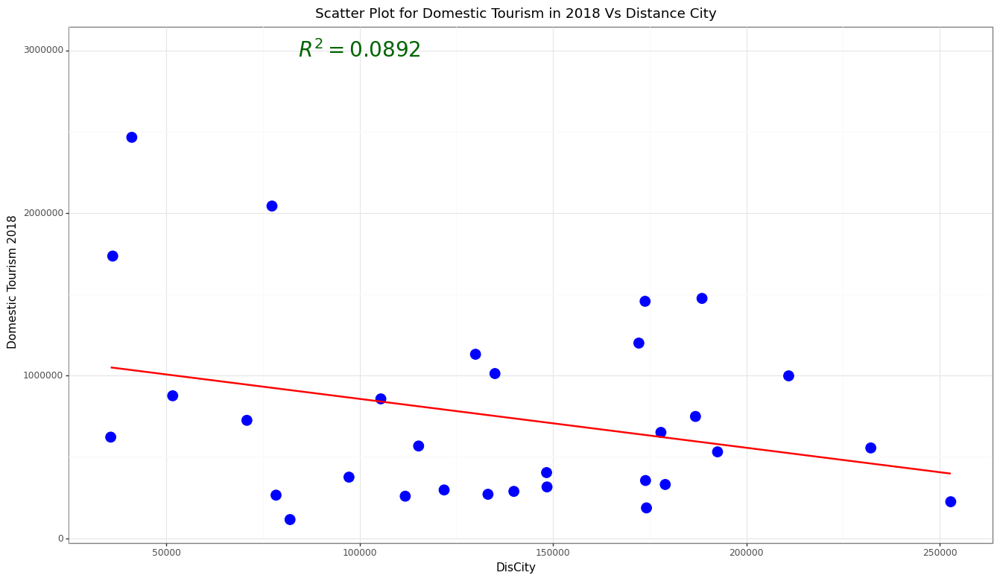

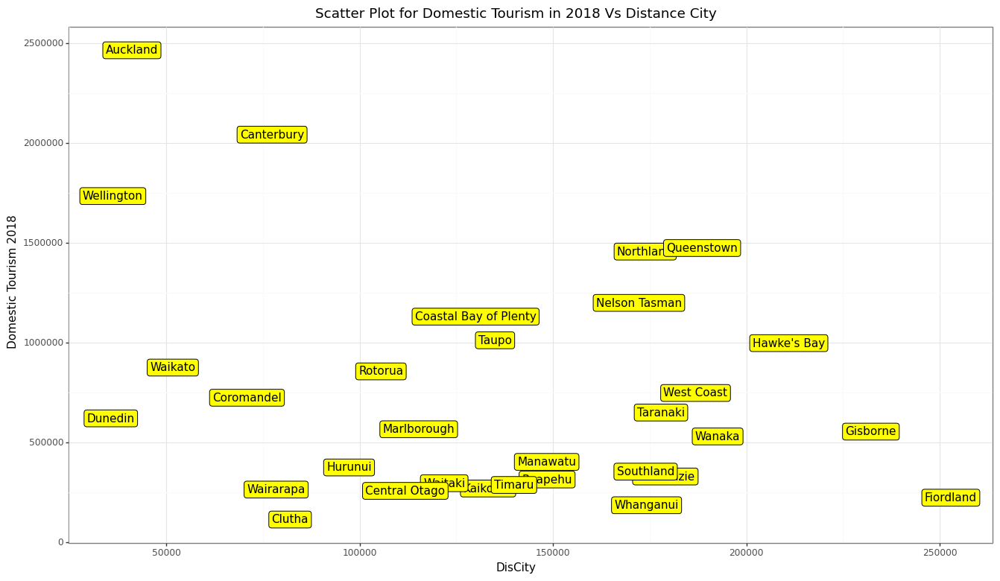

<IPython.core.display.Math object>

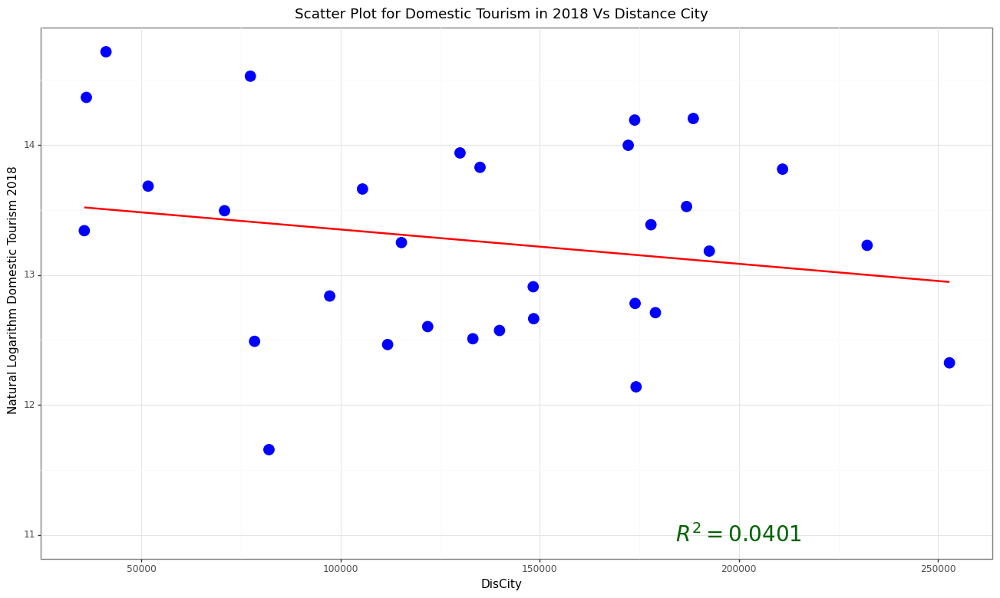

In [31]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y2)
preds91 = Model91.predict(x9)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat2, aes(x = 'DisCity', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0892$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat2, aes(x = 'DisCity', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))
print(P)

#### get logarithm of y


Model92 = regr.fit(x9, y2_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'DisCity', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0401$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>


#### Define a Model With all variables

In [32]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y2, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
xx2 = scaler.fit_transform(X)

xx3 = sm.add_constant(xx2)

model2 = sm.OLS(y2, xx3).fit()
print_model2 = model2.summary()
print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y2_log, xx3).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:             Dom_21_Ann   R-squared:                       0.656
Model:                            OLS   Adj. R-squared:                  0.484
Method:                 Least Squares   F-statistic:                     3.816
Date:                Thu, 25 May 2023   Prob (F-statistic):            0.00522
Time:                        03:52:05   Log-Likelihood:                -438.43
No. Observations:                  31   AIC:                             898.9
Df Residuals:                      20   BIC:                             914.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         6.411e+05    3.5e+05      1.831   

<br><br>
<hr><hr>
<br><br>



#### Get Correlation Matrix Between Variables

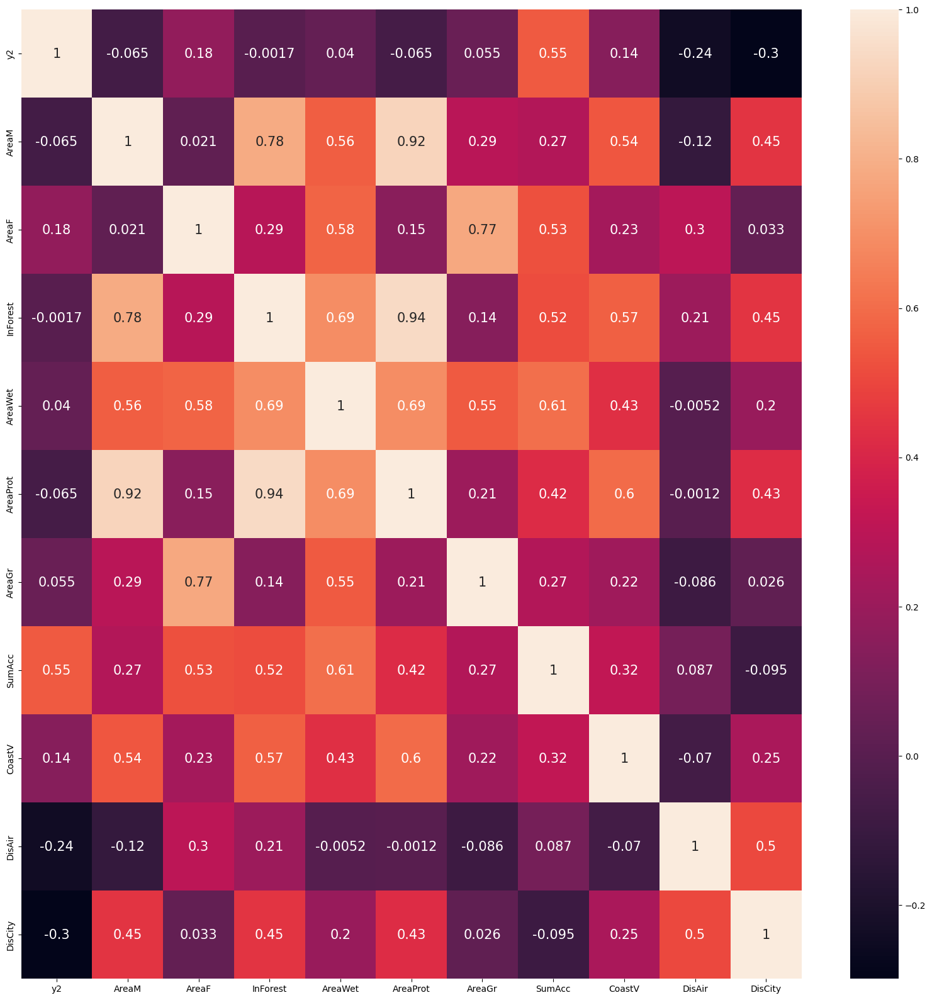

<Figure size 2000x2000 with 0 Axes>

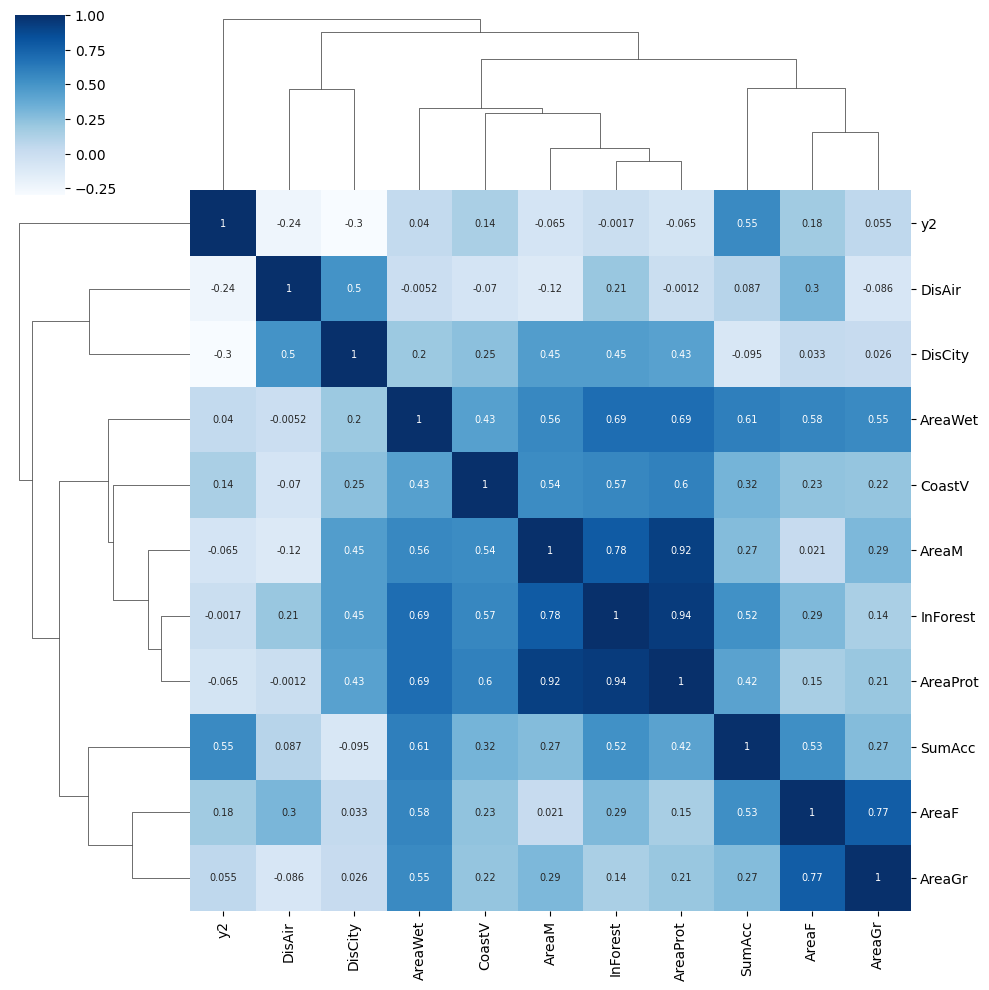

In [33]:
dat2_corr = dat2.drop(['y2_log', 'RTO_Names'], axis = 1)
dat2_corr.columns
dat2_corrr = dat2_corr.corr()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat2_corrr, annot = True, annot_kws = {"size" : 15})
plt.show()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat2_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

In [34]:
model = sm.OLS(y2, xx).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y2_log, xx).fit()
print_model3 = model3.summary()
print(print_model3)


                                 OLS Regression Results                                
Dep. Variable:             Dom_21_Ann   R-squared (uncentered):                   0.771
Model:                            OLS   Adj. R-squared (uncentered):              0.716
Method:                 Least Squares   F-statistic:                              14.01
Date:                Thu, 25 May 2023   Prob (F-statistic):                    6.13e-07
Time:                        03:52:05   Log-Likelihood:                         -447.71
No. Observations:                  31   AIC:                                      907.4
Df Residuals:                      25   BIC:                                      916.0
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br>
<hr><hr><hr><hr>
<br><br>

## International Tourism in 2018

#### Define data for International Tourism in 2018

In [35]:
y2 = dat_org['Dom_21_Ann']
y2_log = np.log(y2)
dat2 = pd.concat([y2, X], axis = 1, join = "outer")
dat2.index = dat_org['RTO_Name']
dat2.columns =  ['y2', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 
'AreaGr', 'SumAcc', 'CoastV', 'DisAir', 'DisCity']
dat2['RTO_Names']= dat_org['RTO_Name'].values
dat2['y2_log'] = y2_log.values
dat2
dat2.columns

Index(['y2', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 'AreaGr',
       'SumAcc', 'CoastV', 'DisAir', 'DisCity', 'RTO_Names', 'y2_log'],
      dtype='object')

<br><br>
<hr><hr>
<br><br>


#### For Area Mount




<IPython.core.display.Math object>

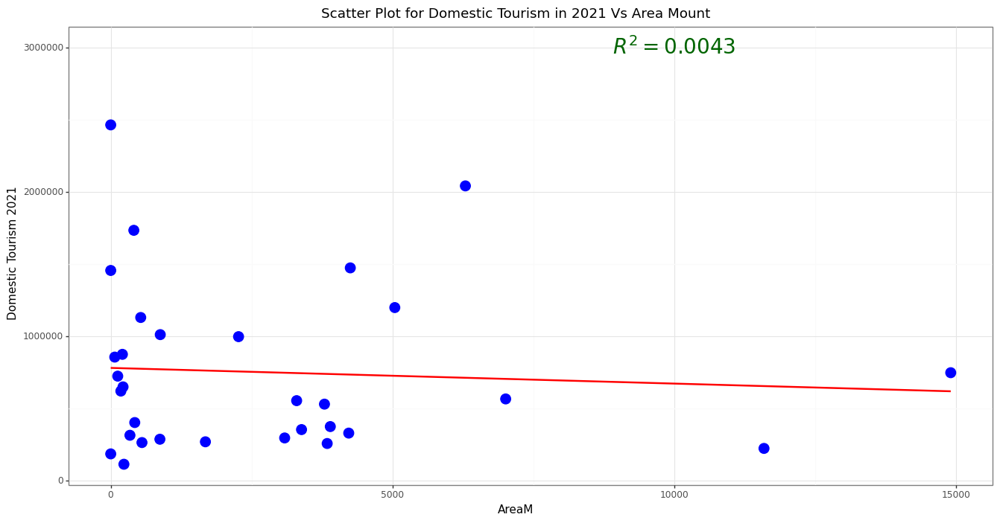

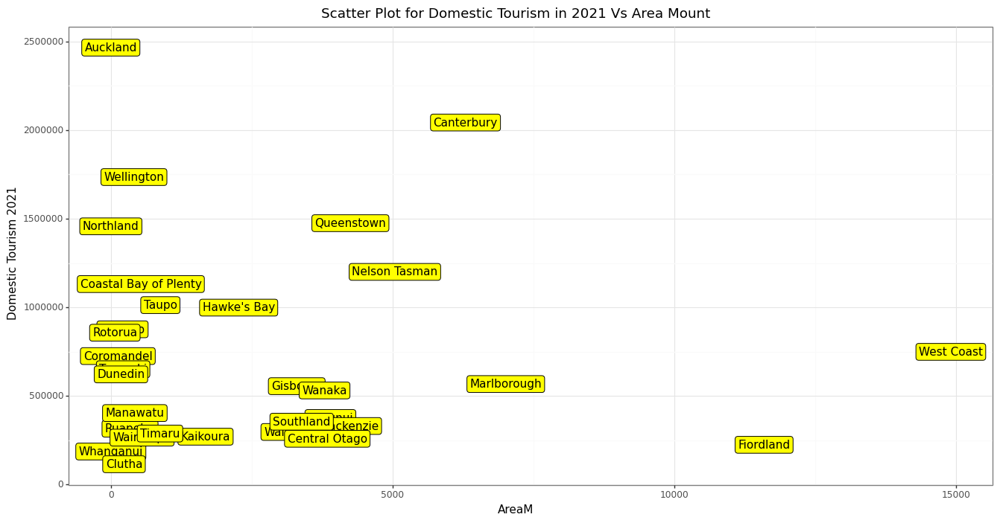

<IPython.core.display.Math object>

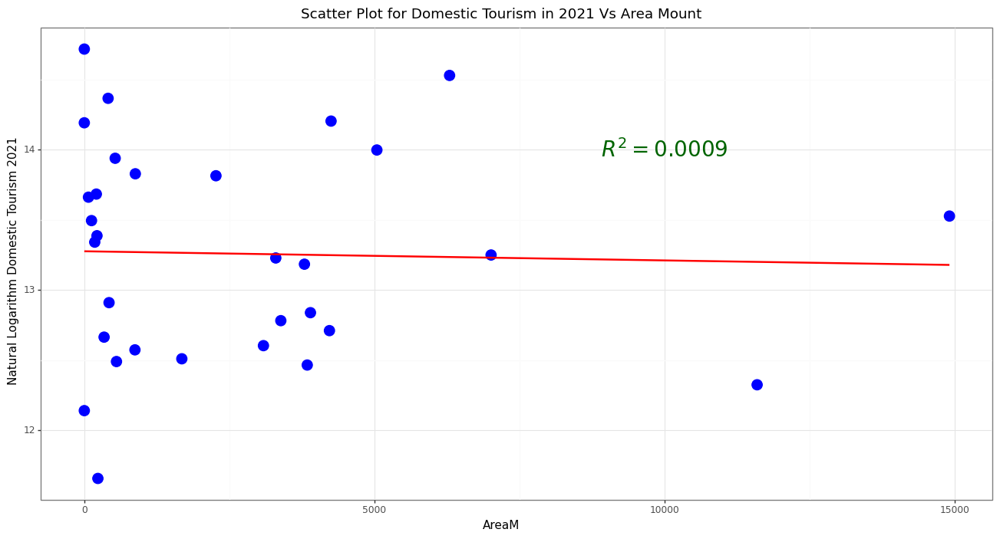

In [36]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y2)
preds = Model1.predict(x)
R2 = r2_score(y2, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat2, aes(x = 'AreaM', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0043$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaM', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P)
#### get logarithm of y



Model2 = regr.fit(x, y2_log)
preds2 = Model2.predict(x)
R22 = r2_score(y2_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))


P2 = (ggplot(dat2, aes(x = 'AreaM', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0009$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>



#### For Area Flat


<IPython.core.display.Math object>

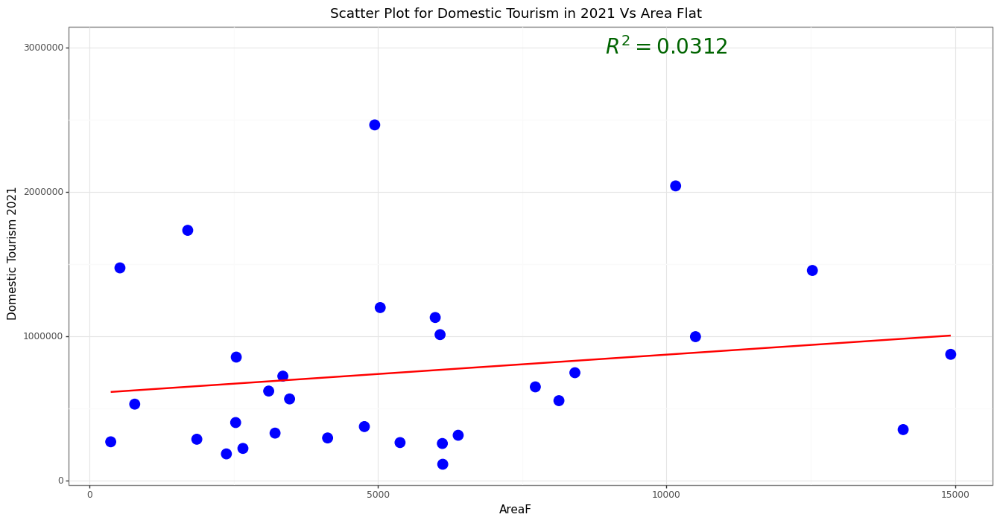

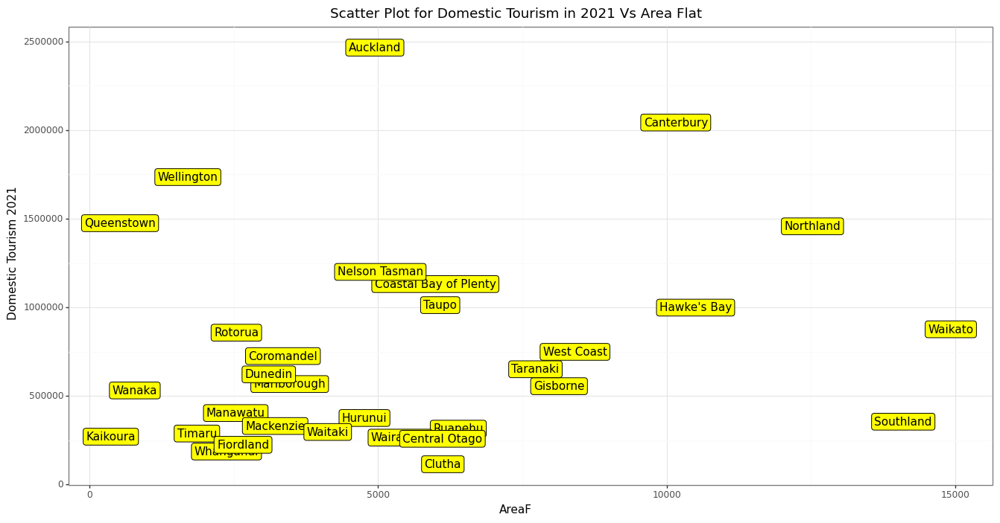

<IPython.core.display.Math object>

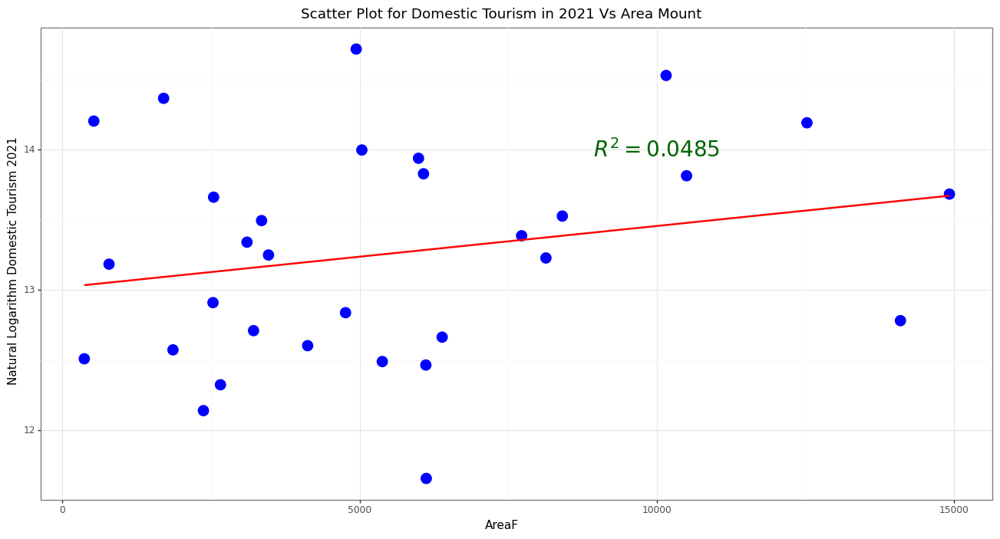

In [37]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y2)
preds21 = Model2.predict(x1)
R2 = r2_score(y2, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat2, aes(x = 'AreaF', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Flat", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0312$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaF', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Flat", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model22 = regr.fit(x1, y2_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y2_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))


P2 = (ggplot(dat2, aes(x = 'AreaF', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Mount", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0485$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br>
<hr><hr>
<br><br>


#### For Area InForest



<IPython.core.display.Math object>

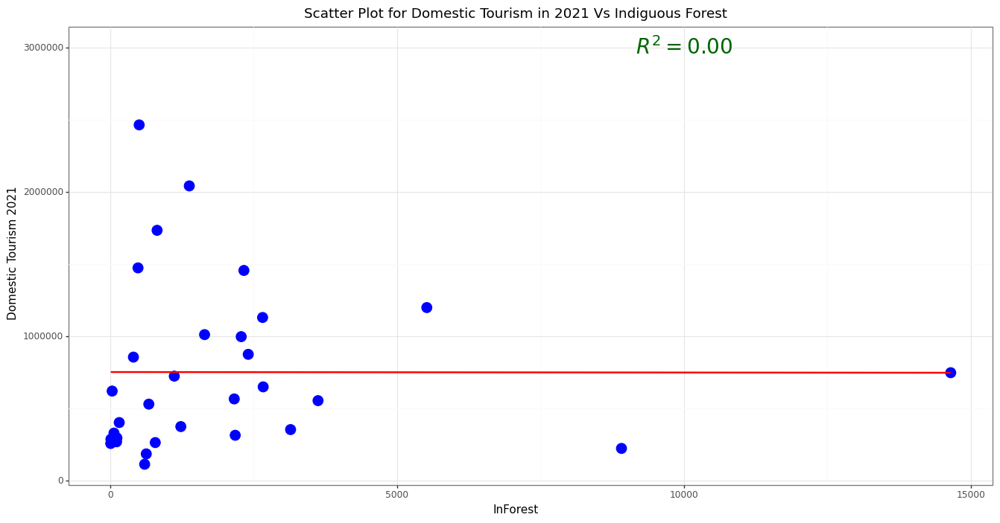

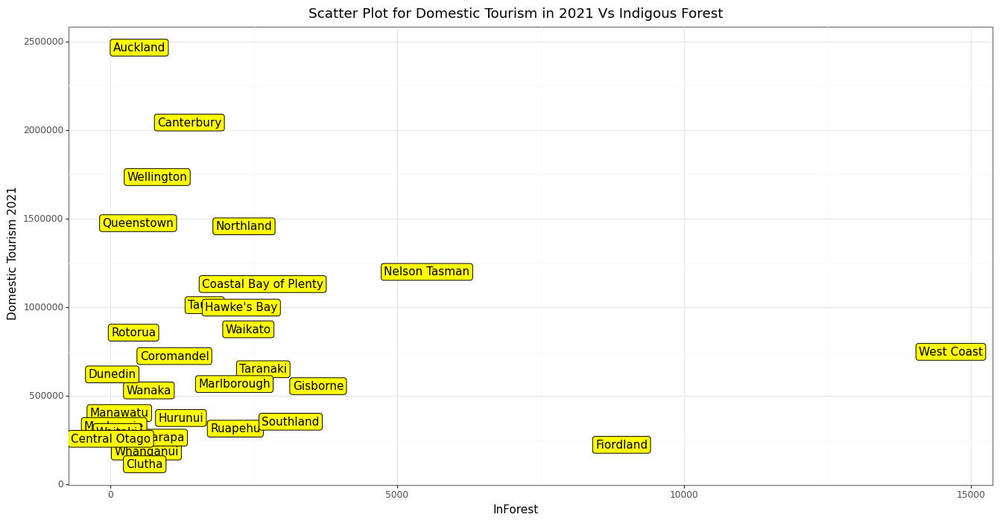

<IPython.core.display.Math object>

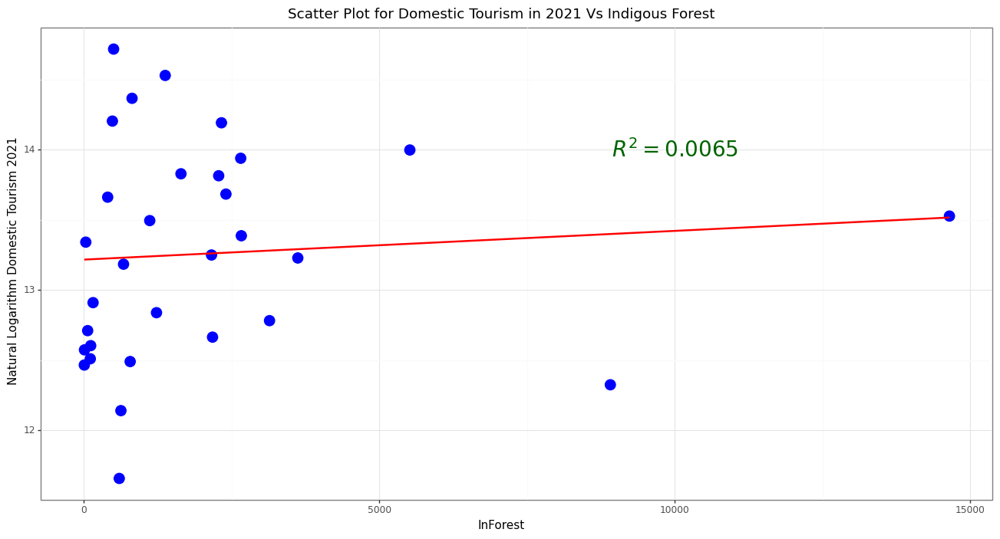

In [38]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y2)
preds31 = Model3.predict(x2)
R231 = r2_score(y2, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat2, aes(x = 'InForest', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indiguous Forest", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.00$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'InForest', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indigous Forest", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model32 = regr.fit(x2, y2_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y2_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))

P2 = (ggplot(dat2, aes(x = 'InForest', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indigous Forest", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0065$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br>
<hr><hr>
<br><br>


#### For Area Wetland

<IPython.core.display.Math object>

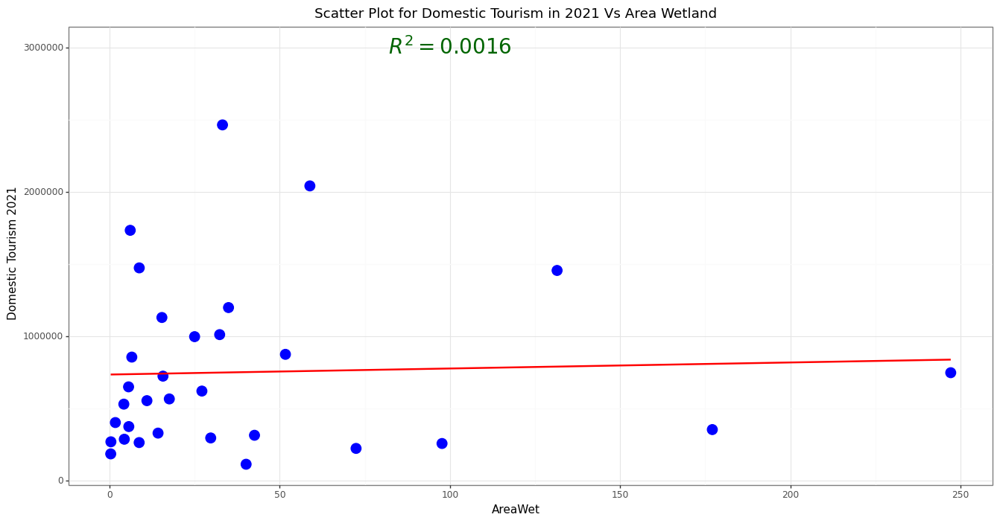

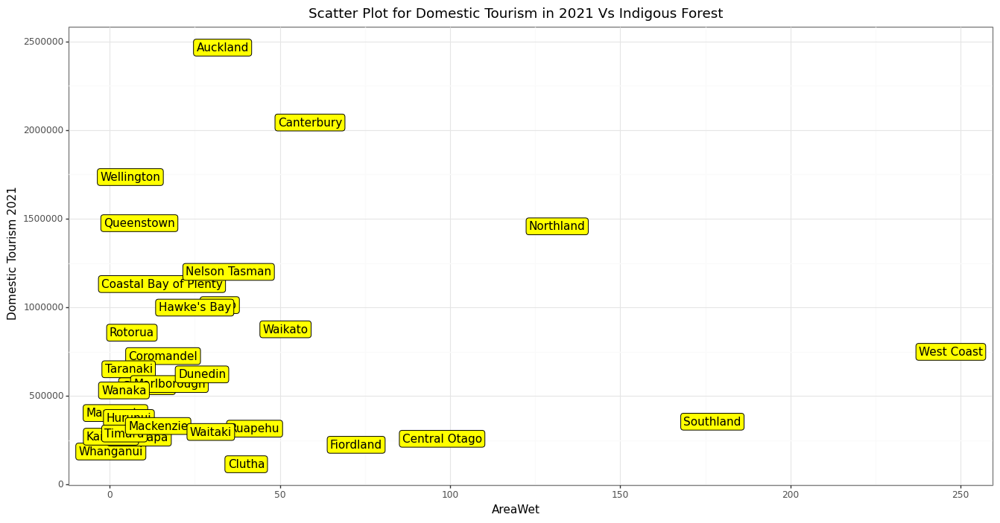

<IPython.core.display.Math object>

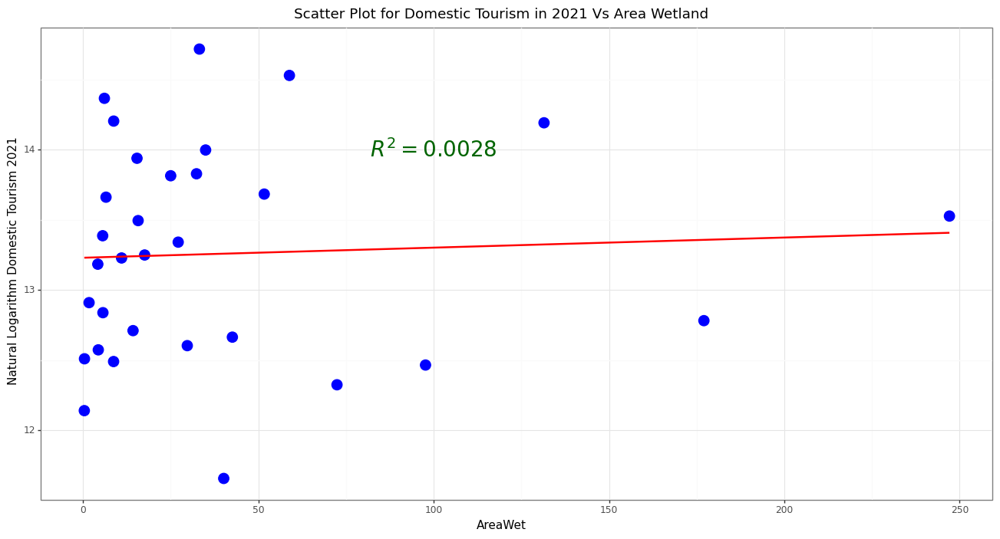

In [39]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y2)
preds41 = Model41.predict(x3)
R241 = r2_score(y2, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))


P1 = (ggplot(dat2, aes(x = 'AreaWet', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Wetland", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100,  y = 3000000, label = r"$R^2 = 0.0016$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaWet', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Indigous Forest", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model42 = regr.fit(x3, y2_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y2_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))


P2 = (ggplot(dat2, aes(x = 'AreaWet', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Wetland", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 100, y = 14, label = r"$R^2 = 0.0028$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>



#### For Area Protect

<IPython.core.display.Math object>

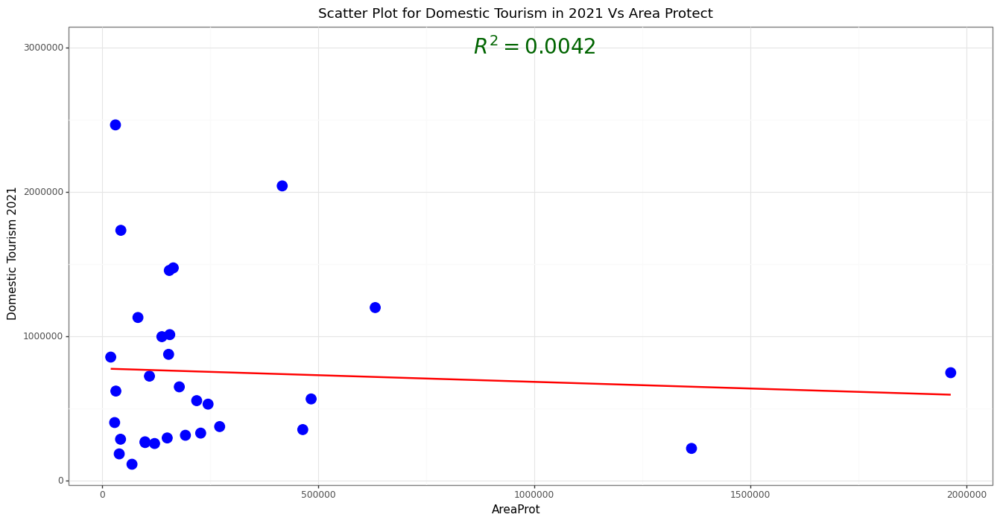

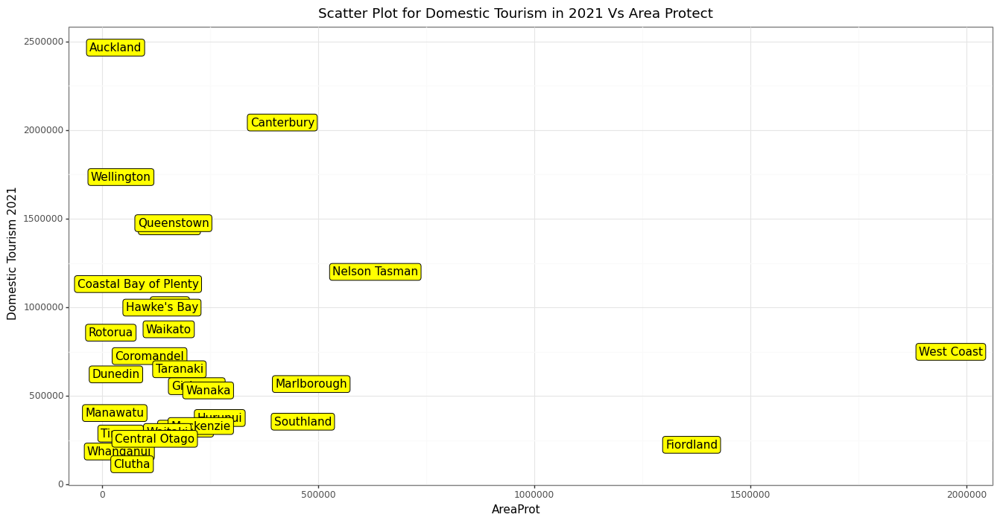

<IPython.core.display.Math object>

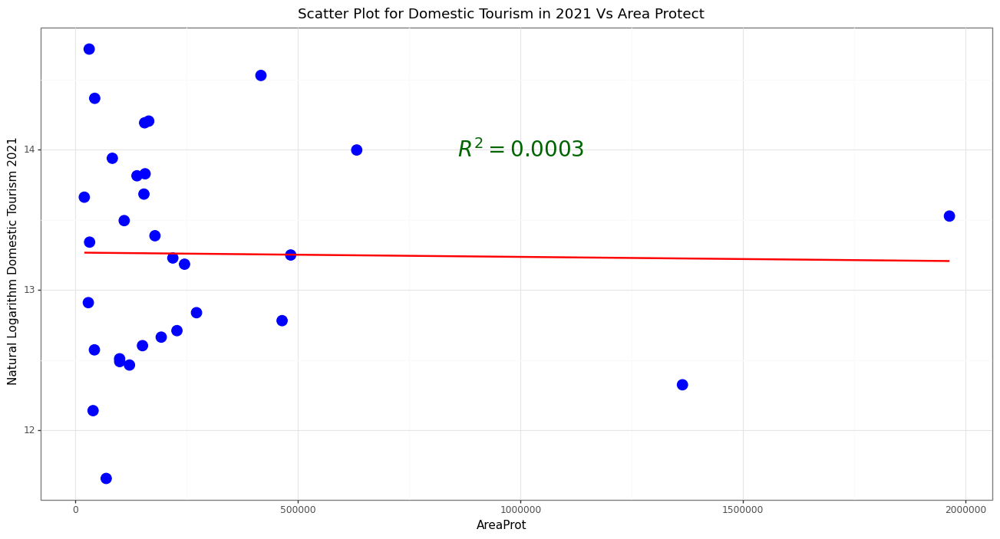

In [40]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y2)
preds51 = Model51.predict(x4)
R251 = r2_score(y2, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))


P1 = (ggplot(dat2, aes(x = 'AreaProt', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Protect", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000,  y = 3000000, label = r"$R^2 = 0.0042$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'AreaProt', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Protect", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y2_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y2_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))

P2 = (ggplot(dat2, aes(x = 'AreaProt', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Protect", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000, y = 14, label = r"$R^2 = 0.0003$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br>
<hr><hr>
<br><br>


#### For Area Grass

<IPython.core.display.Math object>

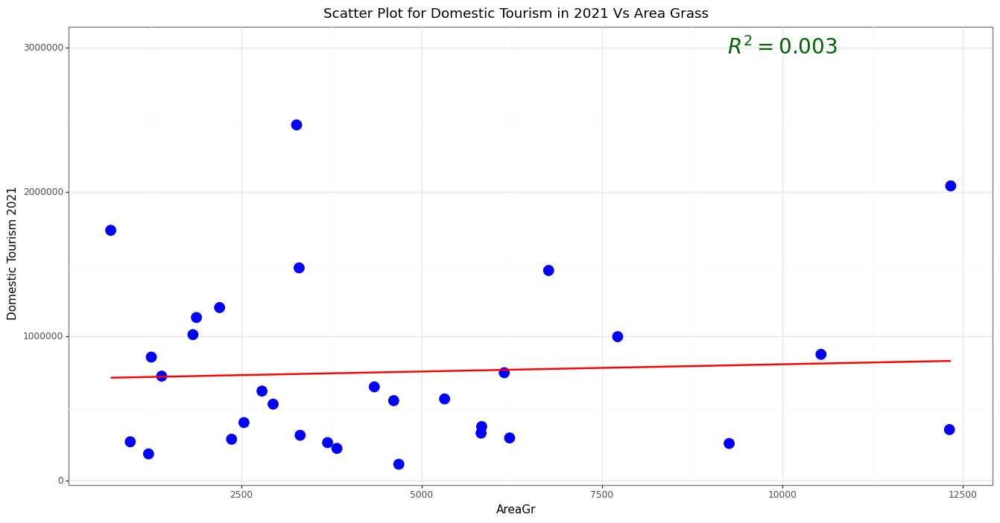

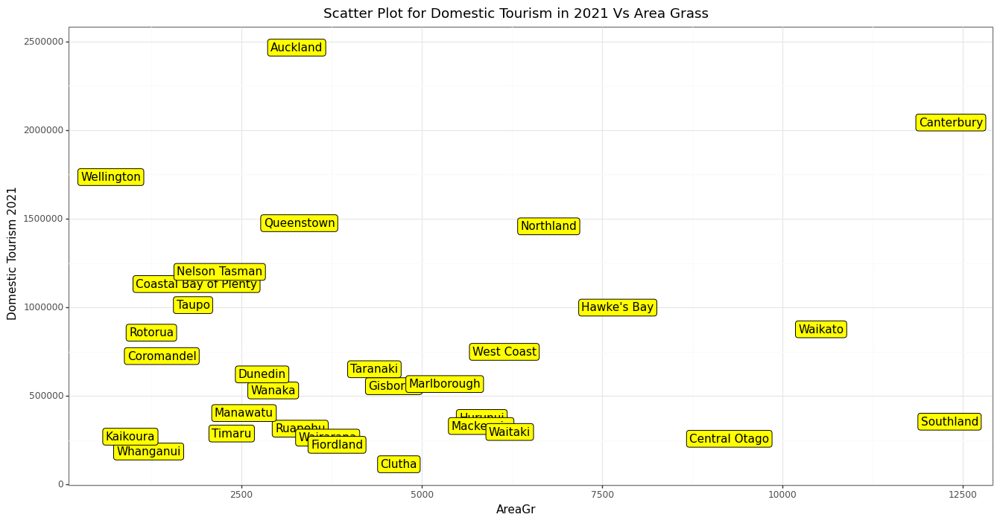

<IPython.core.display.Math object>

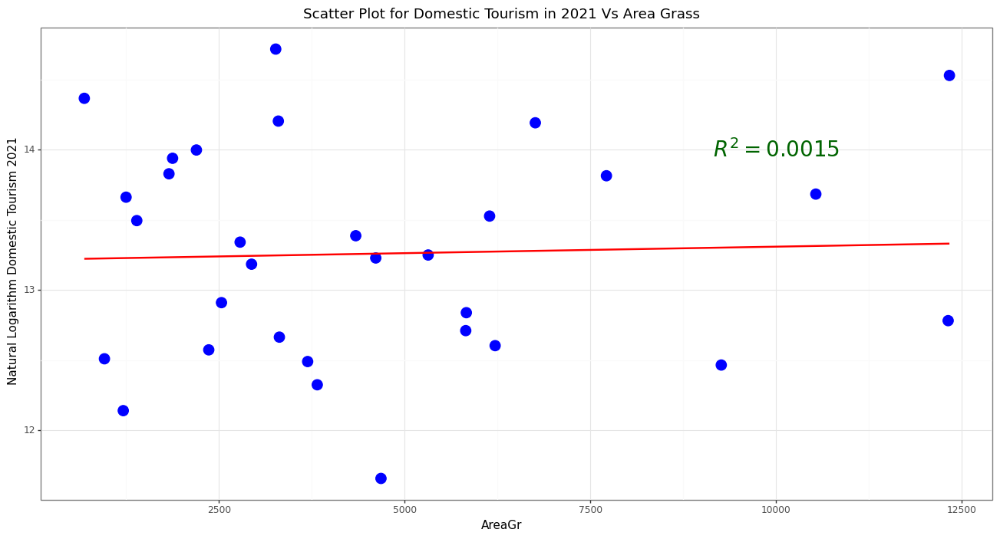

In [41]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y2)
preds61 = Model61.predict(x5)
R261 = r2_score(y2, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))


P1 = (ggplot(dat2, aes(x = 'AreaGr', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Grass", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000,  y = 3000000, label = r"$R^2 = 0.003$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'AreaGr', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Grass", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y2_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y2_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))



P2 = (ggplot(dat2, aes(x = 'AreaGr', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Area Grass", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0015$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br>
<hr><hr>
<br><br>



#### For Sum ACCESS

<IPython.core.display.Math object>

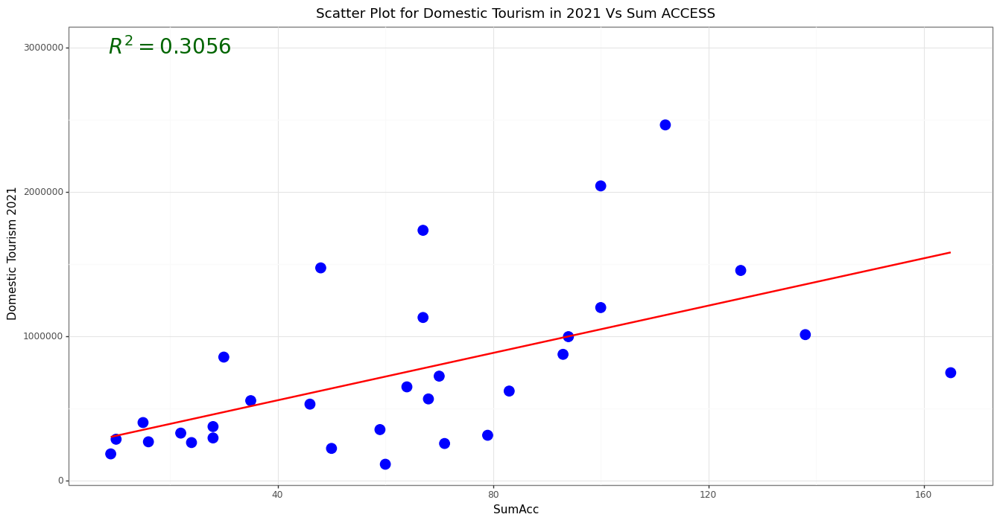

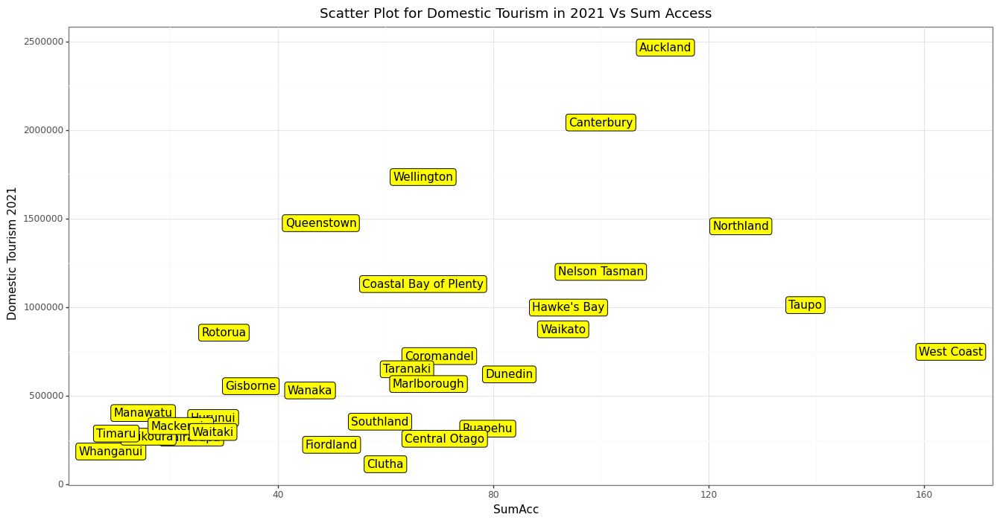

<IPython.core.display.Math object>

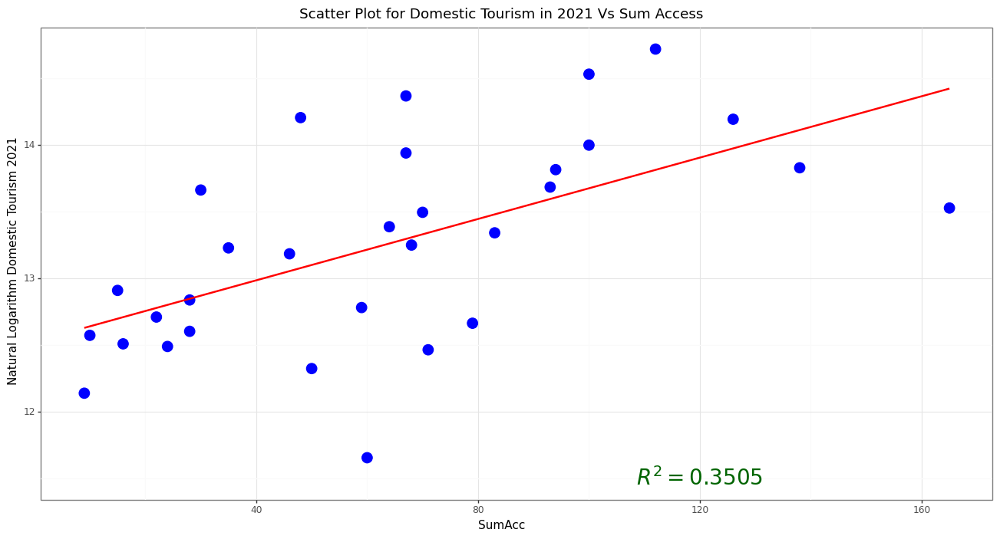

In [42]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y2)
preds71 = Model71.predict(x6)
R271 = r2_score(y2, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


P1 = (ggplot(dat2, aes(x = 'SumAcc', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Sum ACCESS", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 20,  y = 3000000, label = r"$R^2 = 0.3056$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'SumAcc', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Sum Access", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model72 = regr.fit(x6, y2_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y2_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))

P2 = (ggplot(dat2, aes(x = 'SumAcc', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Sum Access", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 120, y = 11.5, label = r"$R^2 = 0.3505$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)


<br><br><hr><hr><br><br>

#### For Coast View

<IPython.core.display.Math object>

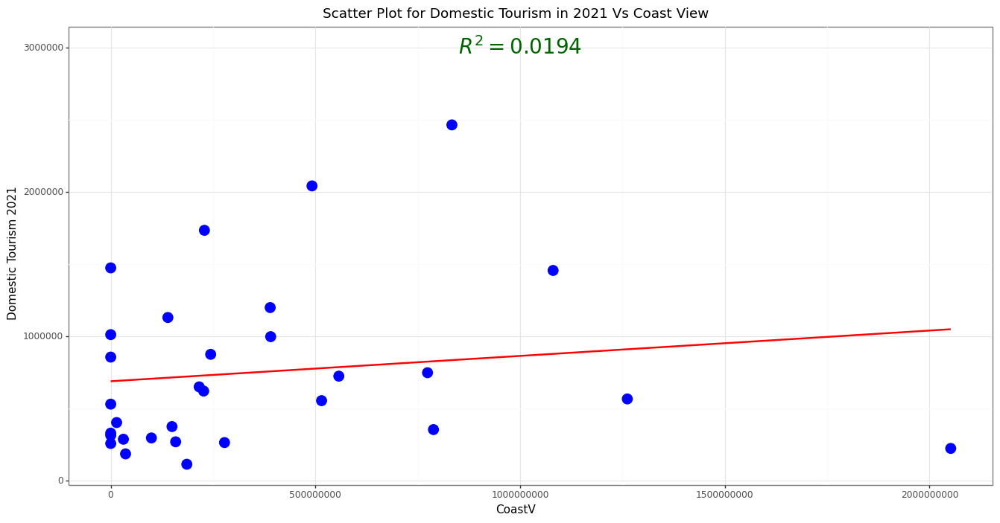

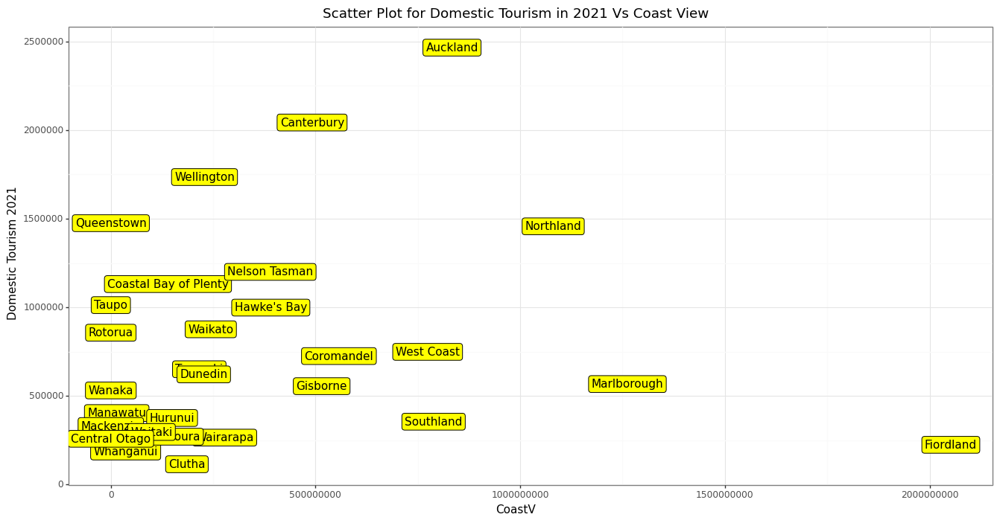

<IPython.core.display.Math object>

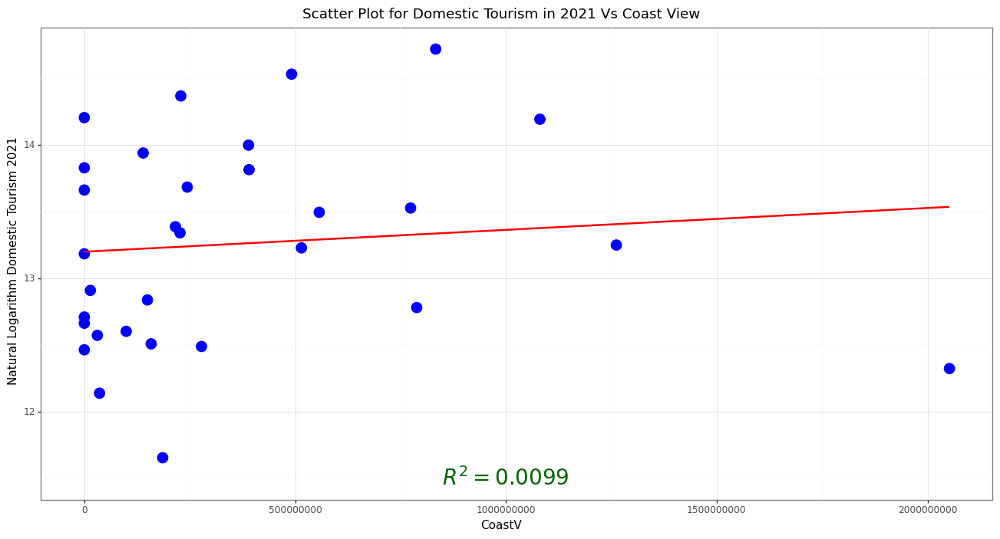

In [43]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y2)
preds81 = Model81.predict(x7)
R281 = r2_score(y2, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat2, aes(x = 'CoastV', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Coast View", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000000,  y = 3000000, label = r"$R^2 = 0.0194$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'CoastV', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Coast View", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model82 = regr.fit(x7, y2_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y2_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))


P2 = (ggplot(dat2, aes(x = 'CoastV', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Coast View", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000000, y = 11.5, label = r"$R^2 = 0.0099$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)


<br><br><hr><hr><br><br>

#### for Distance AirPort


<IPython.core.display.Math object>

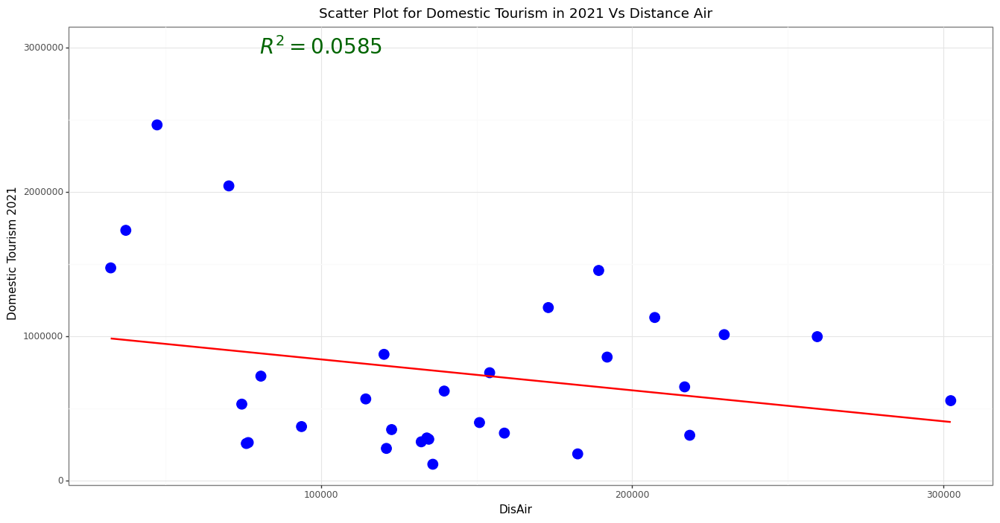

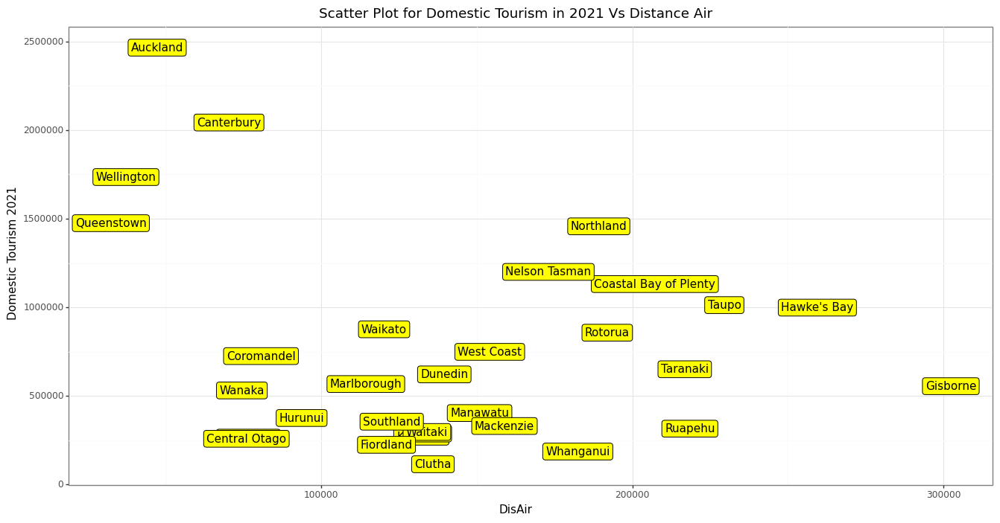

<IPython.core.display.Math object>

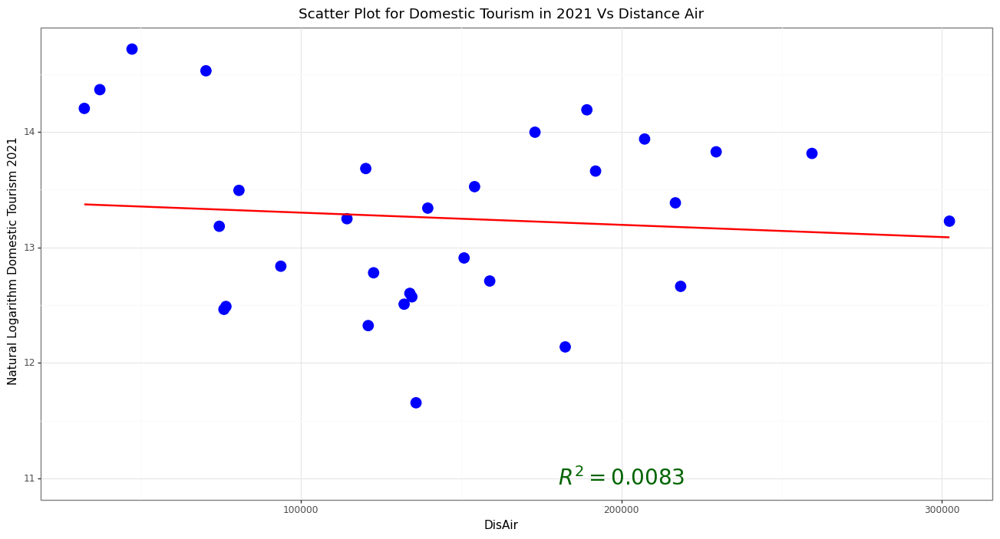

In [44]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y2)
preds91 = Model91.predict(x8)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat2, aes(x = 'DisAir', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Distance Air", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0585$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'DisAir', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Distance Air", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model92 = regr.fit(x8, y2_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'DisAir', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Distance Air", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0083$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>

#### For Distance City

<IPython.core.display.Math object>

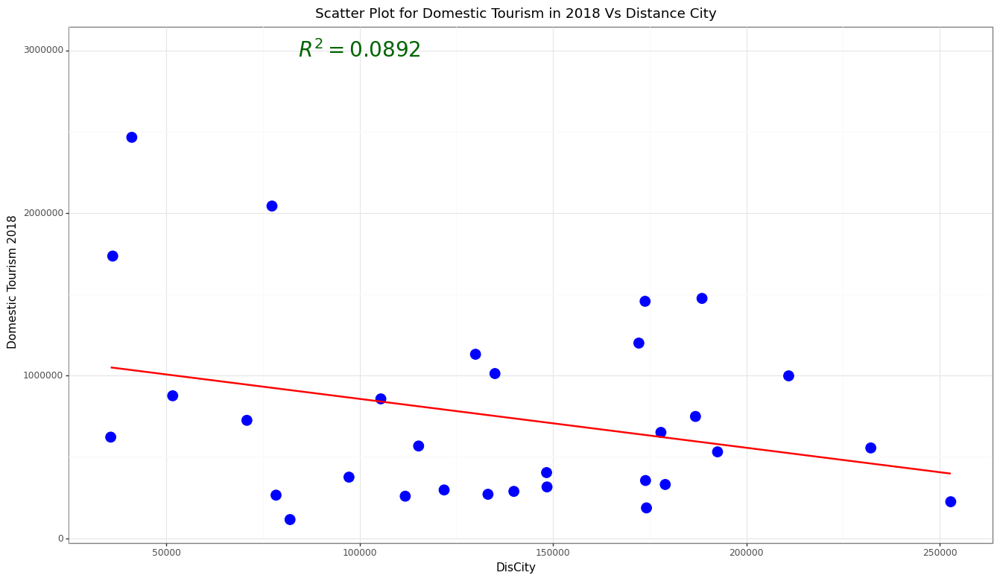

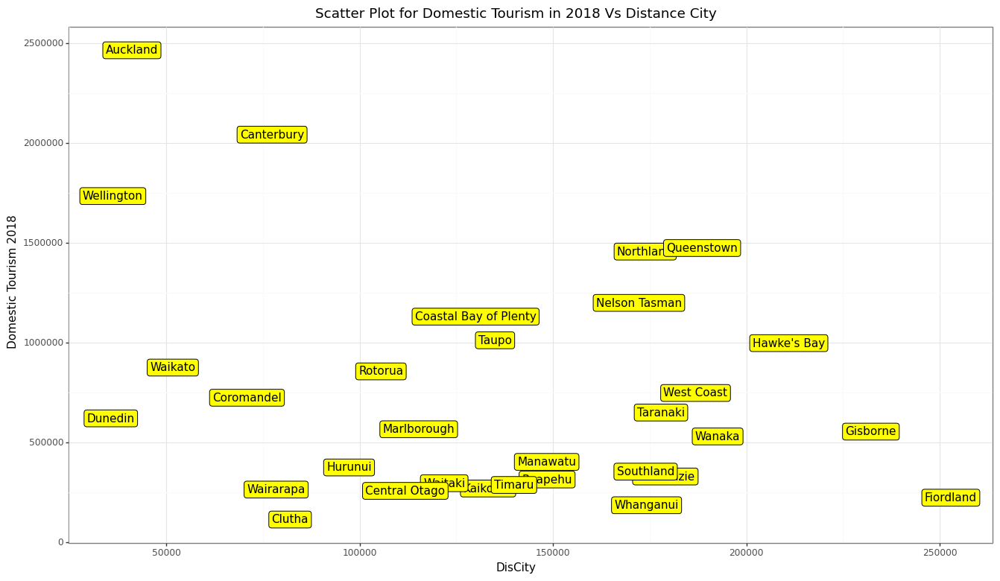

<IPython.core.display.Math object>

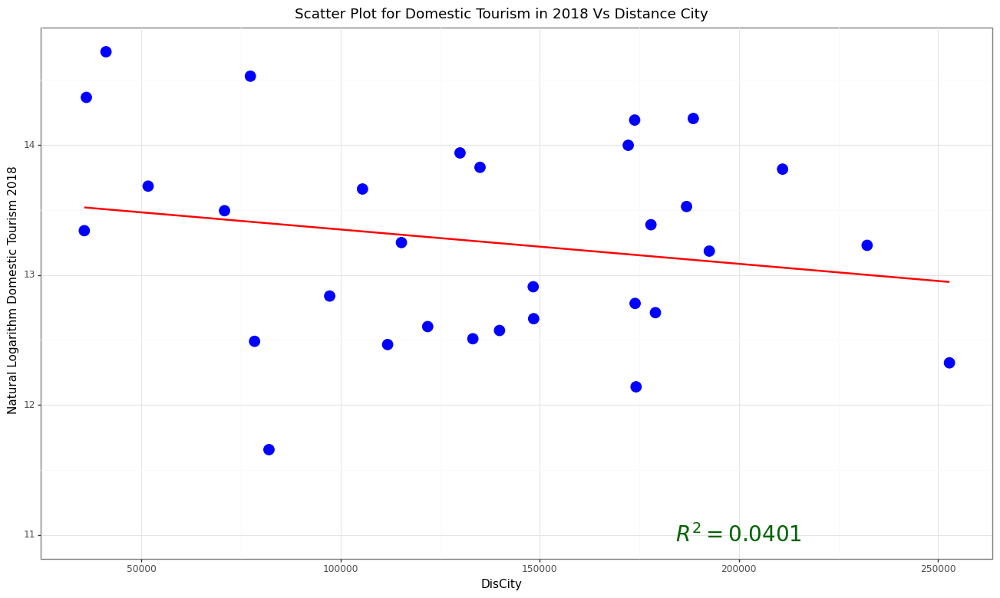

In [45]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y2)
preds91 = Model91.predict(x9)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat2, aes(x = 'DisCity', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0892$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat2, aes(x = 'DisCity', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))
print(P)

#### get logarithm of y


Model92 = regr.fit(x9, y2_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'DisCity', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Distance City", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0401$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))


print(P2)

<br><br><hr><hr><br><br>
#### define a Model with all variables 

In [46]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y2, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
xx2 = scaler.fit_transform(X)

xx3 = sm.add_constant(xx2)

model2 = sm.OLS(y2, xx3).fit()
print_model2 = model2.summary()
print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y2_log, xx3).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:             Dom_21_Ann   R-squared:                       0.656
Model:                            OLS   Adj. R-squared:                  0.484
Method:                 Least Squares   F-statistic:                     3.816
Date:                Thu, 25 May 2023   Prob (F-statistic):            0.00522
Time:                        03:52:10   Log-Likelihood:                -438.43
No. Observations:                  31   AIC:                             898.9
Df Residuals:                      20   BIC:                             914.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         6.411e+05    3.5e+05      1.831   

<br><br><hr><hr><br><br>


#### get correlation Matrix between variables

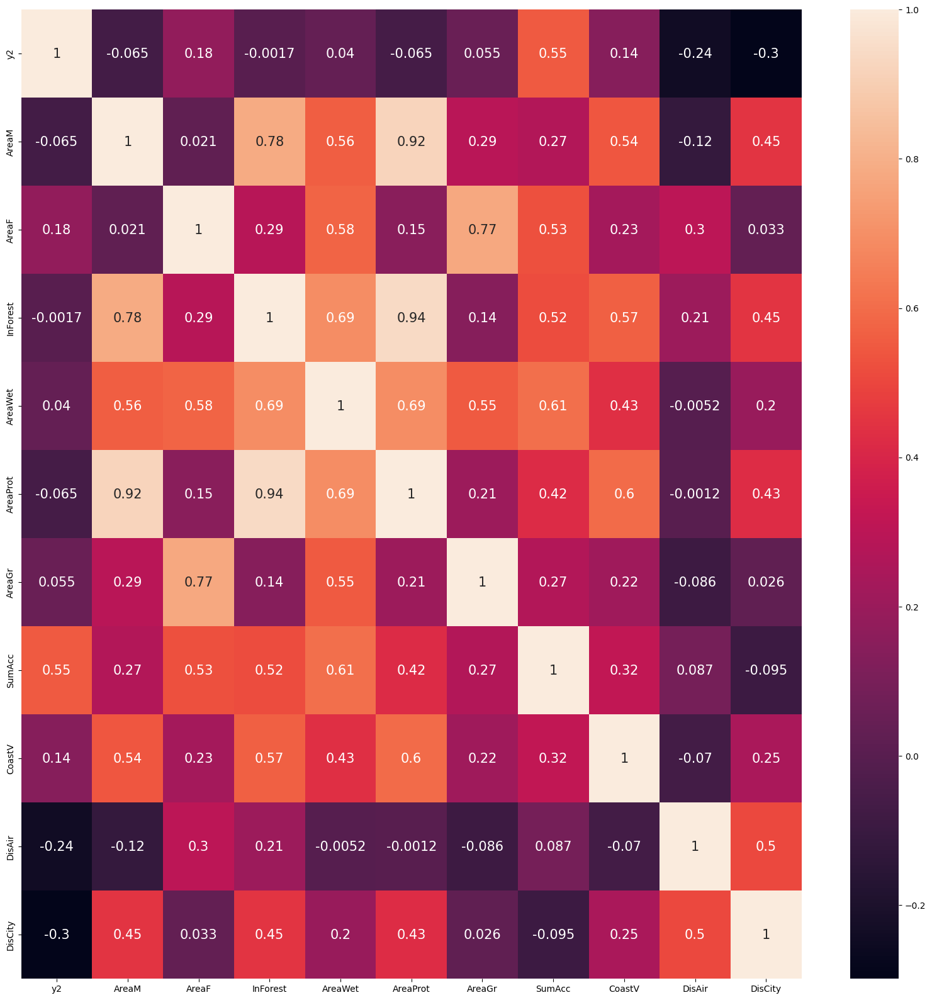

<Figure size 2000x2000 with 0 Axes>

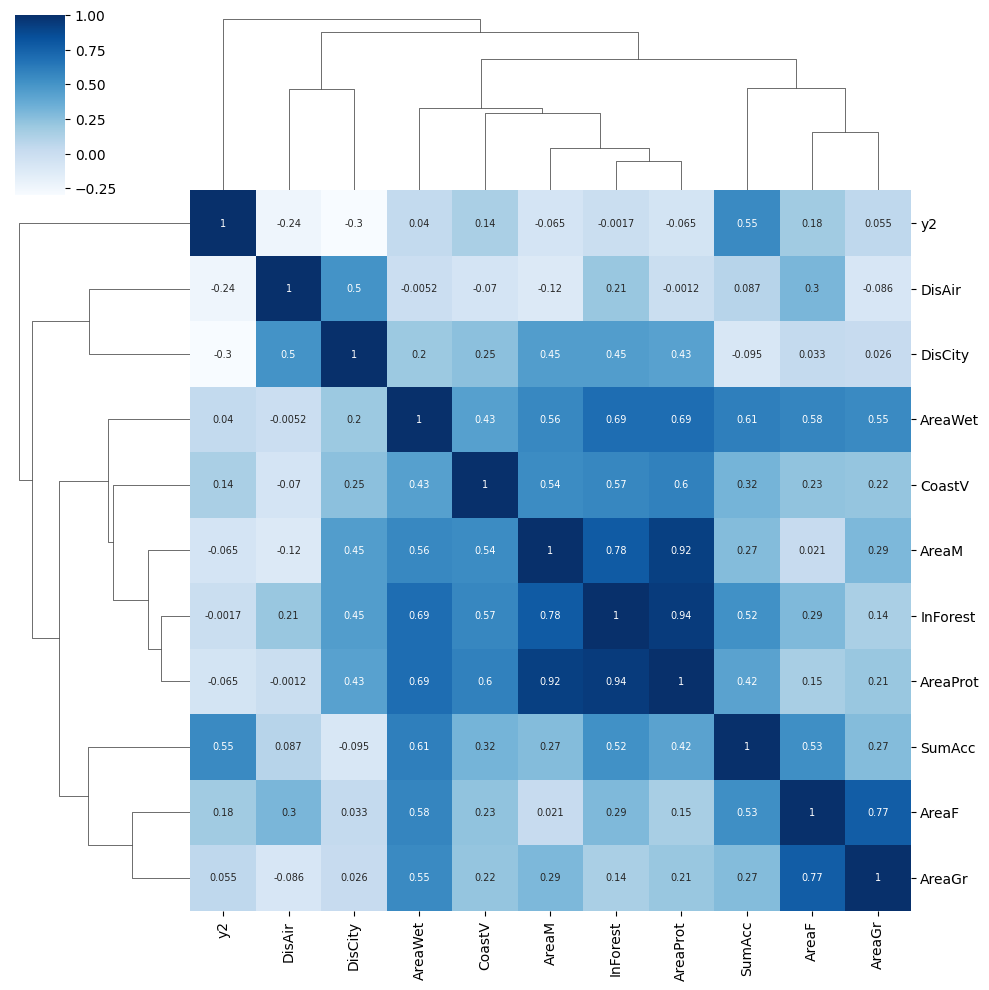

In [47]:
dat2_corr = dat2.drop(['y2_log', 'RTO_Names'], axis = 1)
dat2_corr.columns
dat2_corrr = dat2_corr.corr()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat2_corrr, annot = True, annot_kws = {"size" : 15})
plt.show()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat2_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

In [48]:
model = sm.OLS(y2, xx).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y2_log, xx).fit()
print_model3 = model3.summary()
print(print_model3)

                                 OLS Regression Results                                
Dep. Variable:             Dom_21_Ann   R-squared (uncentered):                   0.771
Model:                            OLS   Adj. R-squared (uncentered):              0.716
Method:                 Least Squares   F-statistic:                              14.01
Date:                Thu, 25 May 2023   Prob (F-statistic):                    6.13e-07
Time:                        03:52:11   Log-Likelihood:                         -447.71
No. Observations:                  31   AIC:                                      907.4
Df Residuals:                      25   BIC:                                      916.0
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br><hr><hr><hr><hr><hr><br><br>
## International Tourism 2018


#### define data for International Tourism in 2018

In [49]:
y3 = dat_org['Int_18_Ann']
y3_log = np.log(y3)
dat3 = pd.concat([y3, X], axis = 1, join = "outer")
dat3.index = dat_org['RTO_Name']
dat3.columns =  ['y3', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 
'AreaGr', 'SumAcc', 'CoastV', 'DisAir', 'DisCity']
dat3['RTO_Names']= dat_org['RTO_Name'].values
dat3['y3_log'] = y3_log.values
dat3
dat3.columns

Index(['y3', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 'AreaGr',
       'SumAcc', 'CoastV', 'DisAir', 'DisCity', 'RTO_Names', 'y3_log'],
      dtype='object')

<br><br><hr><hr><br><br>

#### For Area Mount




<IPython.core.display.Math object>

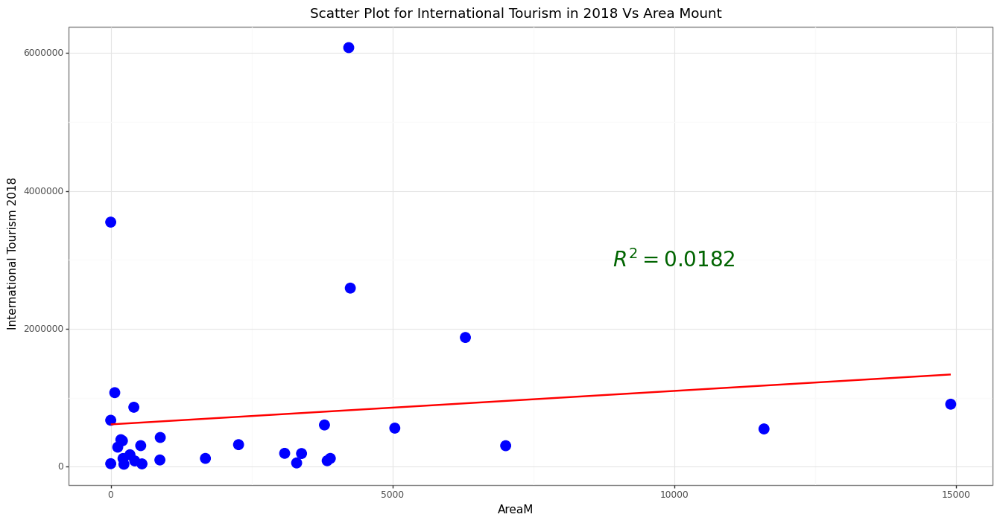

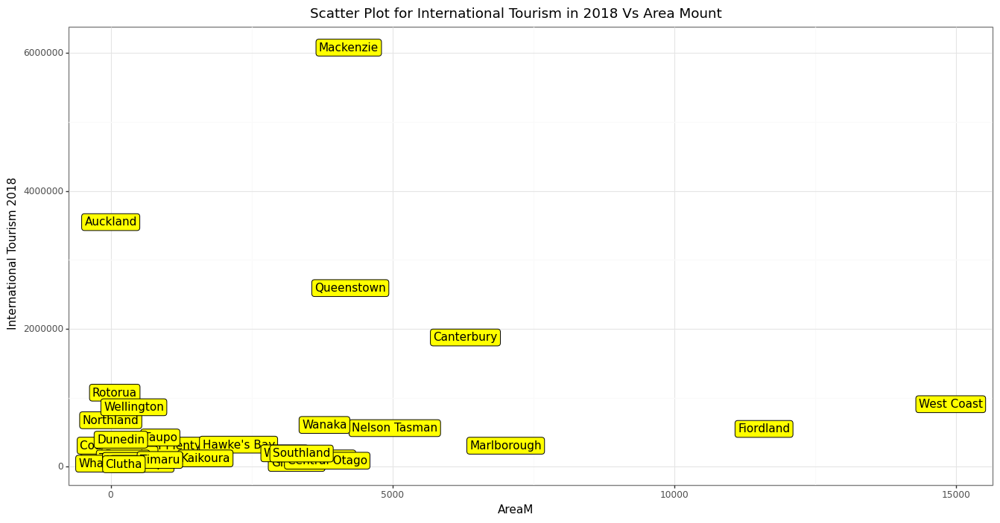

<IPython.core.display.Math object>

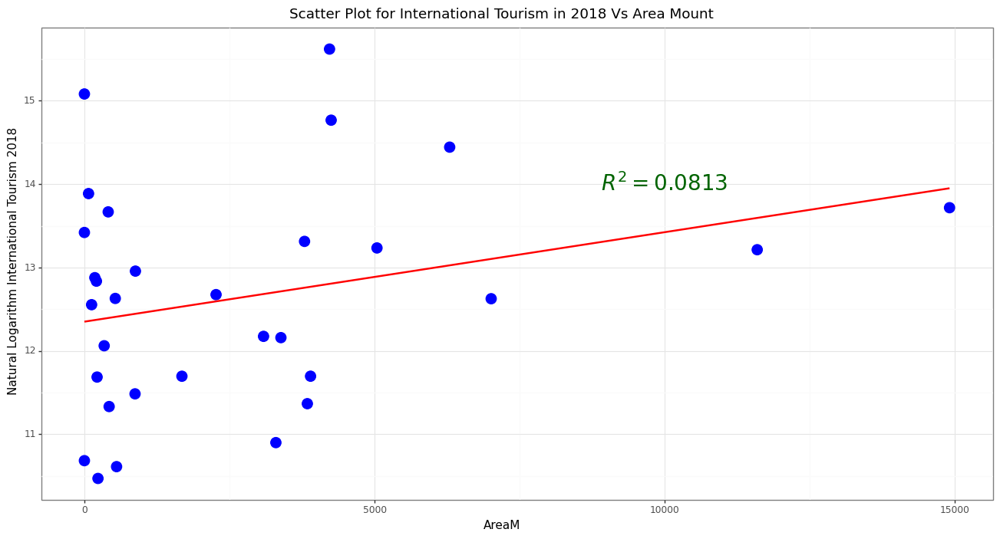

In [50]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y3)
preds = Model1.predict(x)
R2 = r2_score(y3, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat3, aes(x = 'AreaM', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Mount", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0182$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)


## create label plot

P = (ggplot(dat3, aes(x = 'AreaM', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Mount", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model2 = regr.fit(x, y3_log)
preds2 = Model2.predict(x)
R22 = r2_score(y3_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))


P2 = (ggplot(dat3, aes(x = 'AreaM', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Mount", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0813$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### For Area Flat

<IPython.core.display.Math object>

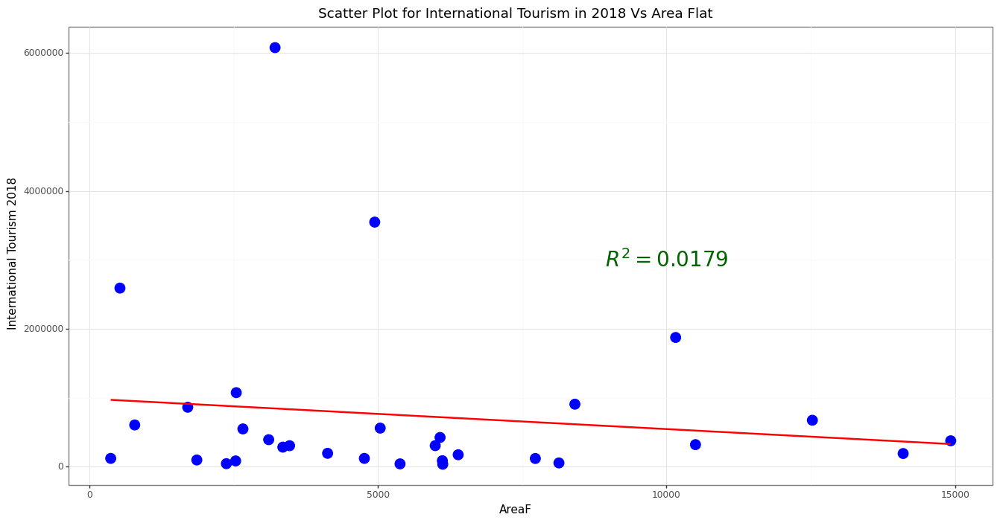

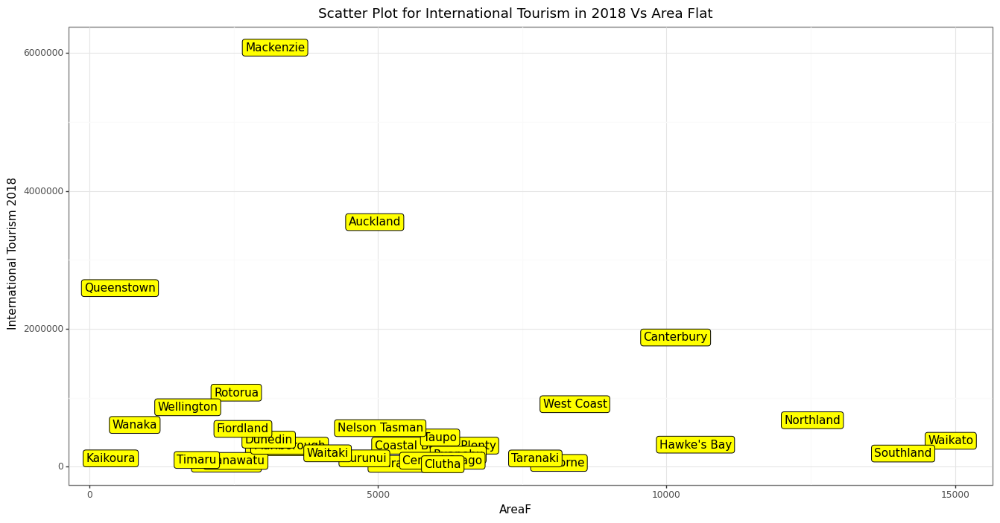

<IPython.core.display.Math object>

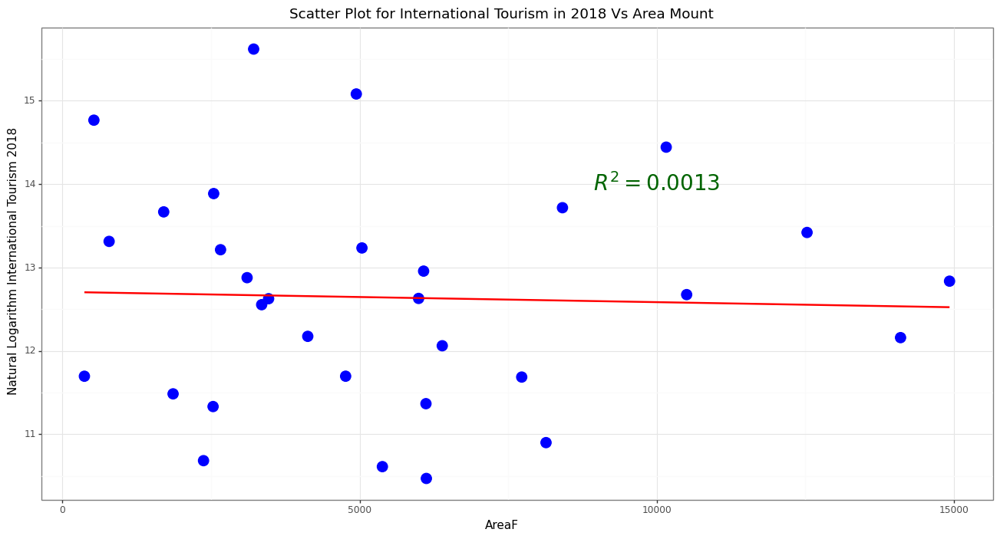

In [51]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y3)
preds21 = Model2.predict(x1)
R2 = r2_score(y3, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat3, aes(x = 'AreaF', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Flat", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0179$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)


## create label plot

P = (ggplot(dat3, aes(x = 'AreaF', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Flat", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model22 = regr.fit(x1, y3_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y3_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))

P2 = (ggplot(dat3, aes(x = 'AreaF', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Mount", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0013$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br><hr><hr><br><br>

#### For Area InForest

<IPython.core.display.Math object>

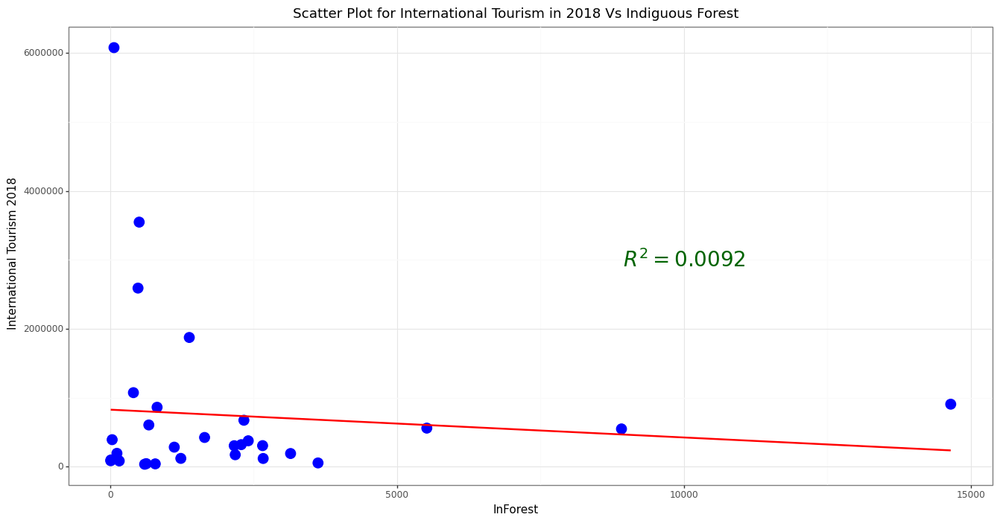

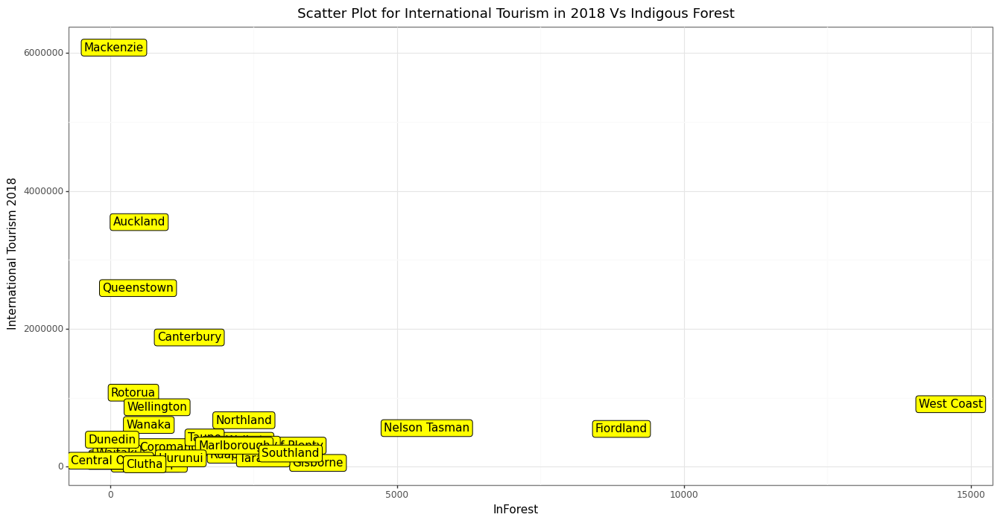

<IPython.core.display.Math object>

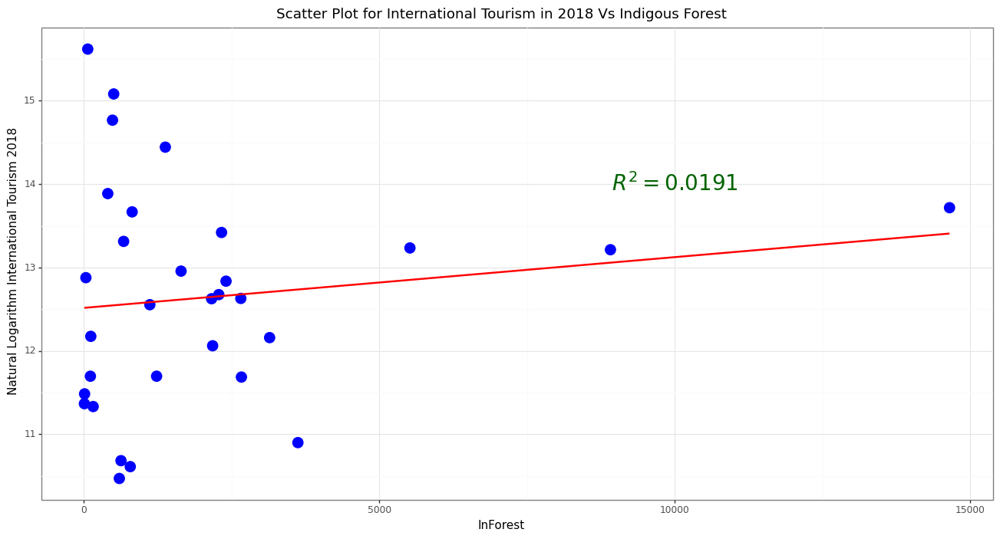

In [52]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y3)
preds31 = Model3.predict(x2)
R231 = r2_score(y3, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat3, aes(x = 'InForest', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Indiguous Forest", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 3000000, label = r"$R^2 = 0.0092$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)


## create label plot

P = (ggplot(dat3, aes(x = 'InForest', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Indigous Forest", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model32 = regr.fit(x2, y3_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y3_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))

P2 = (ggplot(dat3, aes(x = 'InForest', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Indigous Forest", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0191$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### For Area Wetland

<IPython.core.display.Math object>

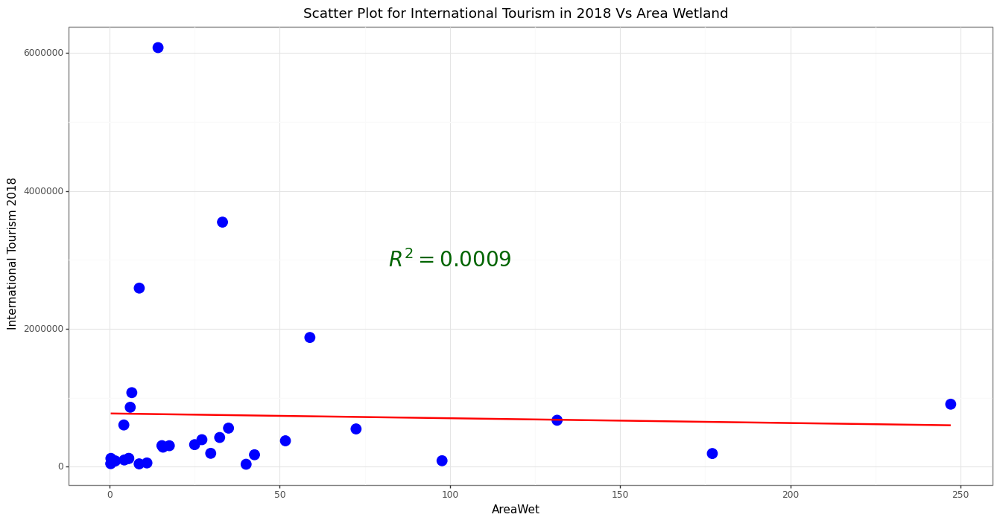

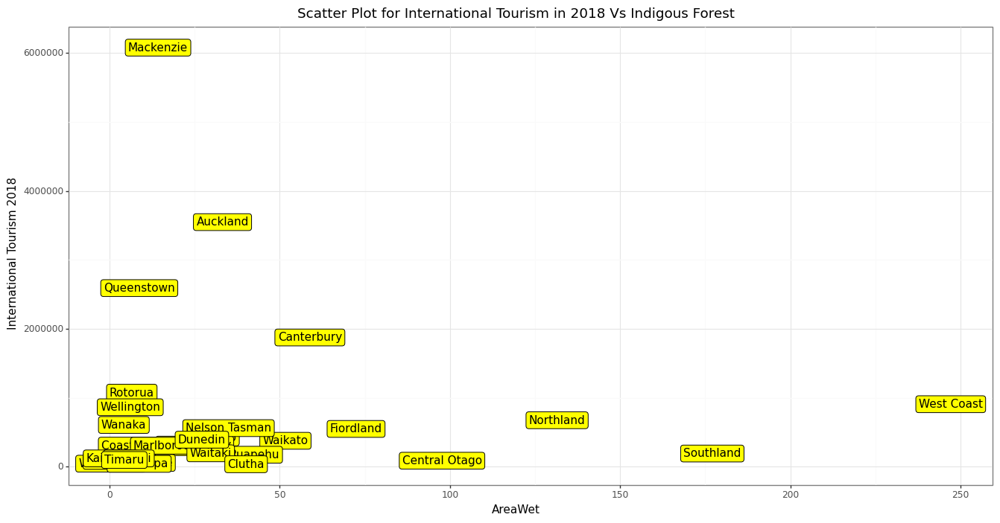

<IPython.core.display.Math object>

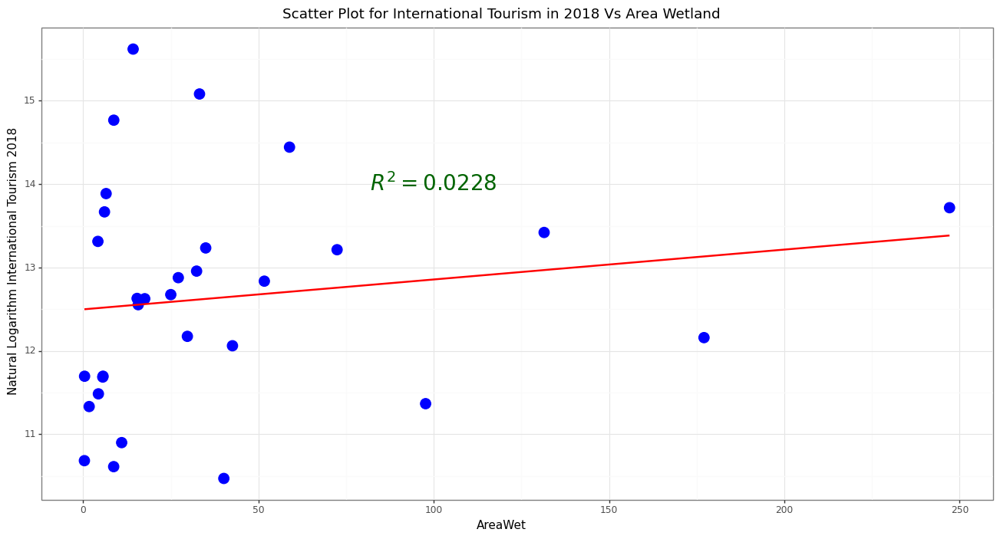

In [53]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y3)
preds41 = Model41.predict(x3)
R241 = r2_score(y3, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))

P1 = (ggplot(dat3, aes(x = 'AreaWet', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Wetland", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100,  y = 3000000, label = r"$R^2 = 0.0009$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat3, aes(x = 'AreaWet', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Indigous Forest", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model42 = regr.fit(x3, y3_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y3_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))

P2 = (ggplot(dat3, aes(x = 'AreaWet', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Wetland", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 100, y = 14, label = r"$R^2 = 0.0228$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Area Protect

<IPython.core.display.Math object>

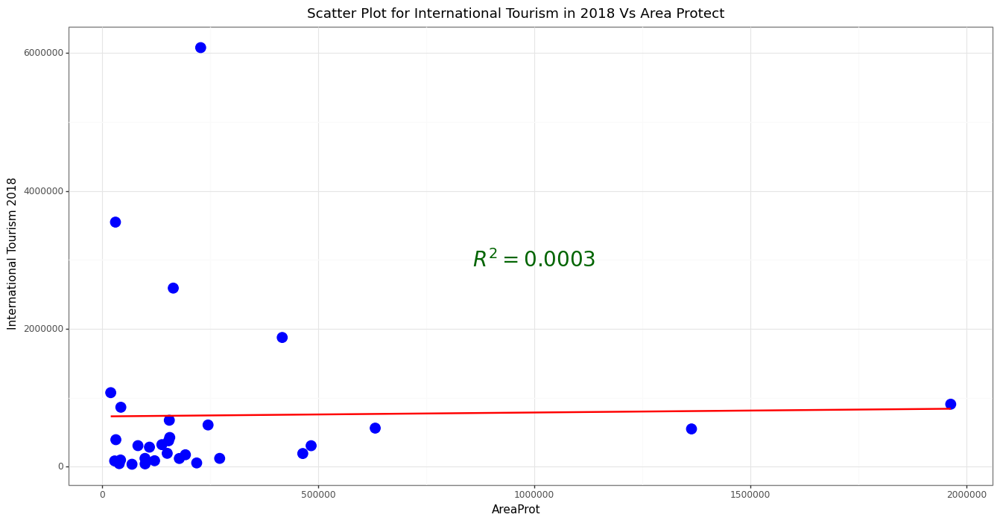

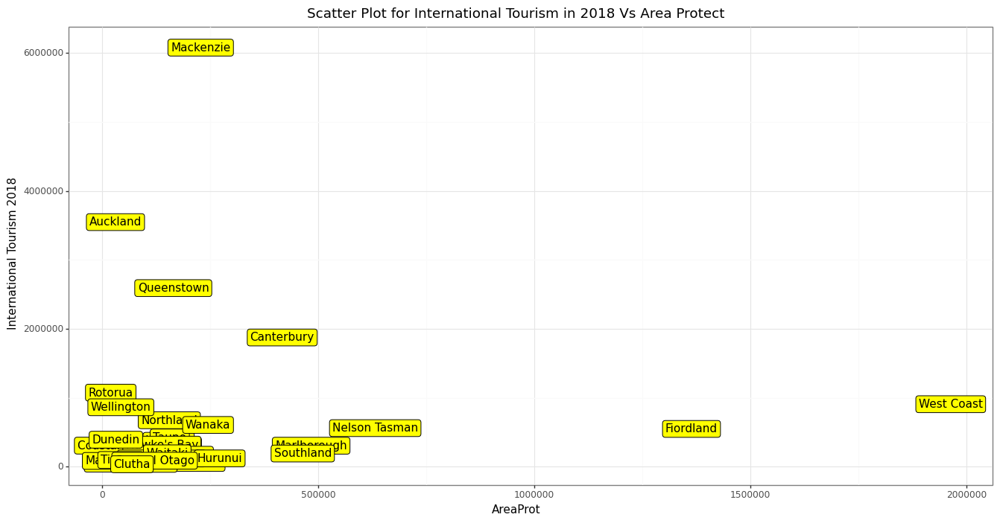

<IPython.core.display.Math object>

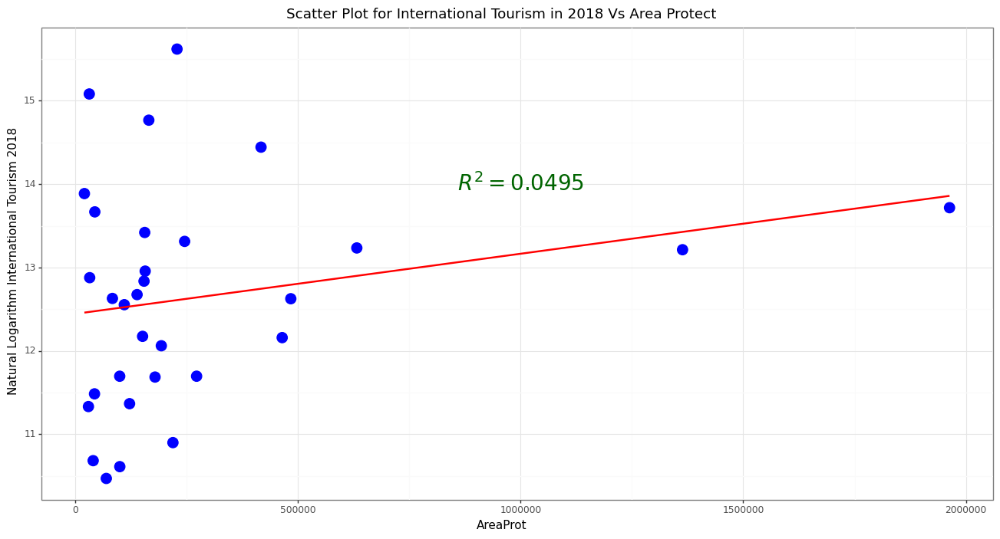

In [54]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y3)
preds51 = Model51.predict(x4)
R251 = r2_score(y3, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P1 = (ggplot(dat3, aes(x = 'AreaProt', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Protect", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000,  y = 3000000, label = r"$R^2 = 0.0003$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat3, aes(x = 'AreaProt', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Protect", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y3_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y3_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P2 = (ggplot(dat3, aes(x = 'AreaProt', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Protect", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000, y = 14, label = r"$R^2 = 0.0495$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Area Grass

<IPython.core.display.Math object>

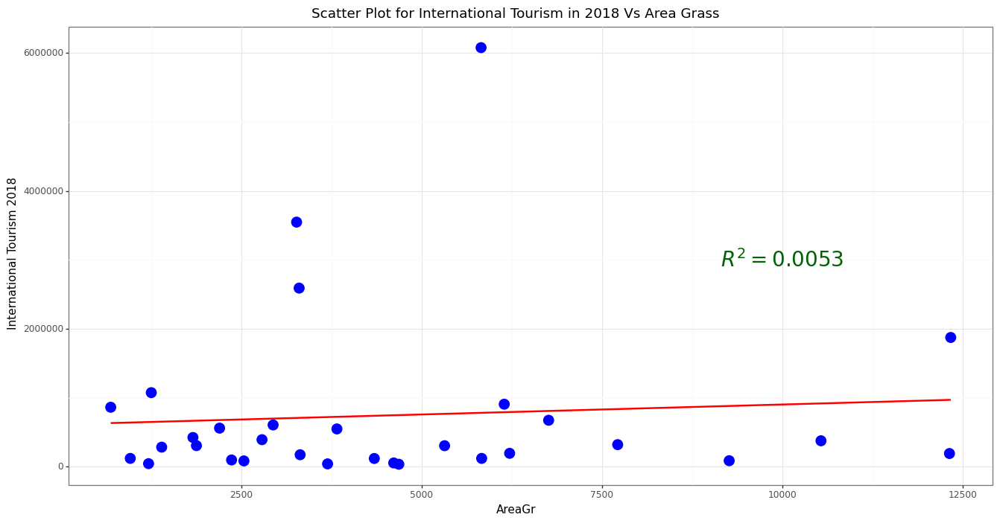

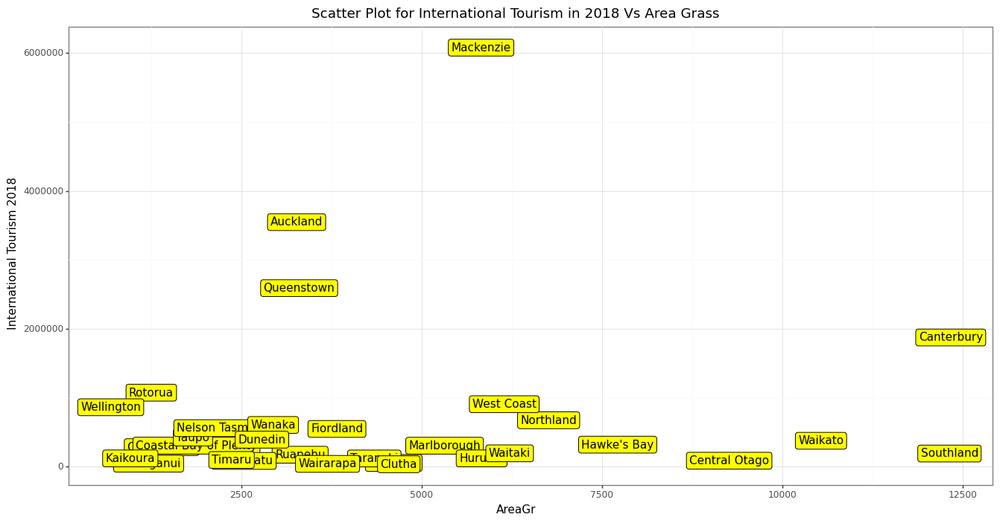

<IPython.core.display.Math object>

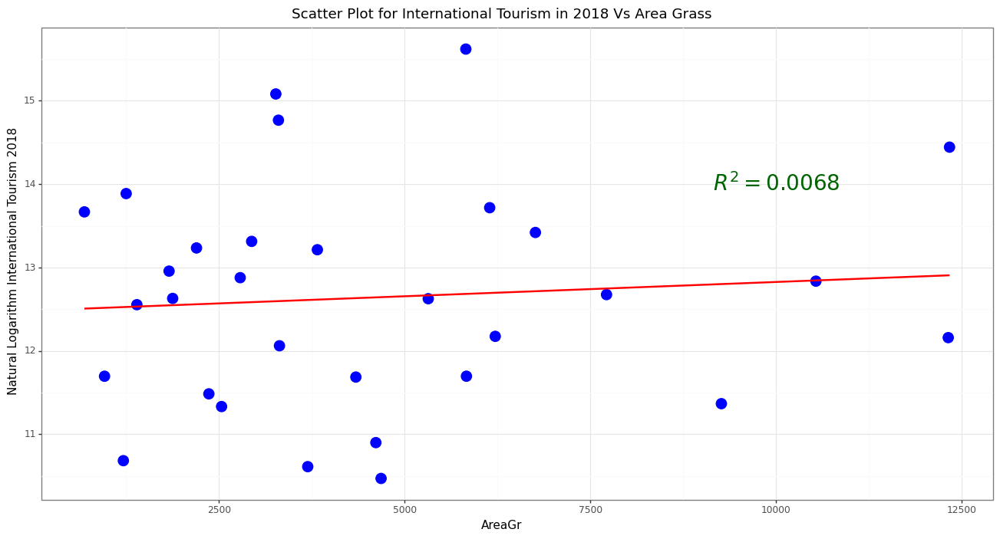

In [55]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y3)
preds61 = Model61.predict(x5)
R261 = r2_score(y3, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R262)))



P1 = (ggplot(dat3, aes(x = 'AreaGr', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Grass", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000,  y = 3000000, label = r"$R^2 = 0.0053$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'AreaGr', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Grass", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y3_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y3_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))

P2 = (ggplot(dat3, aes(x = 'AreaGr', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Area Grass", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0068$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>



#### For Sum ACCESS

<IPython.core.display.Math object>

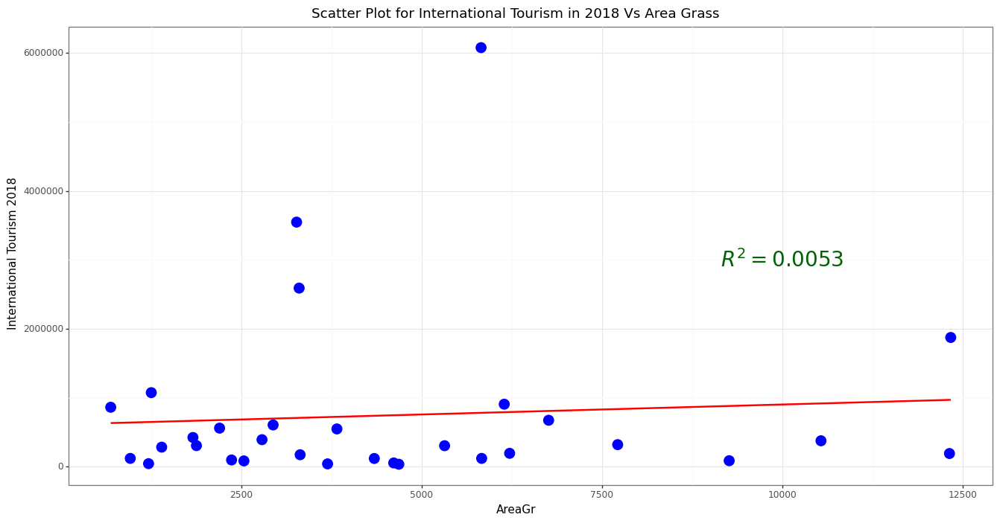

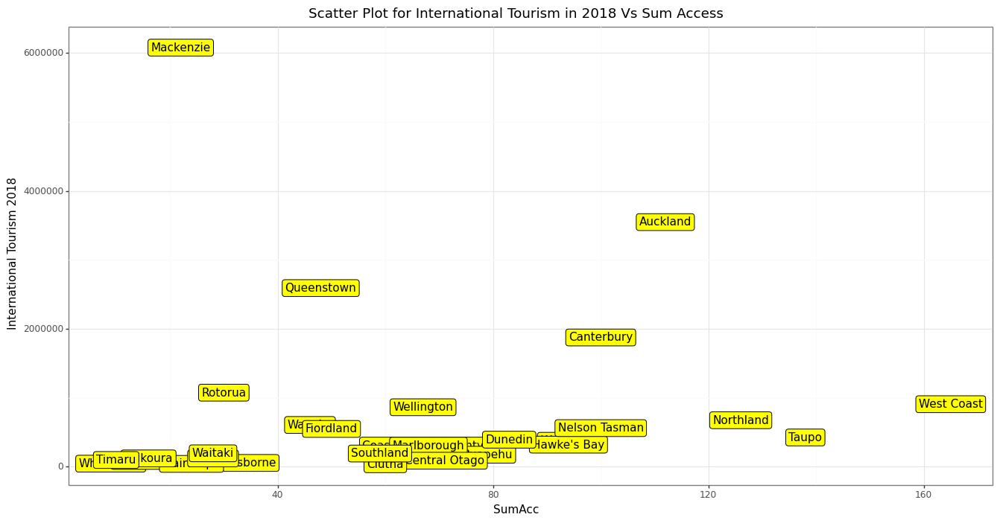

<IPython.core.display.Math object>

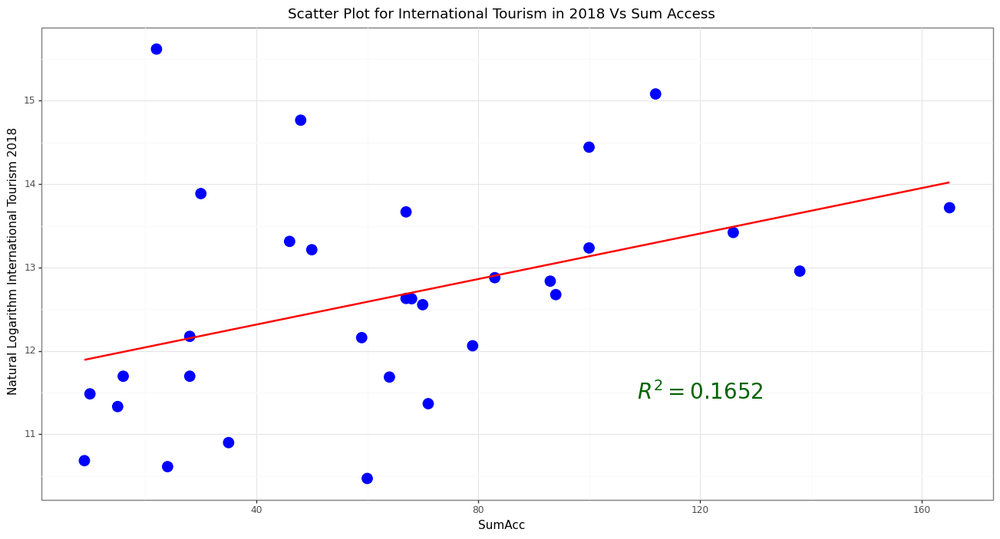

In [56]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y3)
preds71 = Model71.predict(x6)
R271 = r2_score(y3, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


p1 = (ggplot(dat3, aes(x = 'SumAcc', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Sum ACCESS", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 20,  y = 3000000, label = r"$R^2 = 0.0029$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'SumAcc', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Sum Access", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model72 = regr.fit(x6, y3_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y3_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))


P2 = (ggplot(dat3, aes(x = 'SumAcc', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Sum Access", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 120, y = 11.5, label = r"$R^2 = 0.1652$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>


#### For Coast View

<IPython.core.display.Math object>

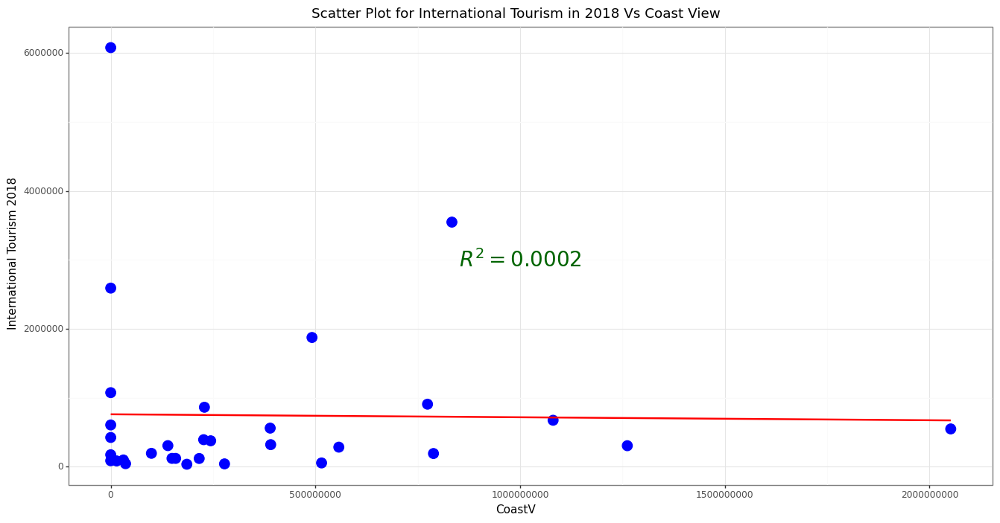

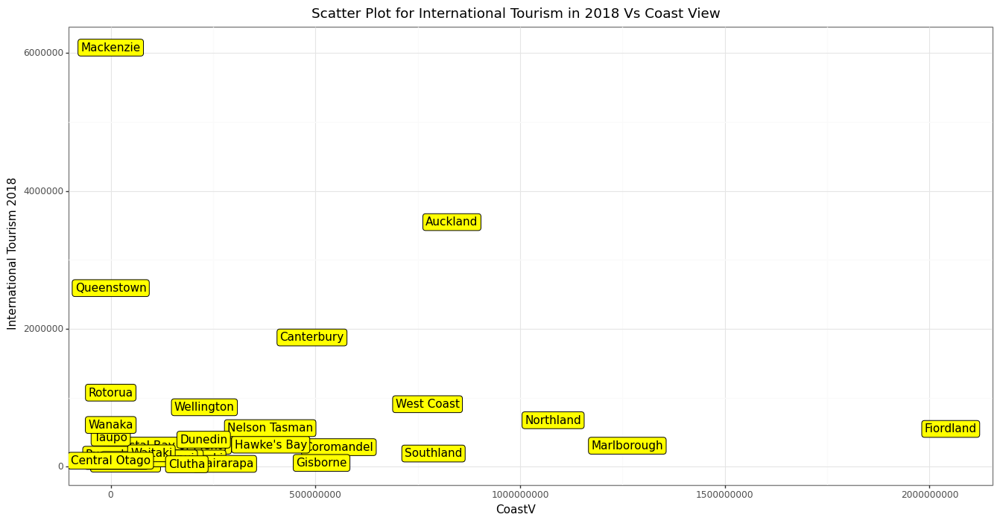

<IPython.core.display.Math object>

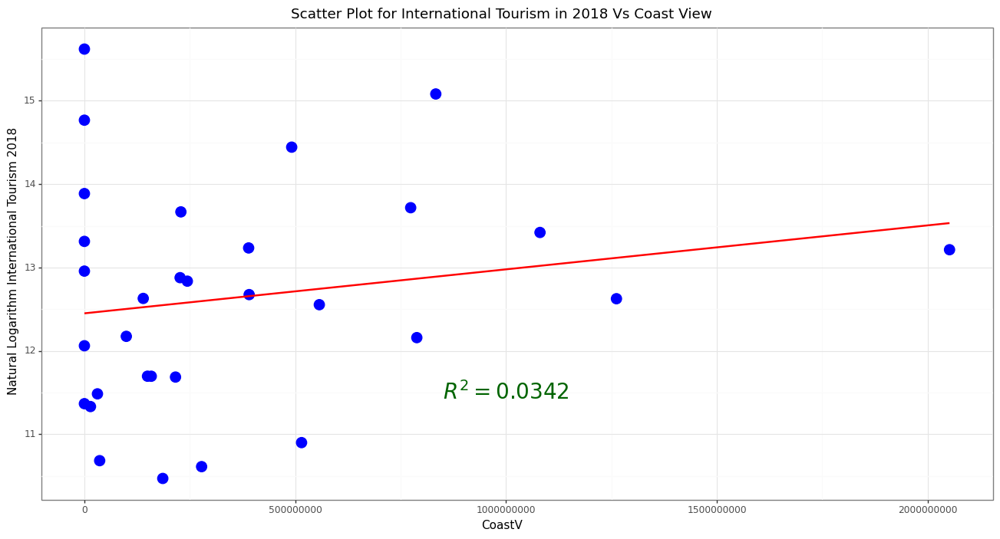

In [57]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y3)
preds81 = Model81.predict(x7)
R281 = r2_score(y3, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat3, aes(x = 'CoastV', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Coast View", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000000,  y = 3000000, label = r"$R^2 = 0.0002$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'CoastV', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Coast View", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model82 = regr.fit(x7, y3_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y3_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))


P2 = (ggplot(dat3, aes(x = 'CoastV', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Coast View", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000000, y = 11.5, label = r"$R^2 = 0.0342$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Distance AirPort

<IPython.core.display.Math object>

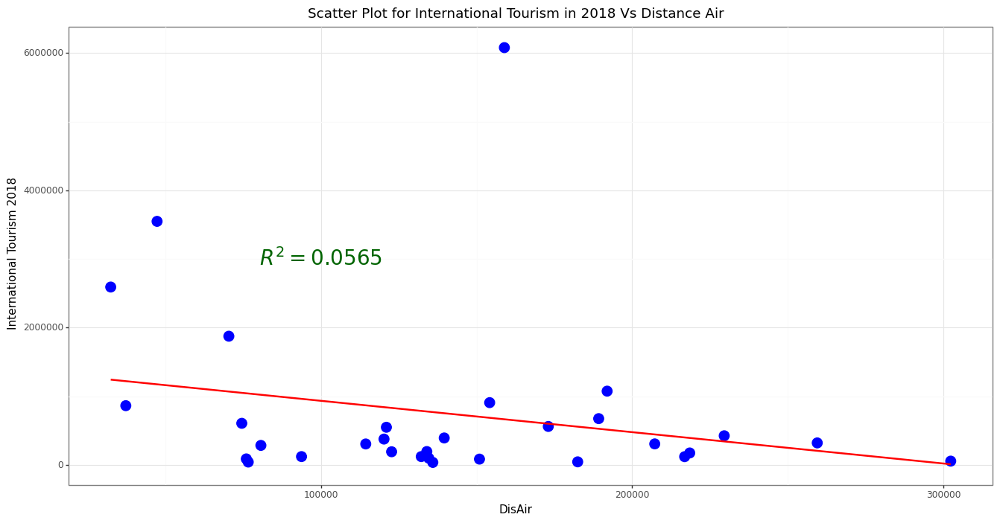

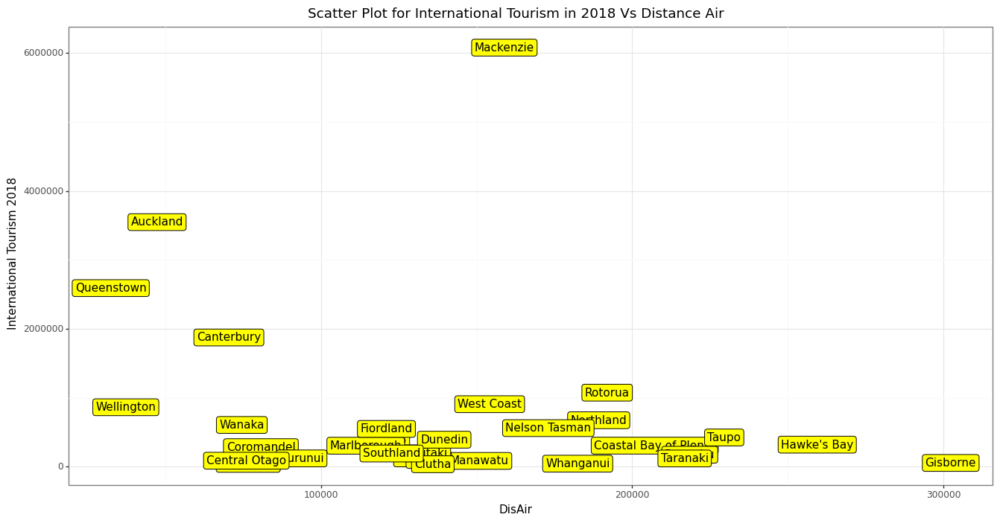

<IPython.core.display.Math object>

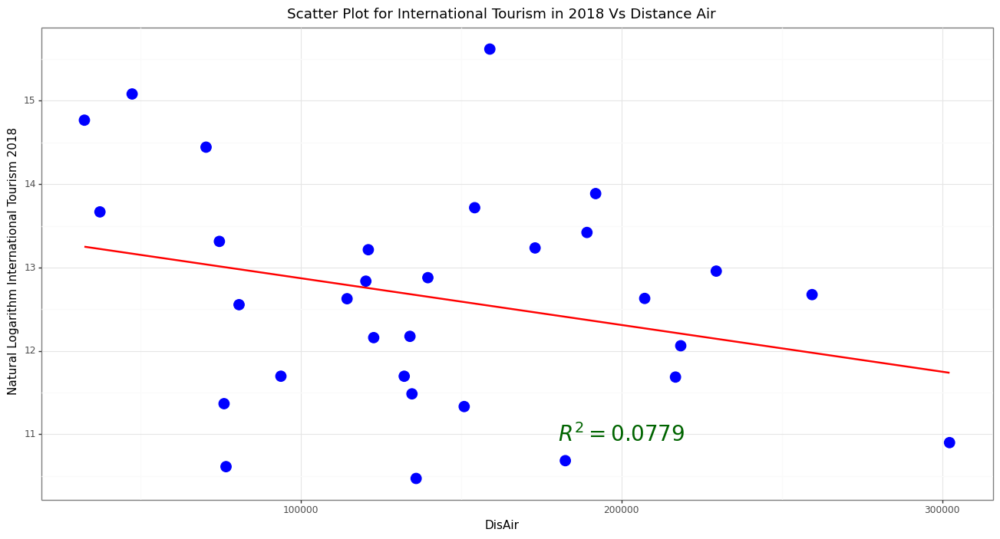

In [58]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y3)
preds91 = Model91.predict(x8)
R291 = r2_score(y3, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat3, aes(x = 'DisAir', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance Air", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0565$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'DisAir', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance Air", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model92 = regr.fit(x8, y3_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y3_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))

P2 = (ggplot(dat3, aes(x = 'DisAir', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance Air", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0779$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Distance City



<IPython.core.display.Math object>

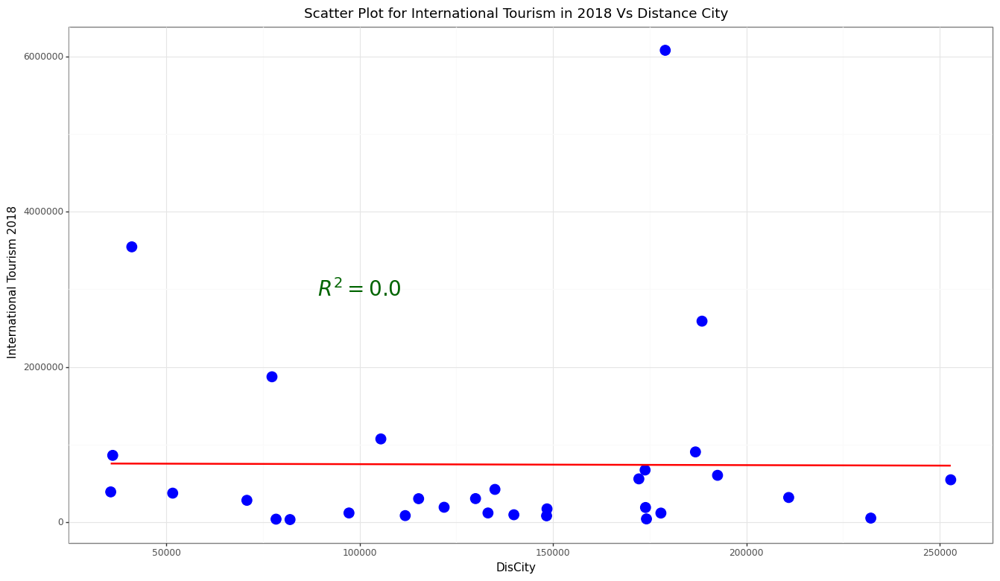

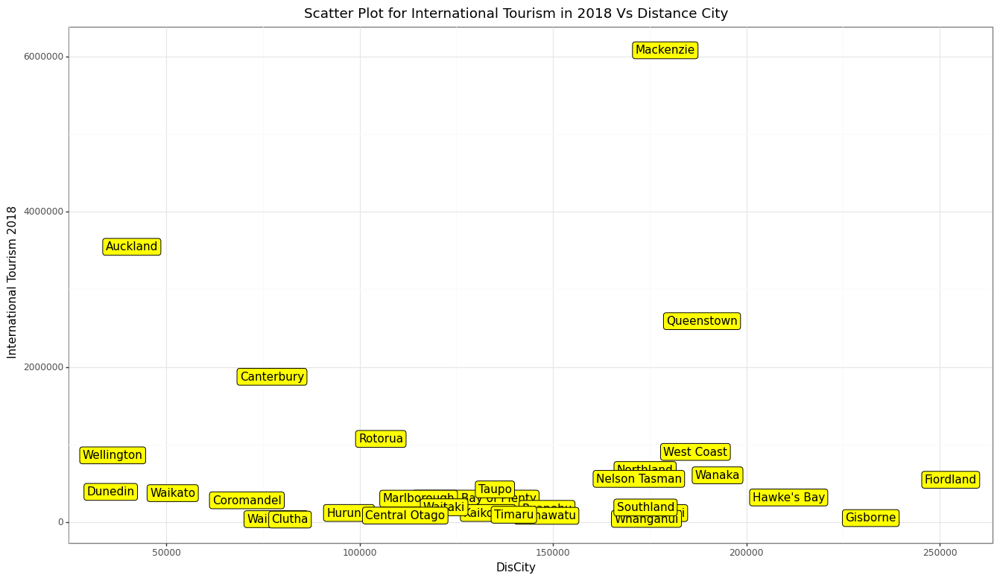

<IPython.core.display.Math object>

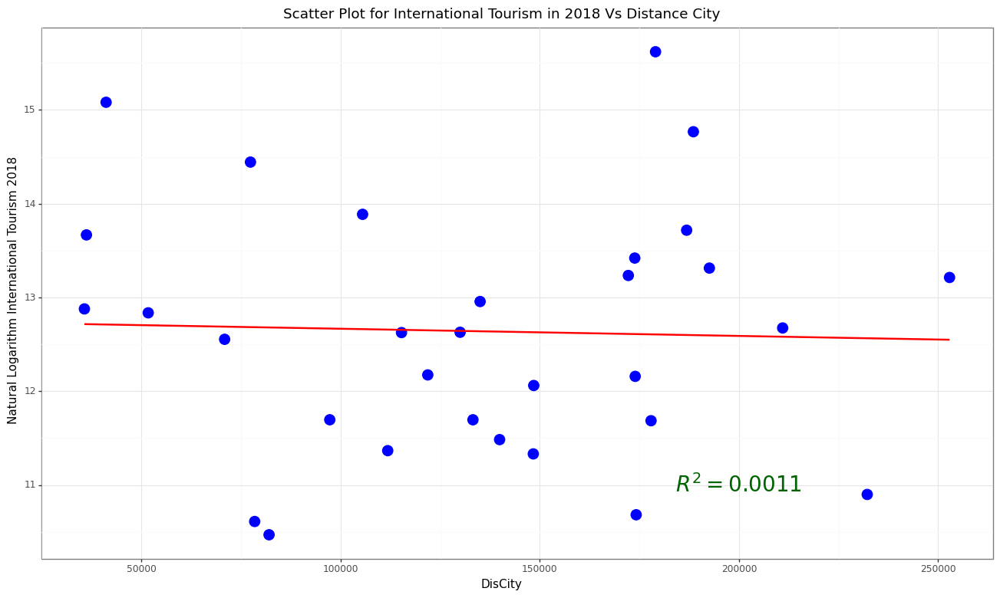

In [59]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y3)
preds91 = Model91.predict(x9)
R291 = r2_score(y3, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat3, aes(x = 'DisCity', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance City", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 3000000, label = r"$R^2 = 0.0$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'DisCity', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance City", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)

#### get logarithm of y


Model92 = regr.fit(x9, y3_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y3_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))

P2 = (ggplot(dat3, aes(x = 'DisCity', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance City", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0011$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br><hr><hr><br><br>


#### Define a Model With all Variables

In [60]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y3, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
xx = scaler.fit_transform(X)

xx2 = sm.add_constant(xx)

model2 = sm.OLS(y3, xx2).fit()
print_model2 = model2.summary()
print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y3_log, xx2).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:             Int_18_Ann   R-squared:                       0.208
Model:                            OLS   Adj. R-squared:                 -0.188
Method:                 Least Squares   F-statistic:                    0.5253
Date:                Thu, 25 May 2023   Prob (F-statistic):              0.852
Time:                        03:52:16   Log-Likelihood:                -475.35
No. Observations:                  31   AIC:                             972.7
Df Residuals:                      20   BIC:                             988.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         2861.7783   1.15e+06      0.002   

<br><br><hr><hr><br><br>


#### get correlation Matrix between variables


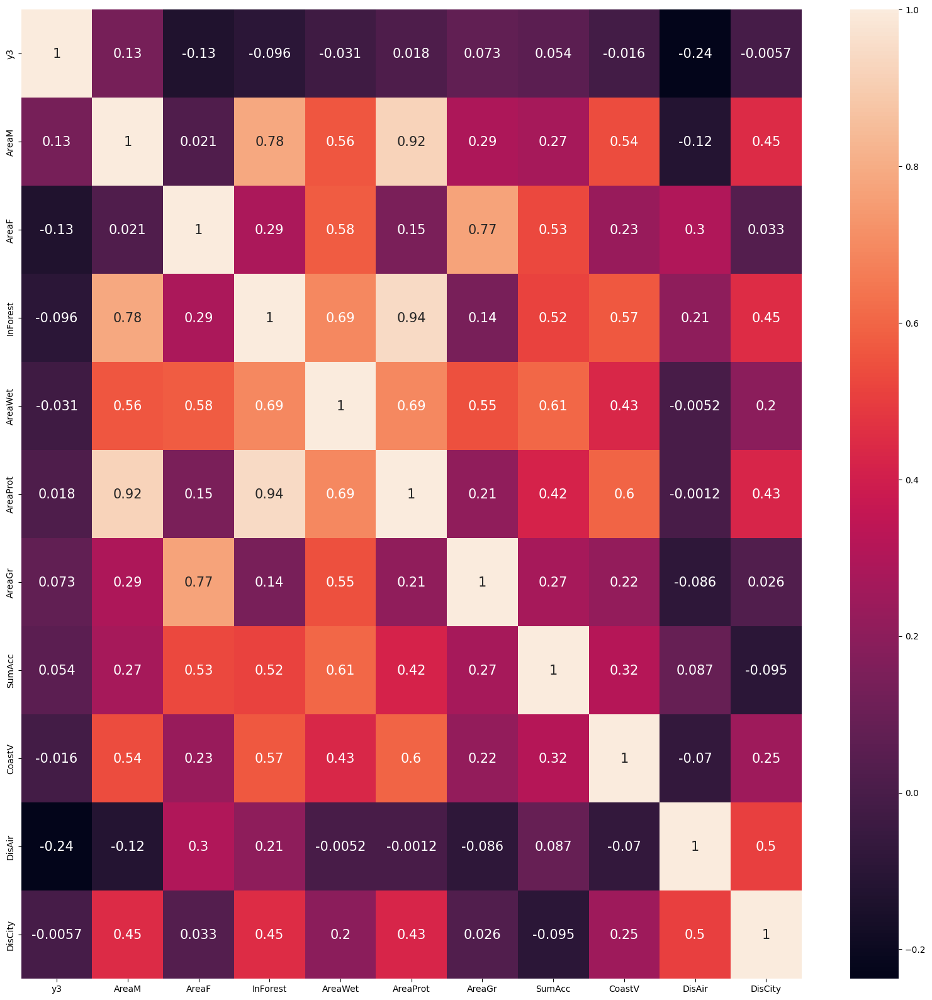

<Figure size 2000x2000 with 0 Axes>

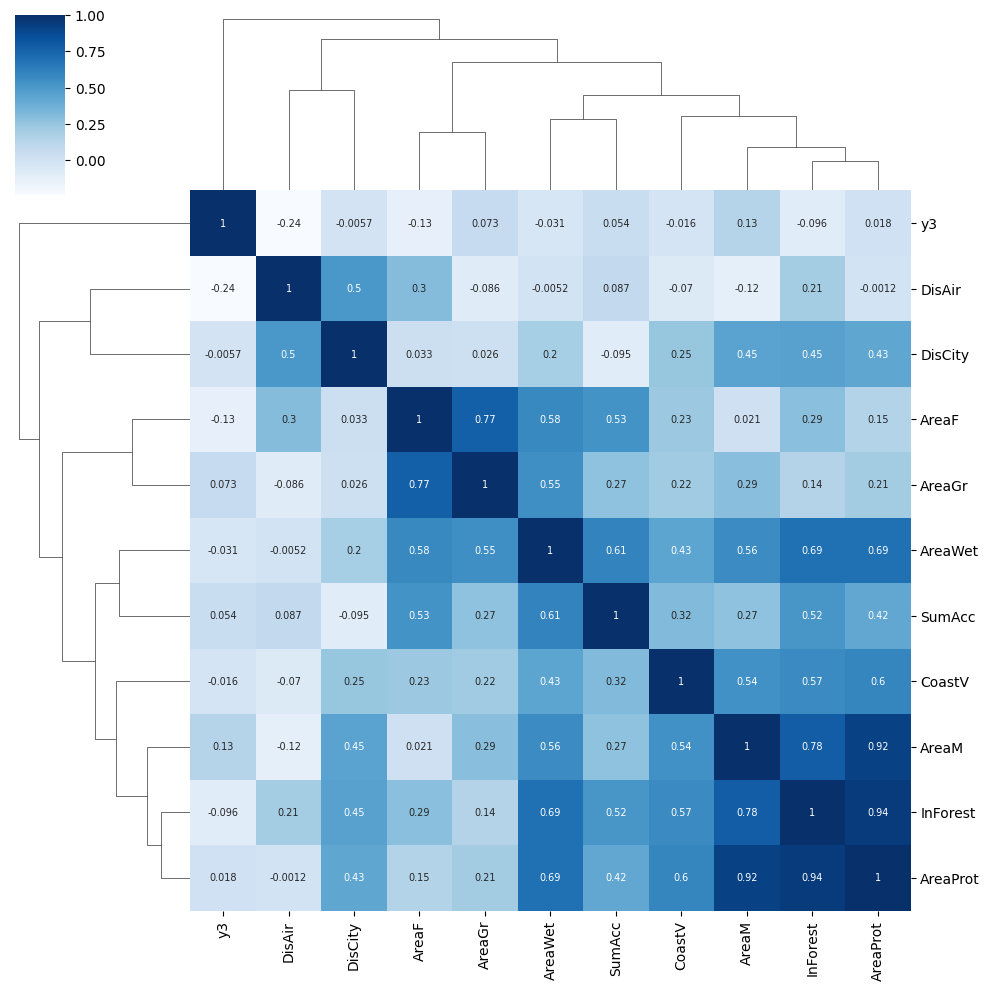

<Figure size 2000x2000 with 0 Axes>

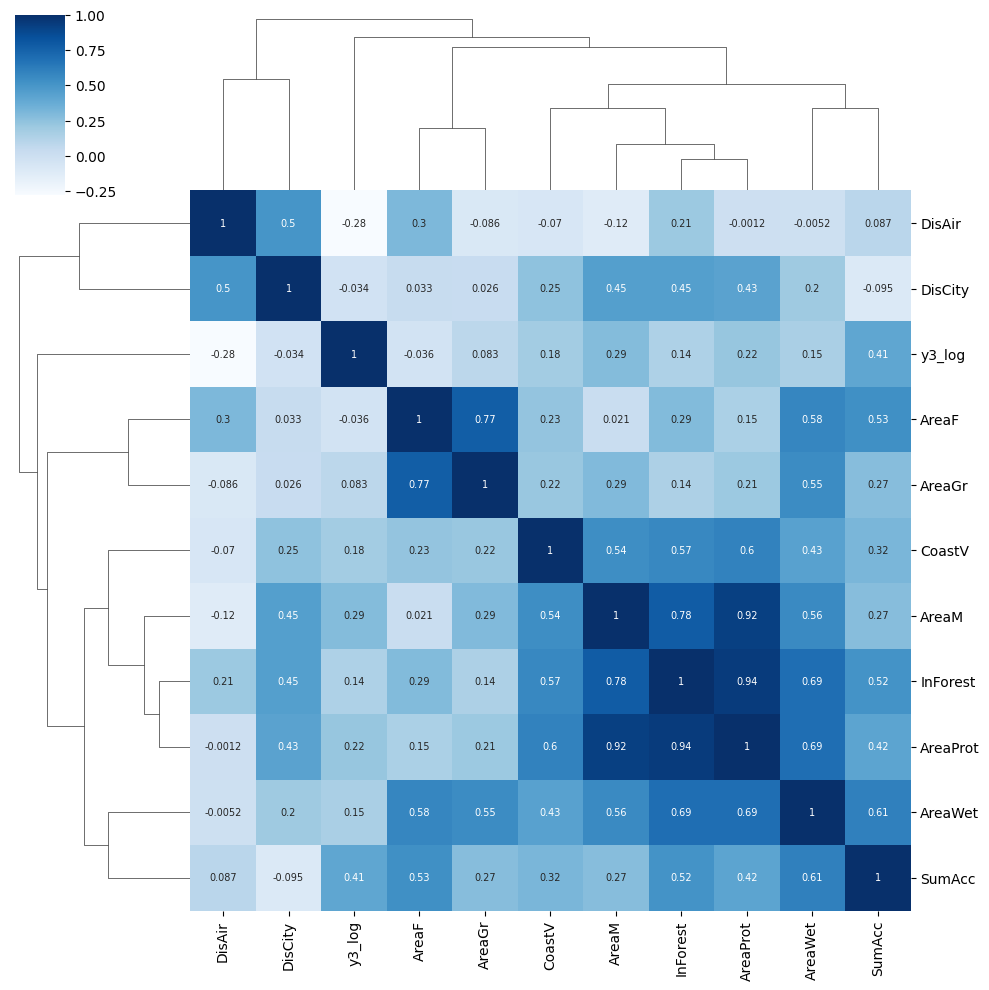

In [61]:
dat3_corr = dat3.drop(['y3_log', 'RTO_Names'], axis = 1)
dat3_corr.columns
dat3_corrr = dat3_corr.corr()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat3_corrr, annot = True, annot_kws = {"size" : 15})
plt.show()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat3_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()




dat3_corr_2 = dat3.drop(['y3', 'RTO_Names'], axis = 1)
dat3_corr_2.columns
dat3_corrr_2 = dat3_corr_2.corr()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat3_corrr_2, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

<br><br><hr><hr><br><br>




In [62]:
X_new = X.drop(['Area_Wetland', 'DisToCity', 'Indi_Forest', 'Area_Protect'], axis = 1)

temp1 = X_new.columns
temp1
xx = scaler.fit_transform(X_new)
xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y3, xx).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y3_log, xx).fit()
print_model3 = model3.summary()
print(print_model3)


                                 OLS Regression Results                                
Dep. Variable:             Int_18_Ann   R-squared (uncentered):                   0.360
Model:                            OLS   Adj. R-squared (uncentered):              0.207
Method:                 Least Squares   F-statistic:                              2.347
Date:                Thu, 25 May 2023   Prob (F-statistic):                      0.0618
Time:                        03:52:17   Log-Likelihood:                         -476.80
No. Observations:                  31   AIC:                                      965.6
Df Residuals:                      25   BIC:                                      974.2
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br><hr><hr><hr><hr><br><br>


## International Tourism 2021


#### define data for International Tourism in 2021

In [63]:
y4 = dat_org['Int_21_Ann']
y4_log = np.log(y4)
dat4 = pd.concat([y4, X], axis = 1, join = "outer")
dat4.index = dat_org['RTO_Name']
dat4.columns =  ['y4', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 
'AreaGr', 'SumAcc', 'CoastV', 'DisAir', 'DisCity']
dat4['RTO_Names']= dat_org['RTO_Name'].values
dat4['y4_log'] = y4_log.values
dat4
dat4.columns

Index(['y4', 'AreaM', 'AreaF', 'InForest', 'AreaWet', 'AreaProt', 'AreaGr',
       'SumAcc', 'CoastV', 'DisAir', 'DisCity', 'RTO_Names', 'y4_log'],
      dtype='object')

<br><br><hr><hr><br><br>


#### For Area Mount

<IPython.core.display.Math object>

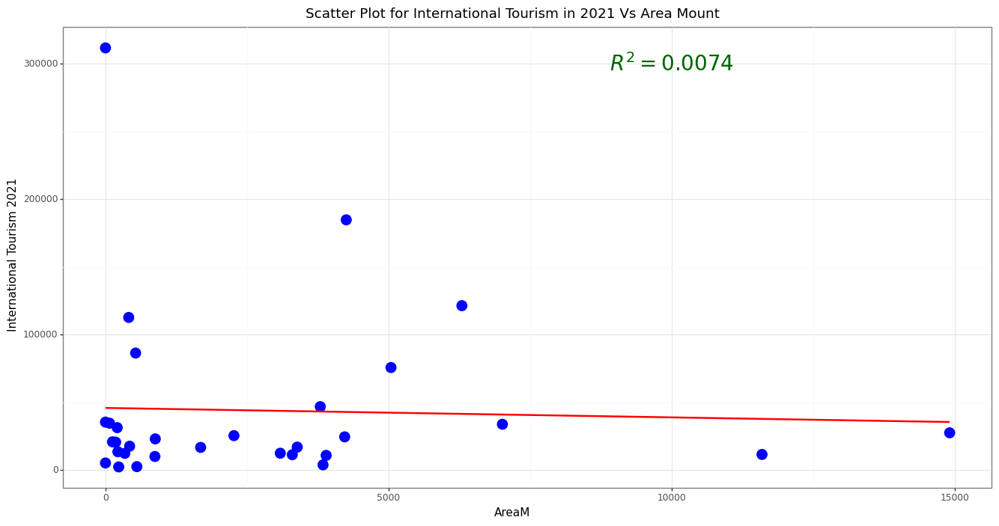

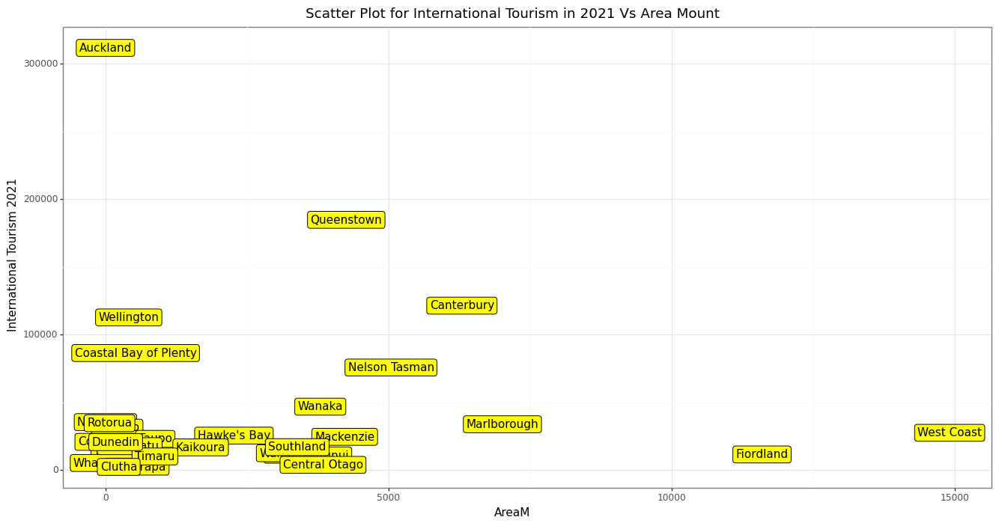

<IPython.core.display.Math object>

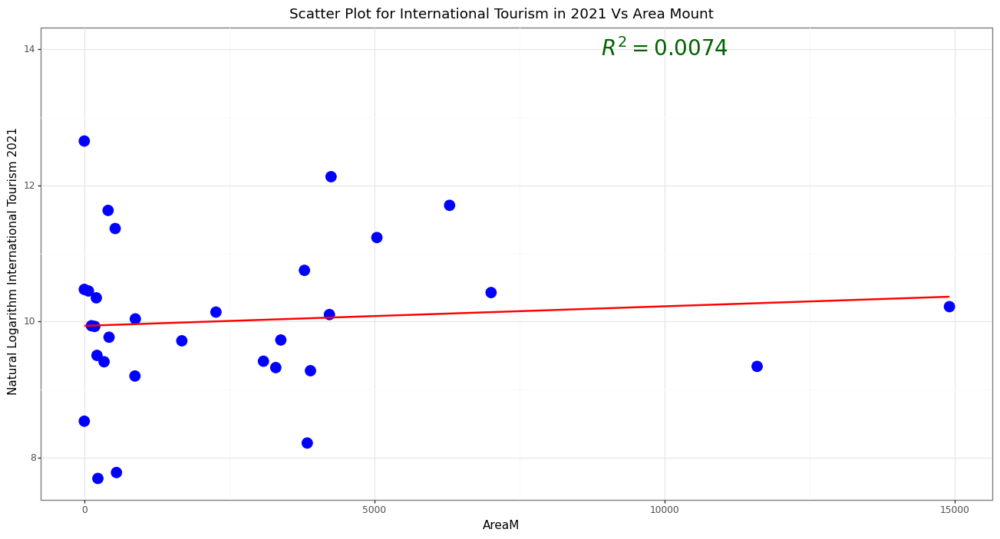

In [64]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y4)
preds = Model1.predict(x)
R2 = r2_score(y4, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat4, aes(x = 'AreaM', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Mount", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 300000, label = r"$R^2 = 0.0074$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)
## create label plot

P = (ggplot(dat4, aes(x = 'AreaM', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Mount", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model2 = regr.fit(x, y4_log)
preds2 = Model2.predict(x)
R22 = r2_score(y4_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))


P2 = (ggplot(dat4, aes(x = 'AreaM', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Mount", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0074$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Area Flat

<IPython.core.display.Math object>

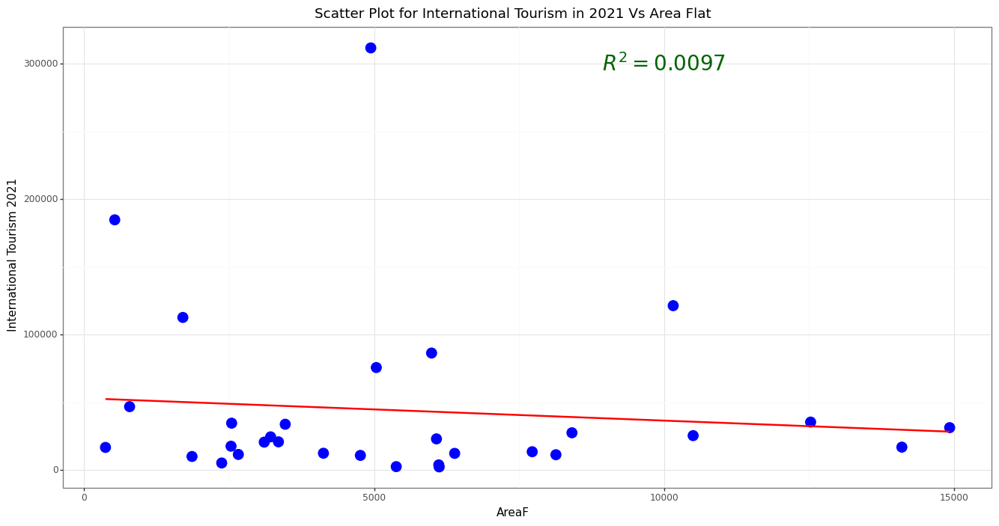

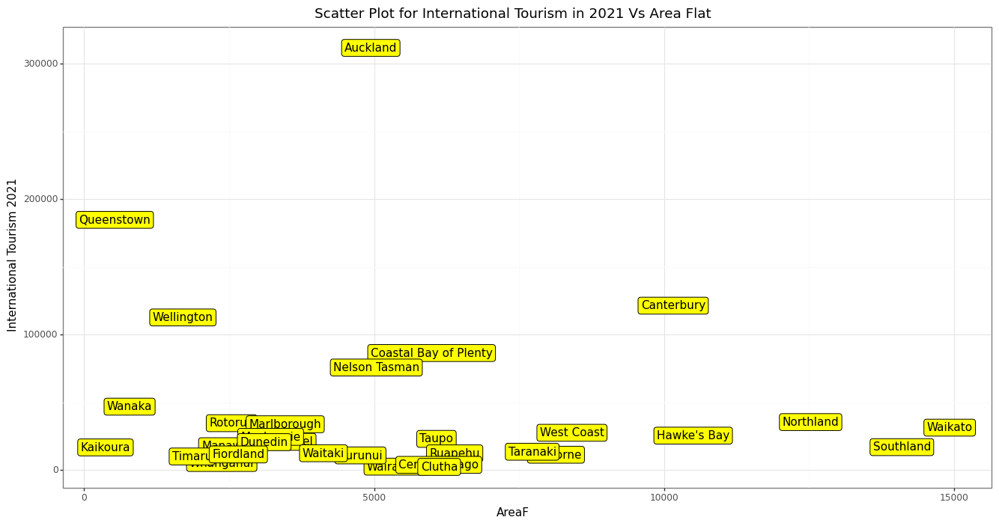

<IPython.core.display.Math object>

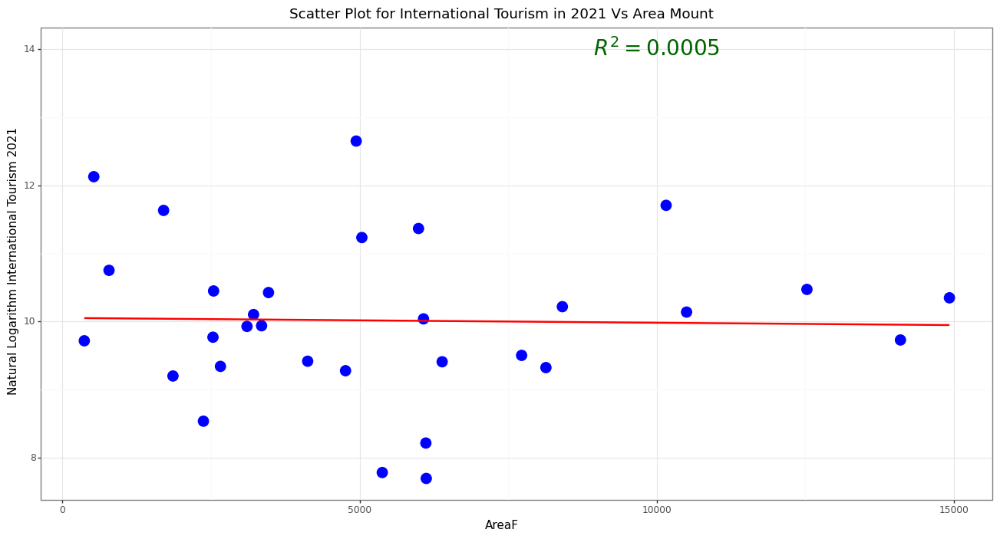

In [65]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y4)
preds21 = Model2.predict(x1)
R2 = r2_score(y4, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat4, aes(x = 'AreaF', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Flat", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 300000, label = r"$R^2 = 0.0097$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat4, aes(x = 'AreaF', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Flat", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model22 = regr.fit(x1, y4_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y4_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))

P2 = (ggplot(dat4, aes(x = 'AreaF', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Mount", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0005$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for Area InForest

<IPython.core.display.Math object>

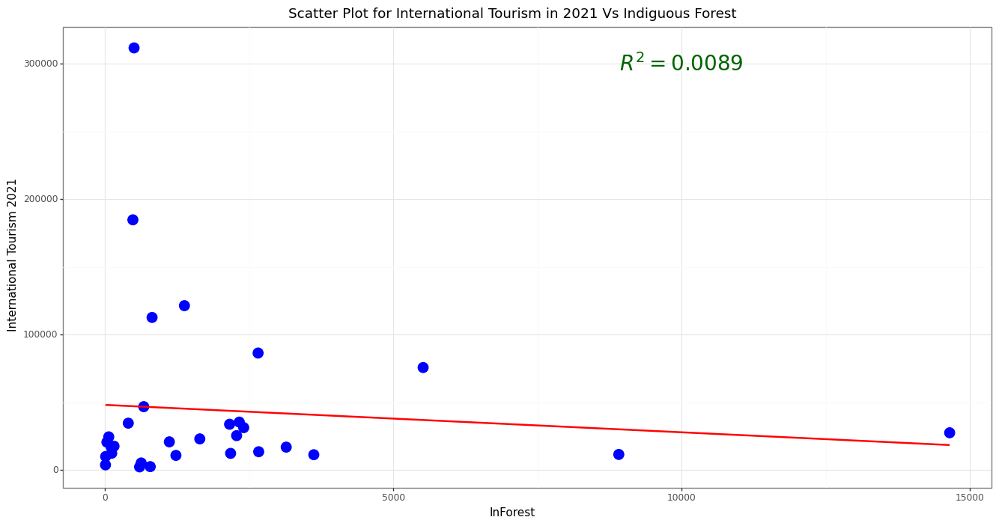

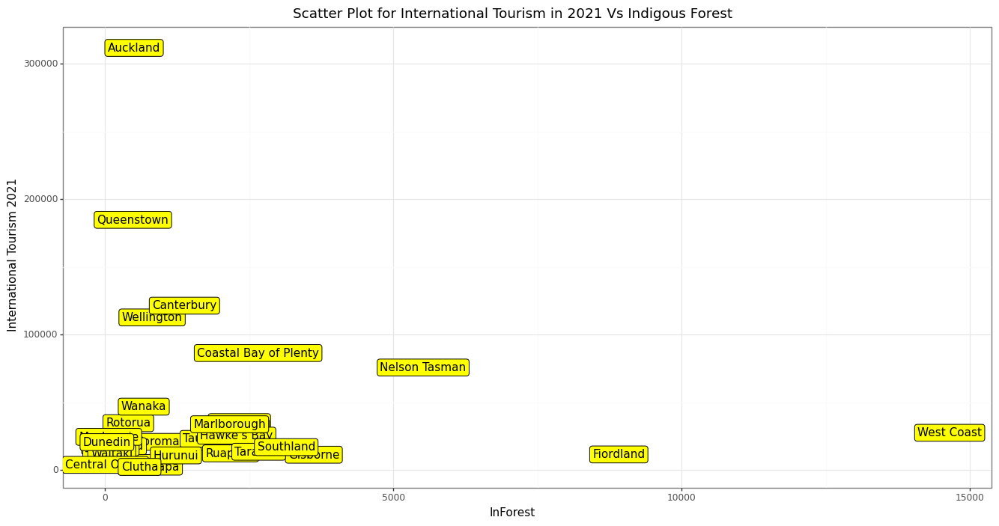

<IPython.core.display.Math object>

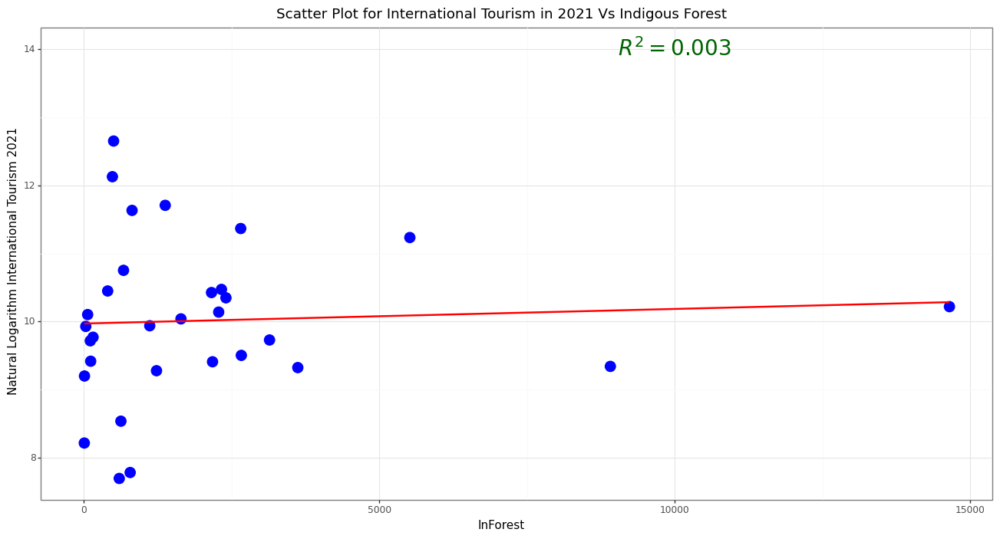

In [66]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y4)
preds31 = Model3.predict(x2)
R231 = r2_score(y4, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat4, aes(x = 'InForest', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Indiguous Forest", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000, y = 300000, label = r"$R^2 = 0.0089$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot

P = (ggplot(dat4, aes(x = 'InForest', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Indigous Forest", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model32 = regr.fit(x2, y4_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y4_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))


P2 = (ggplot(dat4, aes(x = 'InForest', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Indigous Forest", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.003$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for Area Wetland

<IPython.core.display.Math object>

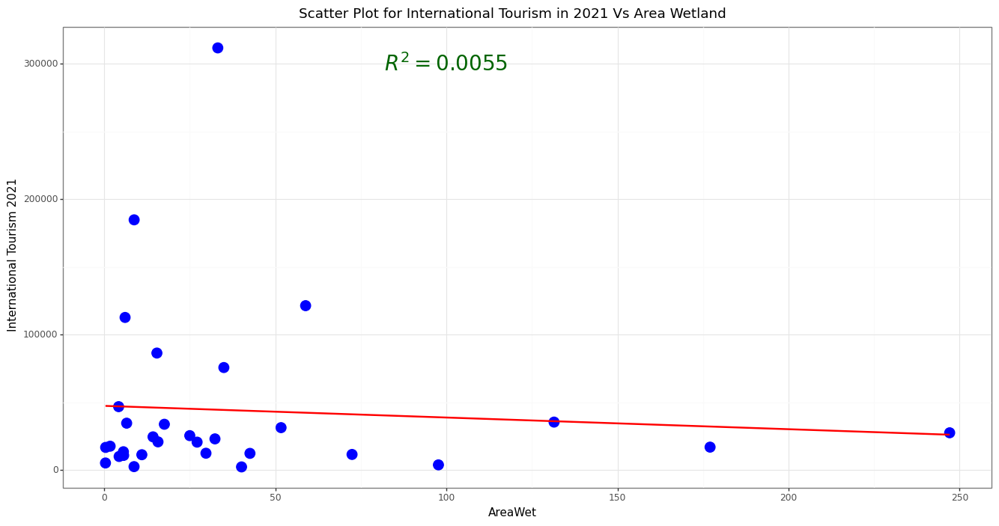

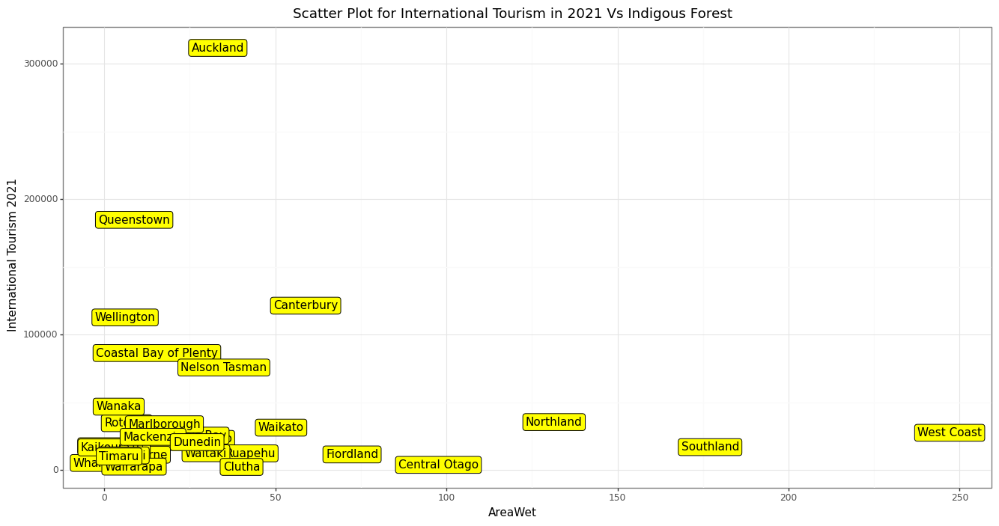

<IPython.core.display.Math object>

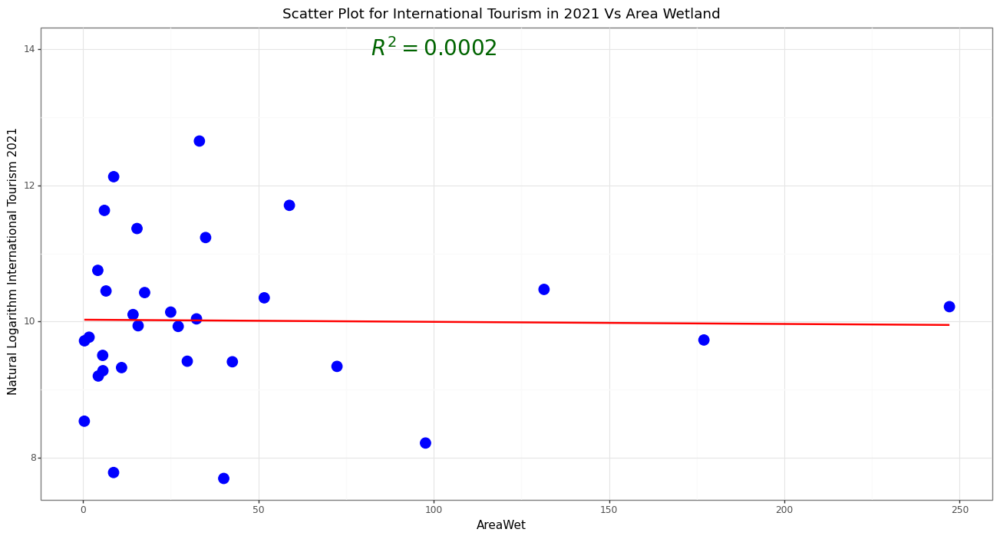

In [67]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y4)
preds41 = Model41.predict(x3)
R241 = r2_score(y4, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))


P1 = (ggplot(dat4, aes(x = 'AreaWet', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Wetland", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100,  y = 300000, label = r"$R^2 = 0.0055$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat4, aes(x = 'AreaWet', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Indigous Forest", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model42 = regr.fit(x3, y4_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y4_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))


P2 = (ggplot(dat4, aes(x = 'AreaWet', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Wetland", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 100, y = 14, label = r"$R^2 = 0.0002$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>



#### for Area Protect

<IPython.core.display.Math object>

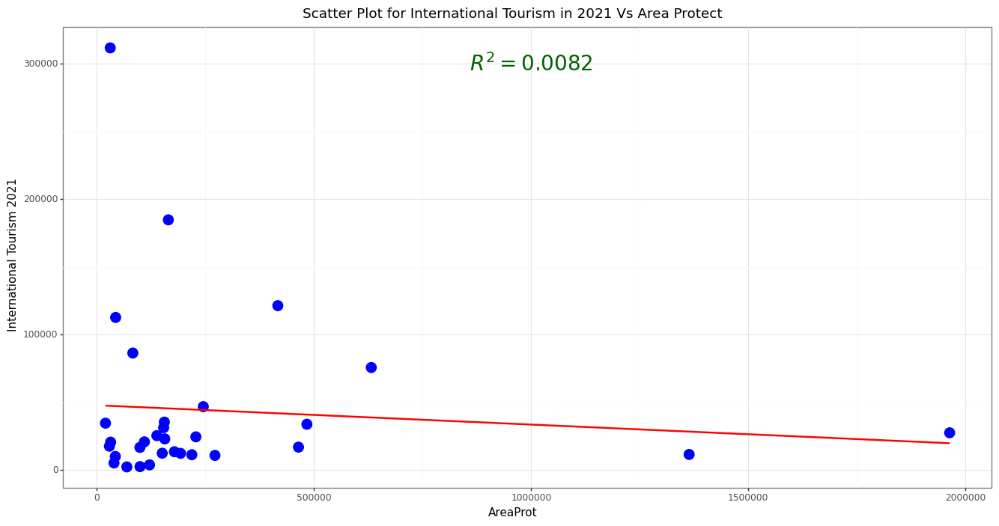

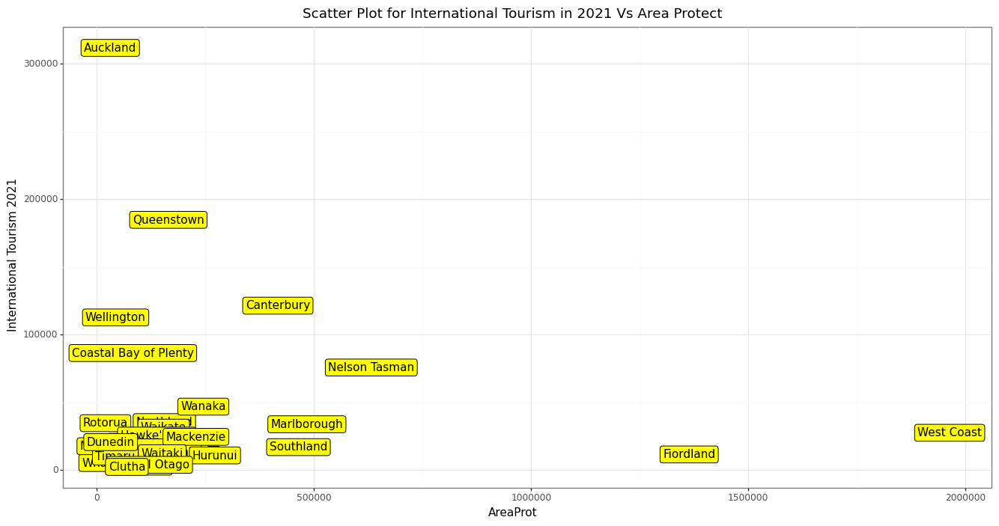

<IPython.core.display.Math object>

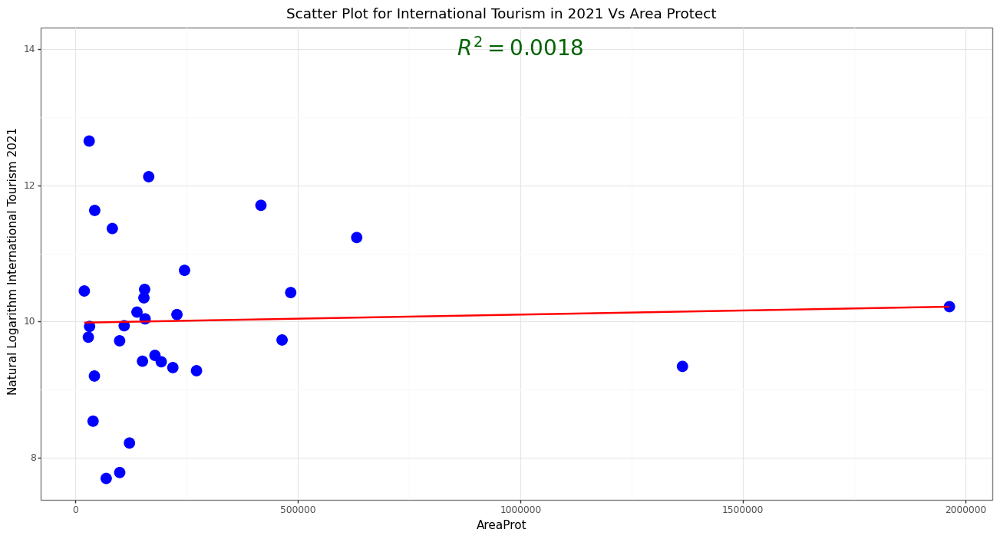

In [68]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y4)
preds51 = Model51.predict(x4)
R251 = r2_score(y4, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))


P1 = (ggplot(dat4, aes(x = 'AreaProt', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Protect", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000,  y = 300000, label = r"$R^2 = 0.0082$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat4, aes(x = 'AreaProt', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Protect", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y4_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y4_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P2 = (ggplot(dat4, aes(x = 'AreaProt', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Protect", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000, y = 14, label = r"$R^2 = 0.0018$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### for Area Grass

<IPython.core.display.Math object>

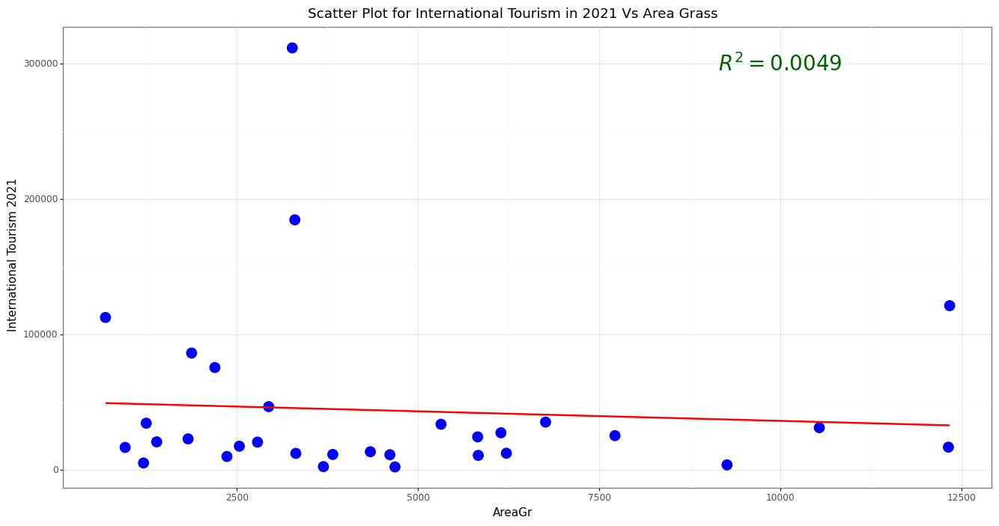

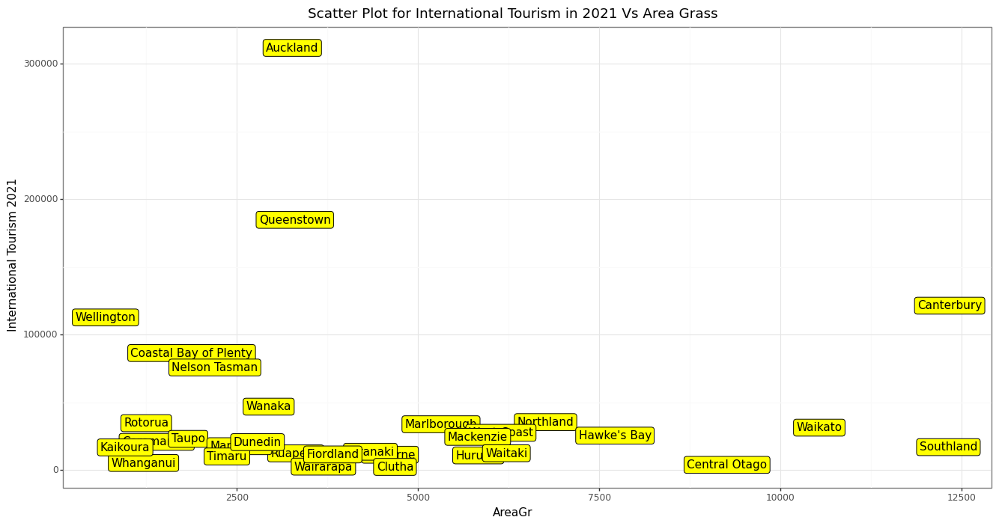

<IPython.core.display.Math object>

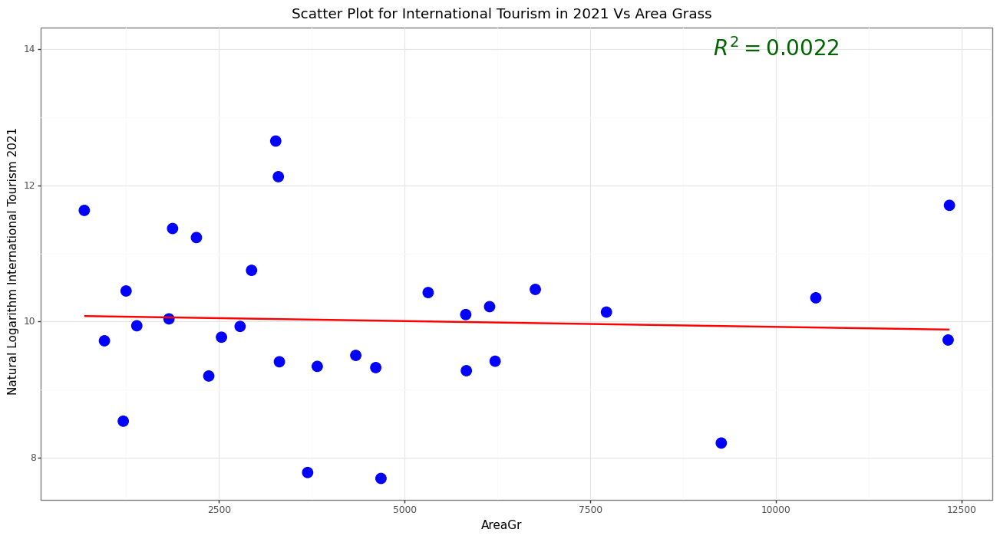

In [69]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y4)
preds61 = Model61.predict(x5)
R261 = r2_score(y4, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))


P1 = (ggplot(dat4, aes(x = 'AreaGr', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Grass", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 10000,  y = 300000, label = r"$R^2 = 0.0049$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat4, aes(x = 'AreaGr', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Grass", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y4_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y4_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))


P2 = (ggplot(dat4, aes(x = 'AreaGr', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Area Grass", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 10000, y = 14, label = r"$R^2 = 0.0022$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### for Sum ACCESS

<IPython.core.display.Math object>

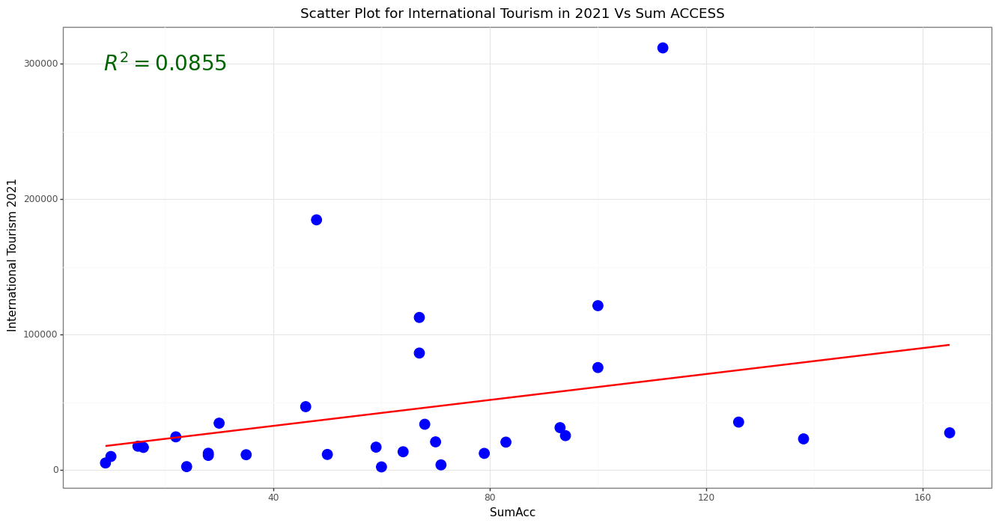

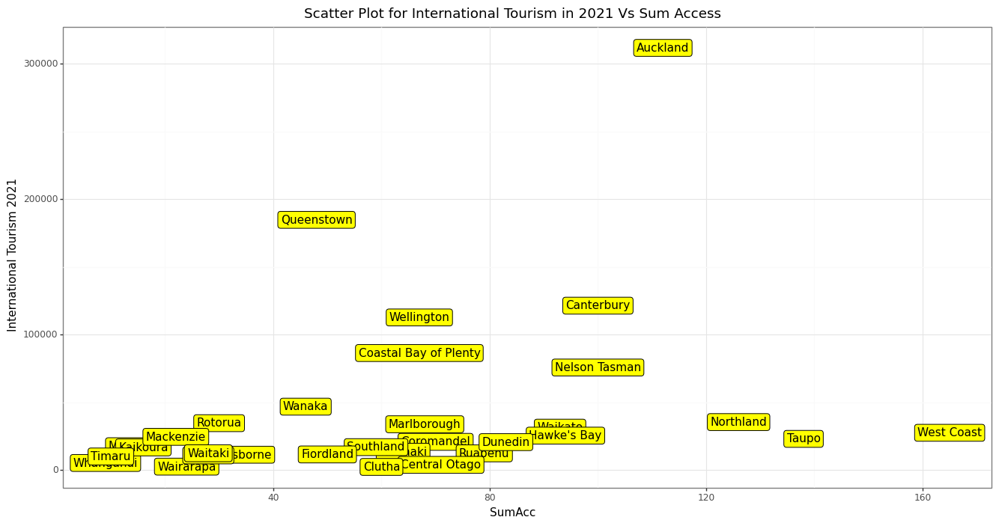

<IPython.core.display.Math object>

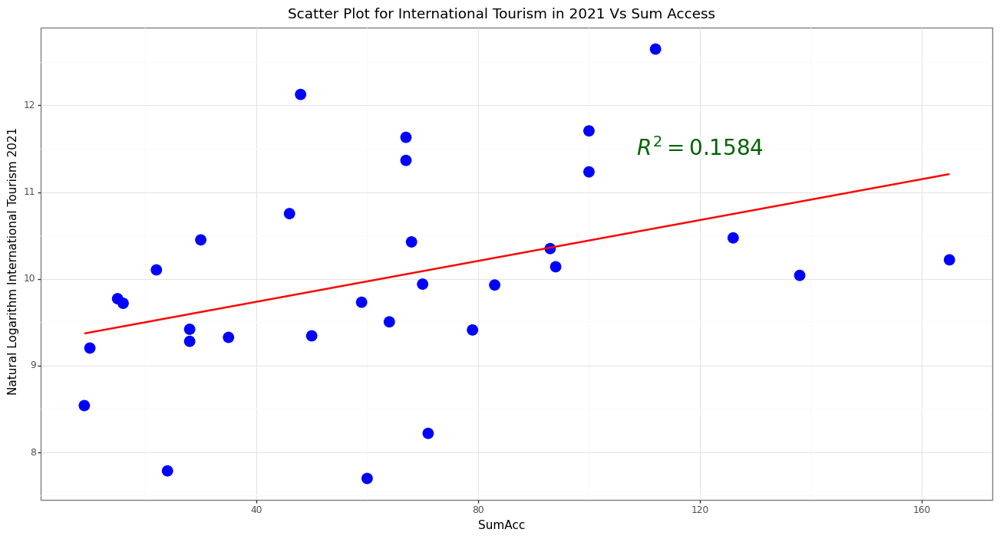

In [70]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y4)
preds71 = Model71.predict(x6)
R271 = r2_score(y4, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


P1 = (ggplot(dat4, aes(x = 'SumAcc', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Sum ACCESS", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 20,  y = 300000, label = r"$R^2 = 0.0855$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)


## create label plot


P = (ggplot(dat4, aes(x = 'SumAcc', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Sum Access", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model72 = regr.fit(x6, y4_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y4_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))


P2 = (ggplot(dat4, aes(x = 'SumAcc', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Sum Access", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 120, y = 11.5, label = r"$R^2 = 0.1584$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>

#### for Coast View


<IPython.core.display.Math object>

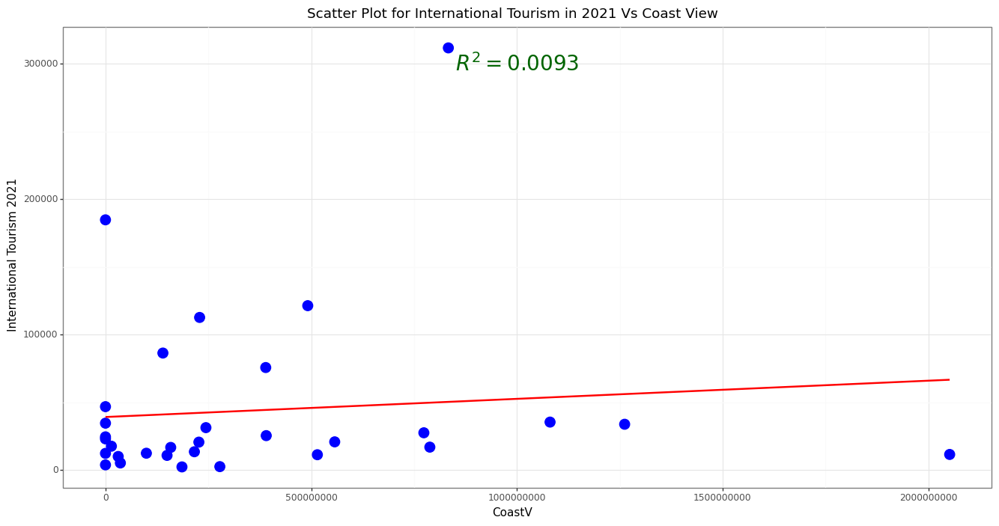

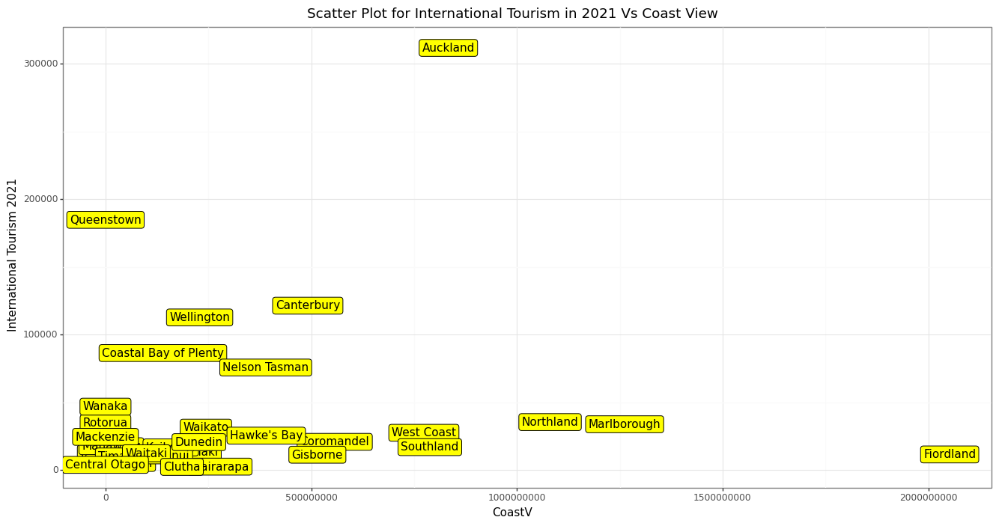

<IPython.core.display.Math object>

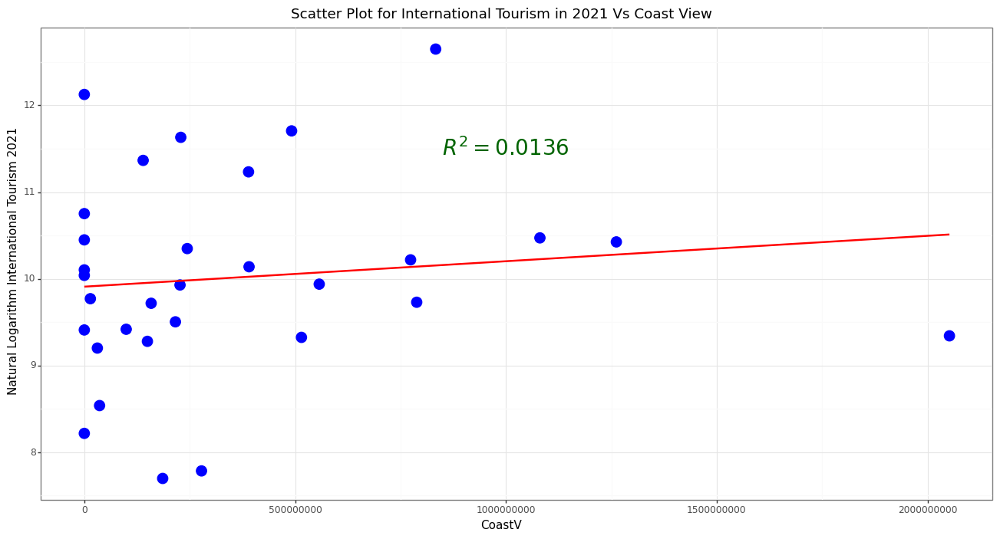

In [71]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y4)
preds81 = Model81.predict(x7)
R281 = r2_score(y4, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat4, aes(x = 'CoastV', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Coast View", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 1000000000,  y = 300000, label = r"$R^2 = 0.0093$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)


## create label plot


P = (ggplot(dat4, aes(x = 'CoastV', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Coast View", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model82 = regr.fit(x7, y4_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y4_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))


P2 = (ggplot(dat4, aes(x = 'CoastV', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Coast View", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 1000000000, y = 11.5, label = r"$R^2 = 0.0136$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for Distance AirPort

<IPython.core.display.Math object>

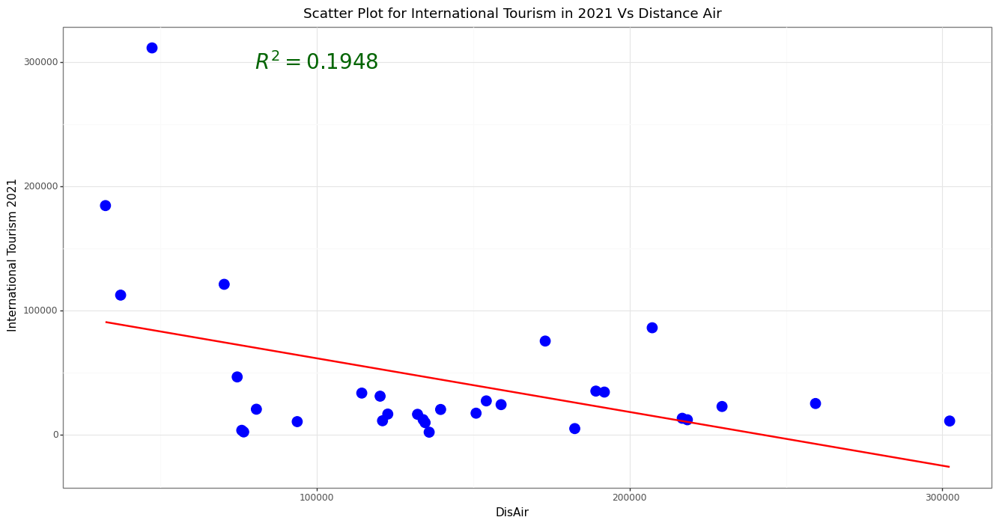

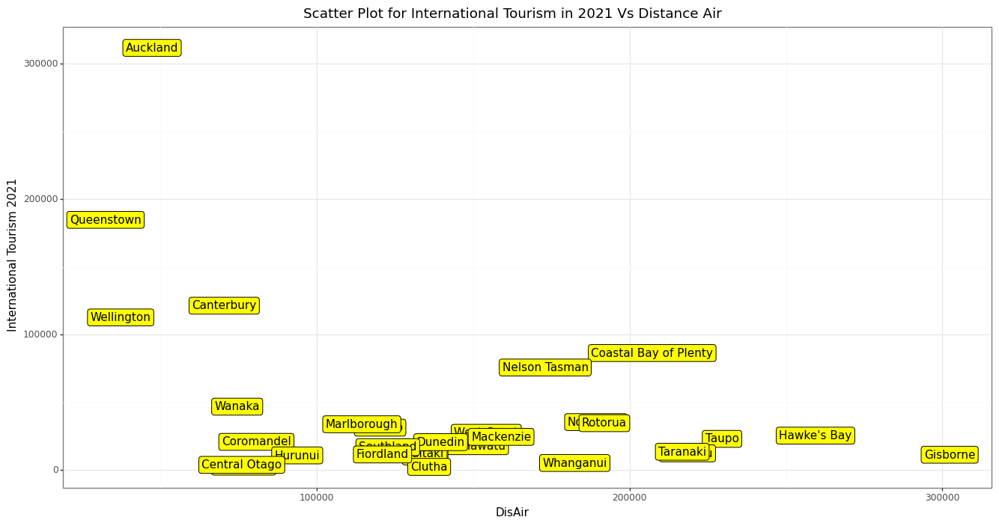

<IPython.core.display.Math object>

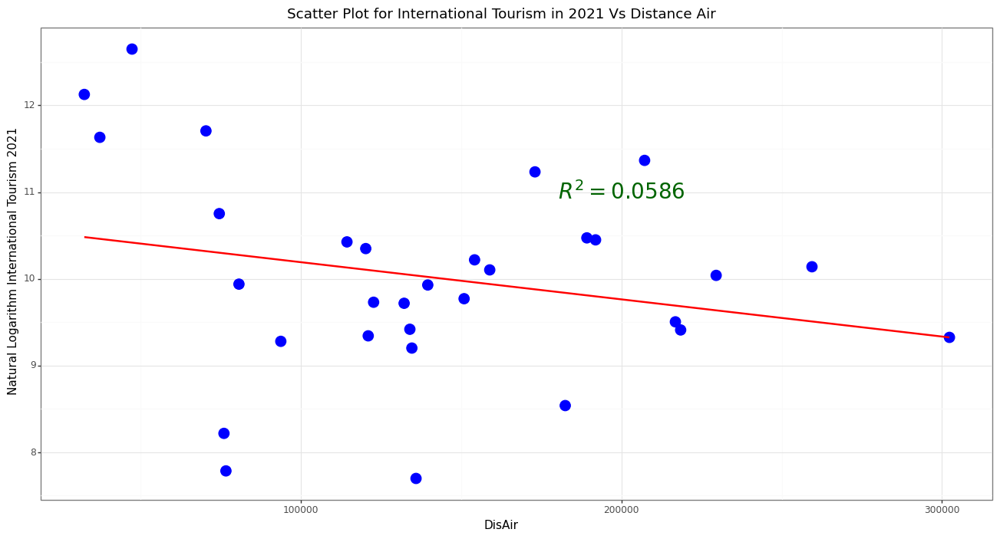

In [72]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y4)
preds91 = Model91.predict(x8)
R291 = r2_score(y4, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat4, aes(x = 'DisAir', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Distance Air", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 300000, label = r"$R^2 = 0.1948$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat4, aes(x = 'DisAir', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Distance Air", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)


#### get logarithm of y


Model92 = regr.fit(x8, y4_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y4_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))




P2 = (ggplot(dat4, aes(x = 'DisAir', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Distance Air", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.0586$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for Distance City

<IPython.core.display.Math object>

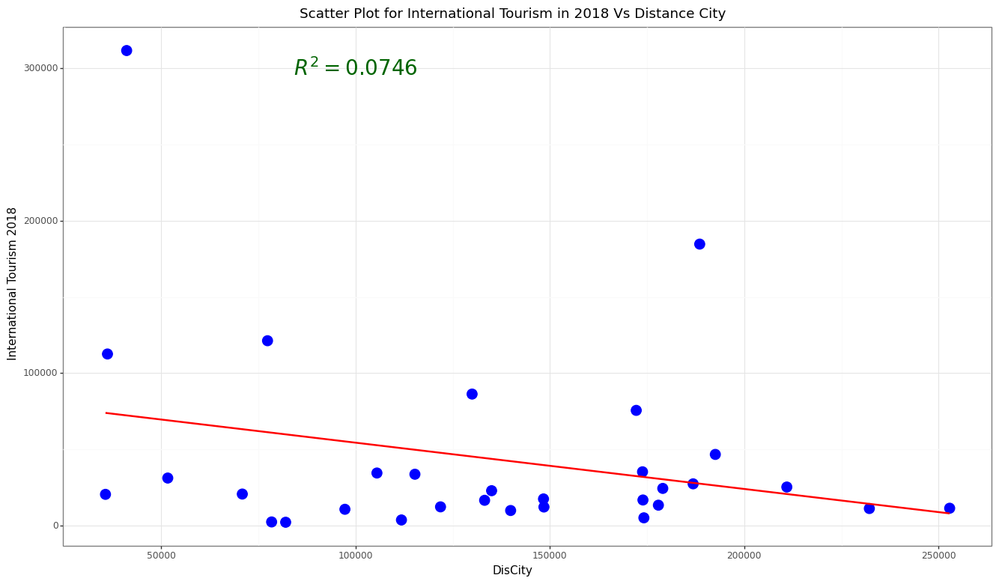

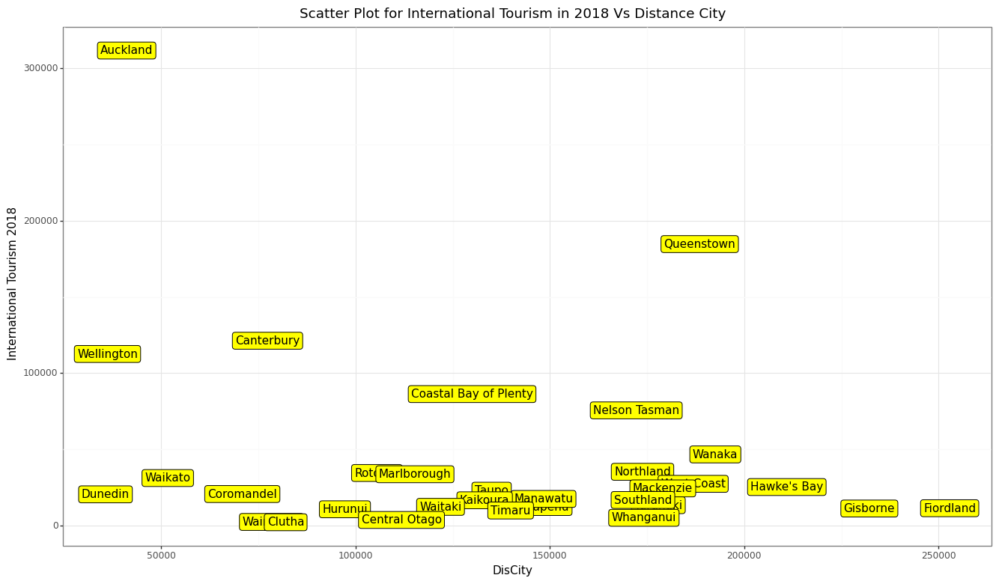

<IPython.core.display.Math object>

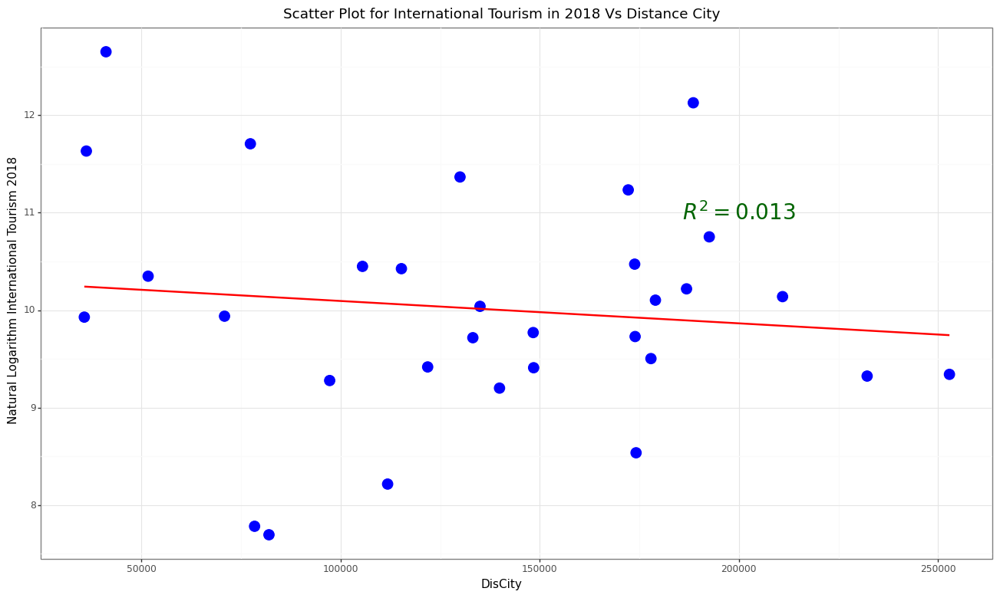

In [73]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y4)
preds91 = Model91.predict(x9)
R291 = r2_score(y4, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))



P1 = (ggplot(dat4, aes(x = 'DisCity', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance City", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 100000,  y = 300000, label = r"$R^2 = 0.0746$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)


## create label plot


P = (ggplot(dat4, aes(x = 'DisCity', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance City", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))
print(P)


#### get logarithm of y


Model92 = regr.fit(x9, y4_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y4_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat4, aes(x = 'DisCity', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Distance City", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 200000, y = 11, label = r"$R^2 = 0.013$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br><hr><hr><br><br>



#### define a Model with all variables 

In [74]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y4, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
xx = scaler.fit_transform(X)

xx2 = sm.add_constant(xx)

model2 = sm.OLS(y4, xx2).fit()
print_model2 = model2.summary()
print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y4_log, xx2).fit()
print_model3 = model3.summary()
print(print_model3)


                            OLS Regression Results                            
Dep. Variable:             Int_21_Ann   R-squared:                       0.557
Model:                            OLS   Adj. R-squared:                  0.336
Method:                 Least Squares   F-statistic:                     2.516
Date:                Thu, 25 May 2023   Prob (F-statistic):             0.0379
Time:                        03:52:22   Log-Likelihood:                -374.07
No. Observations:                  31   AIC:                             770.1
Df Residuals:                      20   BIC:                             785.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         6.977e+04   4.39e+04      1.589   

<br><br><hr><hr><br><br>


#### get correlation Matrix between variables

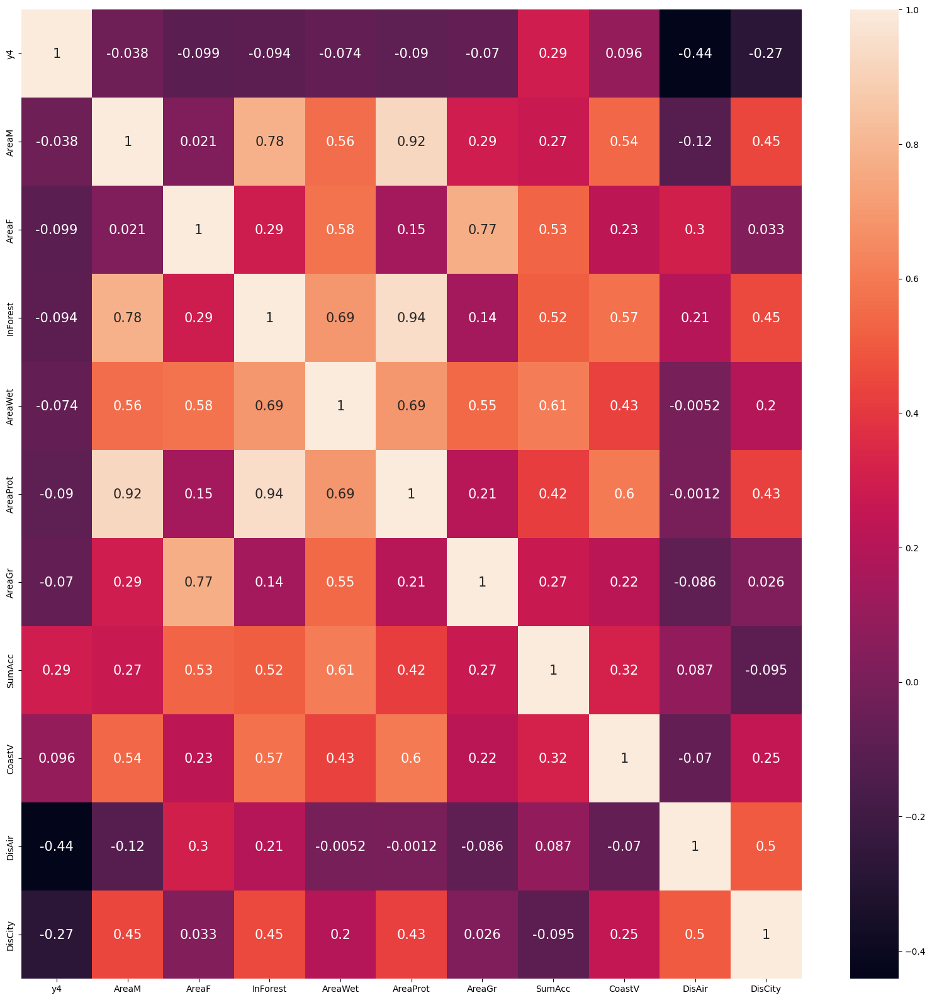

<Figure size 2000x2000 with 0 Axes>

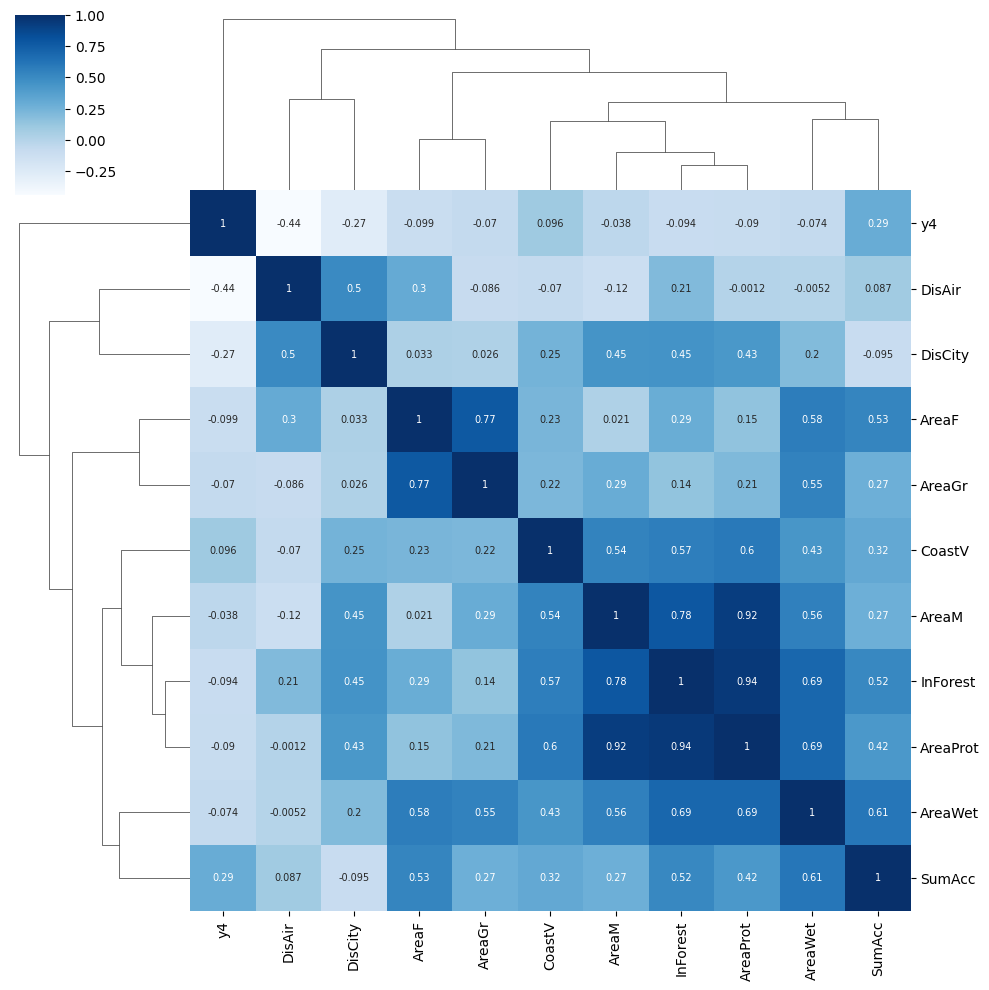

<Figure size 2000x2000 with 0 Axes>

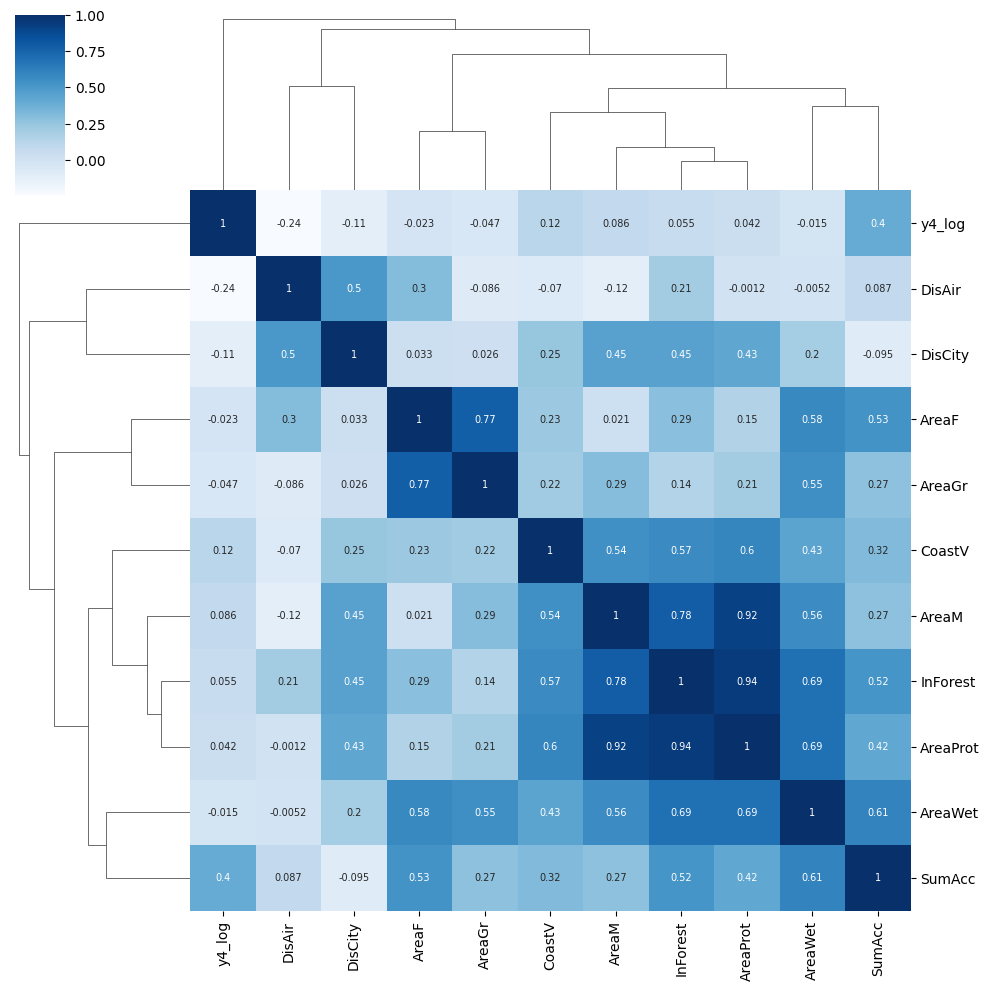

In [75]:
dat4_corr = dat4.drop(['y4_log', 'RTO_Names'], axis = 1)
dat4_corr.columns
dat4_corrr = dat4_corr.corr()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat4_corrr, annot = True, annot_kws = {"size" : 15})
plt.show()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat4_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()




dat4_corr_2 = dat4.drop(['y4', 'RTO_Names'], axis = 1)
dat4_corr_2.columns
dat4_corrr_2 = dat4_corr_2.corr()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat4_corrr_2, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

<br><br><hr><hr><br><br>

In [76]:
X_new = X.drop(['Area_Wetland', 'DisToCity', 'Indi_Forest', 'Area_Protect'], axis = 1)

temp1 = X_new.columns
temp1
xx = scaler.fit_transform(X_new)
xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y4, xx).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y4_log, xx).fit()
print_model3 = model3.summary()
print(print_model3)


                                 OLS Regression Results                                
Dep. Variable:             Int_21_Ann   R-squared (uncentered):                   0.489
Model:                            OLS   Adj. R-squared (uncentered):              0.366
Method:                 Least Squares   F-statistic:                              3.987
Date:                Thu, 25 May 2023   Prob (F-statistic):                     0.00619
Time:                        03:52:23   Log-Likelihood:                         -382.38
No. Observations:                  31   AIC:                                      776.8
Df Residuals:                      25   BIC:                                      785.4
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

<br><br><hr><hr><hr><hr><br><br>


## Compare Data

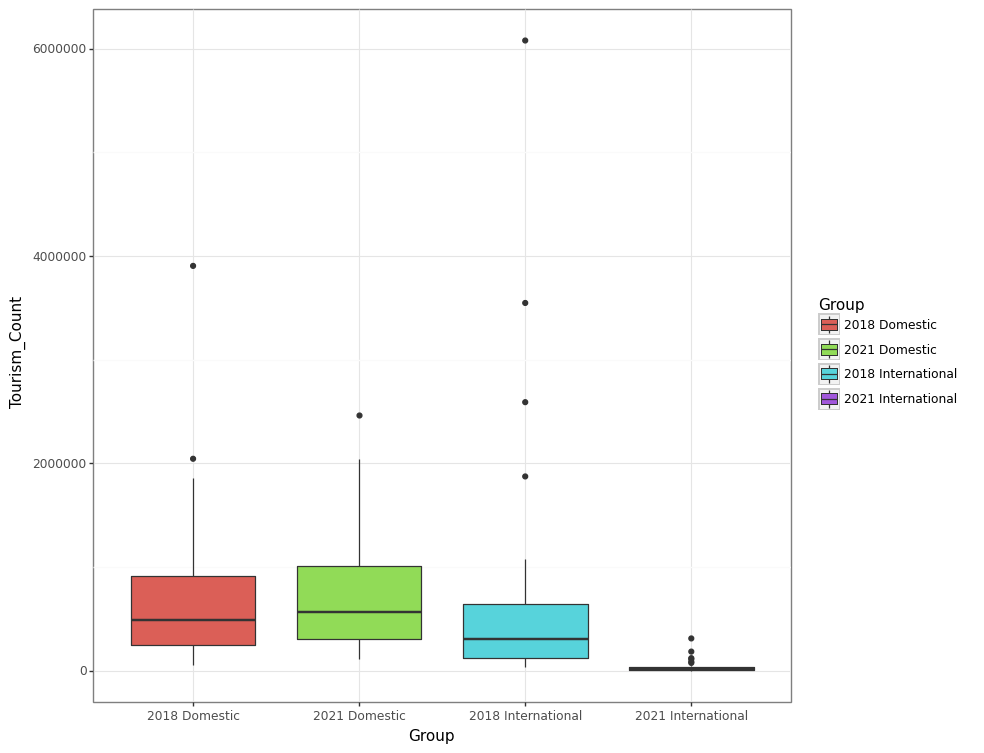

<ggplot: (131172437593)>

In [77]:
dat1.shape
str1 = '2018 Domestic'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism_Count' : y1, 
'Group' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 Domestic'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism_Count' : y2, 
'Group' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf1 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)





str1 = '2018 International'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism_Count' : y3, 
'Group' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 International'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism_Count' : y4, 
'Group' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf2 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)

Long_Data = pd.concat([newdf1, newdf2], sort = False, 
ignore_index = True)

P_box1  = (ggplot(Long_Data, aes(y = 'Tourism_Count', x = 'Group')) + 
geom_boxplot(aes(fill = 'Group')) + 
theme_bw() + 
theme(figure_size = (9, 9))) 
P_box1


<br><br><hr><hr><br><br>
#### For Log Data

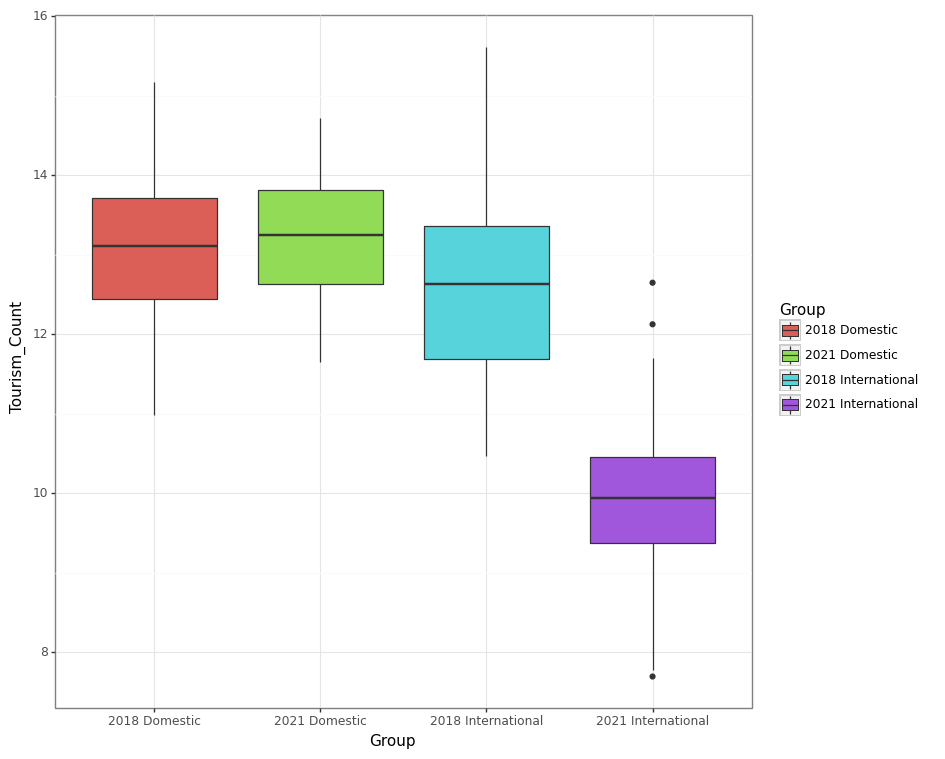

<ggplot: (131170354205)>

In [78]:
str1 = '2018 Domestic'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism_Count' : y1_log, 
'Group' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 Domestic'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism_Count' : y2_log, 
'Group' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf1 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)





str1 = '2018 International'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism_Count' : y3_log, 
'Group' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 International'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism_Count' : y4_log, 
'Group' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf2 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)

Long_Data_log = pd.concat([newdf1, newdf2], sort = False, 
ignore_index = True)

P_box1  = (ggplot(Long_Data_log, aes(y = 'Tourism_Count', x = 'Group')) + 
geom_boxplot(aes(fill = 'Group')) + 
theme_bw() + 
theme(figure_size = (9, 9))) 
P_box1

<br><br><hr><hr><br><br>


## Mean Plot (Line Plot For Means)

                    Tourism_Count
Group                            
2018 Domestic       721640.451613
2021 Domestic       753012.903226
2018 International  744482.451613
2021 International   43877.419355


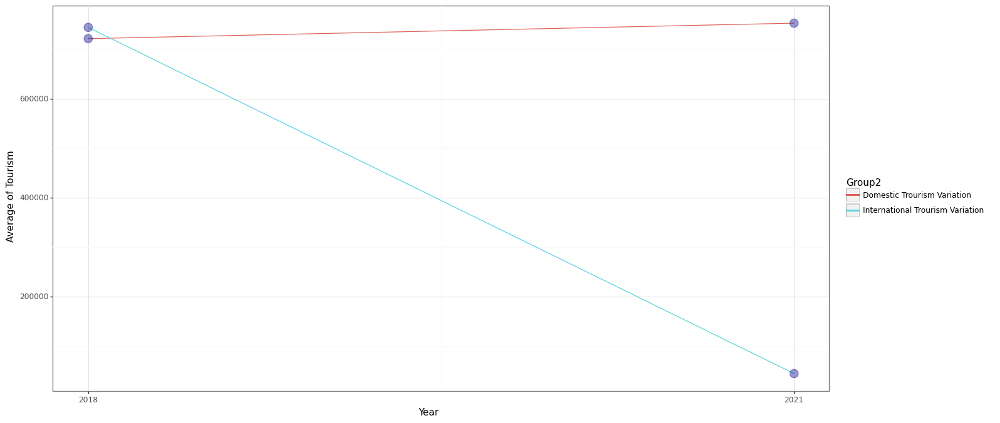

<ggplot: (131174216069)>

In [79]:
def  Mean(x): 
    return x.mean()
res_dat = Long_Data.groupby('Group').agg({'Tourism_Count' : Mean})

print(res_dat)
temp2 = ["Domestic Trourism Variation", "Domestic Trourism Variation", "International Trourism Variation", 
"International Trourism Variation"]

res_dat['Group2'] = temp2
res_dat['Index'] = [1, 10, 1, 10]

P_line = (ggplot(res_dat, aes(x = 'Index', y = 'Tourism_Count', 
group = 'Group2')) + 
geom_line(aes(colour = 'Group2')) + 
geom_point(size = 5, colour = "darkblue", alpha = .4) + 
theme_bw() + 
theme(figure_size = (16, 8)) + 
scale_x_continuous(breaks = (1, 10), 
                   labels = ("2018", "2021")) + 
                   labs(x = "Year", y = "Average of Tourism"))

P_line

<br><br><hr><hr><br>
## Update: 2023-05-23 
<hr><hr><br><br>



#### Normality Test for y1, y2, y3, y4 and y1_log, y2_log, y3_log, y4_log

<br><br><br>

#### Normality Test for y1 and y1_log

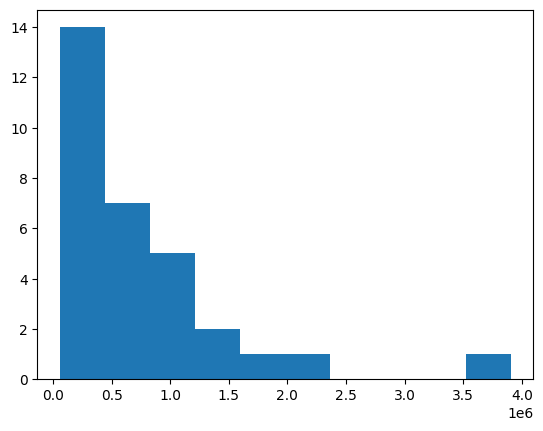

In [80]:
# histogram plot for y1
from matplotlib import pyplot
pyplot.hist(y1)
pyplot.show()

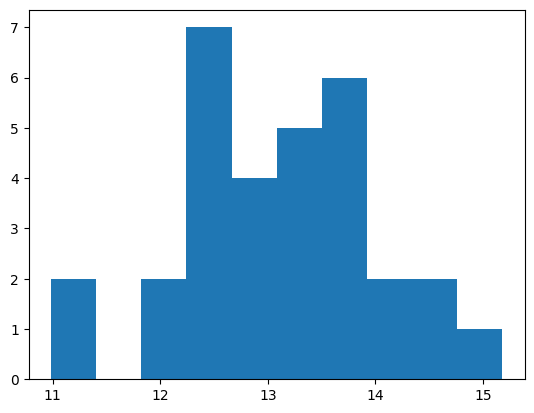

In [81]:
## histogram plot y1_log
from matplotlib import pyplot
pyplot.hist(y1_log)
pyplot.show()

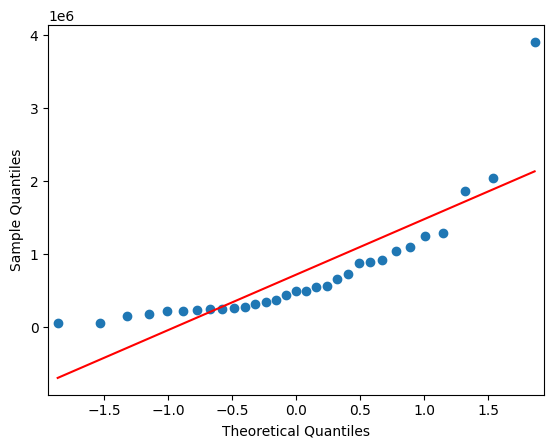

In [82]:
## QQ Plot for y1
from statsmodels.graphics.gofplots import qqplot

qqplot(y1, line='s')
pyplot.show()

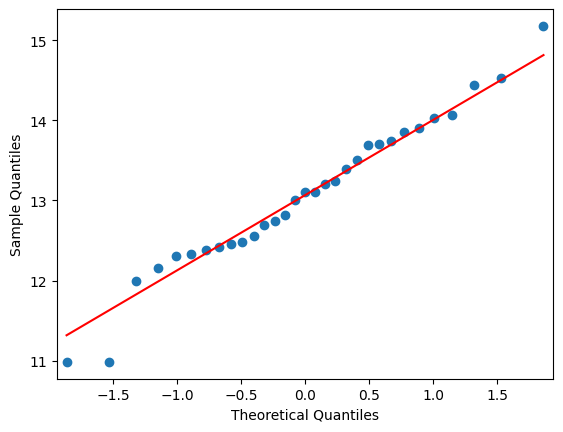

In [83]:
## QQ Plot for y1_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y1_log, line='s')
pyplot.show()

In [85]:
# Normality Test for y1

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y1)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.716, p=0.000
Sample does not look Gaussian (reject H0)


In [86]:
# Normality Test for y1

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y1_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.979, p=0.782
Sample looks Gaussian (fail to reject H0)


<br><br> <hr><hr><br><br>

#### Normality Test for y2, y2_log

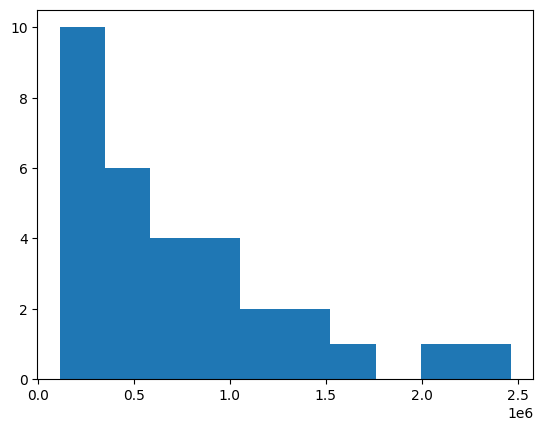

In [93]:
# histogram plot for y2
from matplotlib import pyplot
pyplot.hist(y2)
pyplot.show()

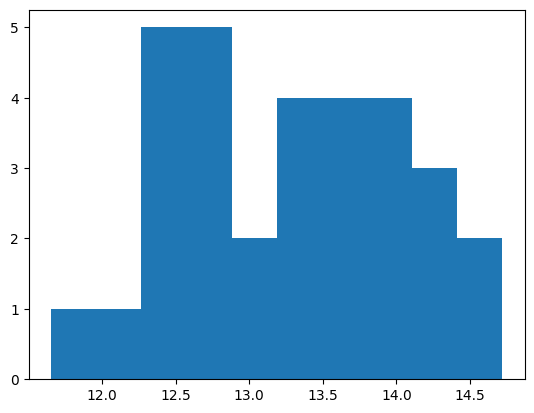

In [94]:
## histogram plot y1_log
from matplotlib import pyplot
pyplot.hist(y2_log)
pyplot.show()

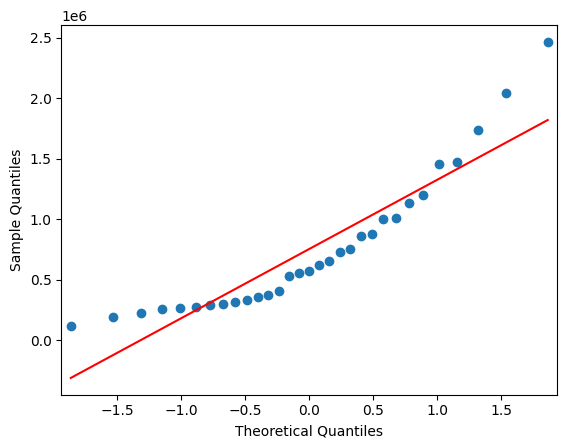

In [95]:
## QQ Plot for y2
from statsmodels.graphics.gofplots import qqplot

qqplot(y2, line='s')
pyplot.show()

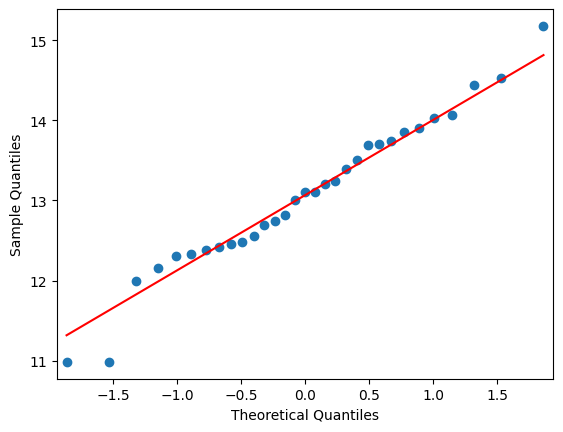

In [96]:
## QQ Plot for y2_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y1_log, line='s')
pyplot.show()

In [97]:
# Normality Test for y2

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.860, p=0.001
Sample does not look Gaussian (reject H0)


In [98]:
# Normality Test for y2_log

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y2_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.980, p=0.813
Sample looks Gaussian (fail to reject H0)


<br><br> <hr><hr><br><br>

#### Normality Test for y3, y3_log

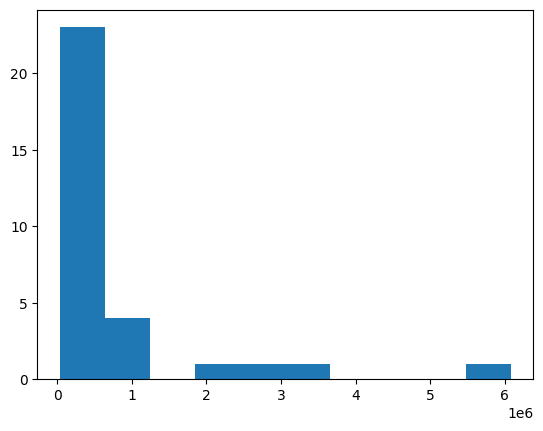

In [104]:
# histogram plot for y3
from matplotlib import pyplot
pyplot.hist(y3)
pyplot.show()

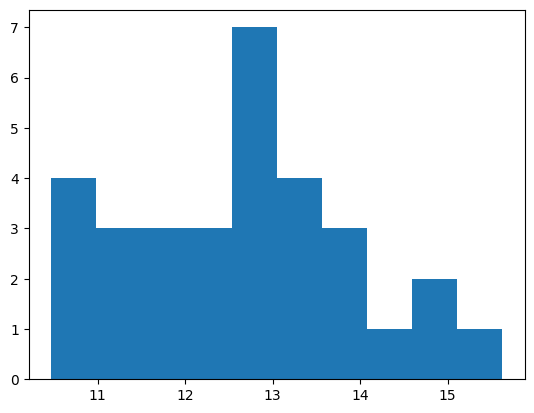

In [105]:
## histogram plot y3_log
from matplotlib import pyplot
pyplot.hist(y3_log)
pyplot.show()

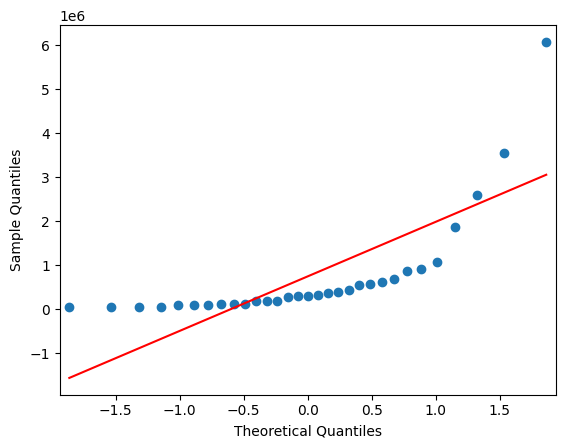

In [102]:
from statsmodels.graphics.gofplots import qqplot

qqplot(y3, line='s')
pyplot.show()

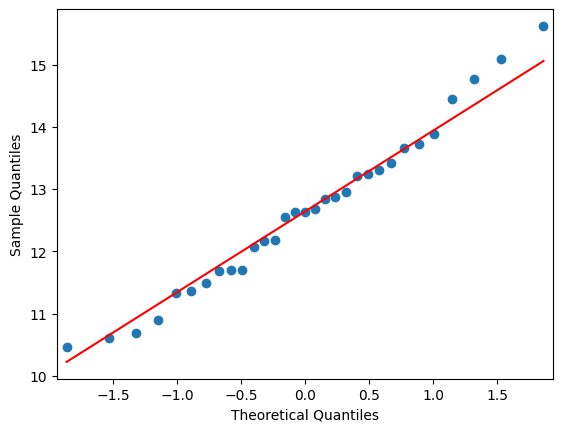

In [101]:
## QQ Plot for y1_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y3_log, line='s')
pyplot.show()

In [100]:
# Normality Test for y3

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.570, p=0.000
Sample does not look Gaussian (reject H0)


In [99]:
# Normality Test for y3_log

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y3_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')



Statistics=0.976, p=0.708
Sample looks Gaussian (fail to reject H0)


<br><br> <hr><hr><br><br>

#### Normality Test for y4, y4_log

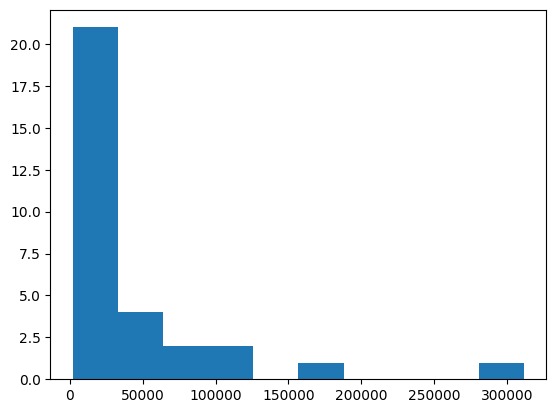

In [92]:
# histogram plot for y4
from matplotlib import pyplot
pyplot.hist(y4)
pyplot.show()

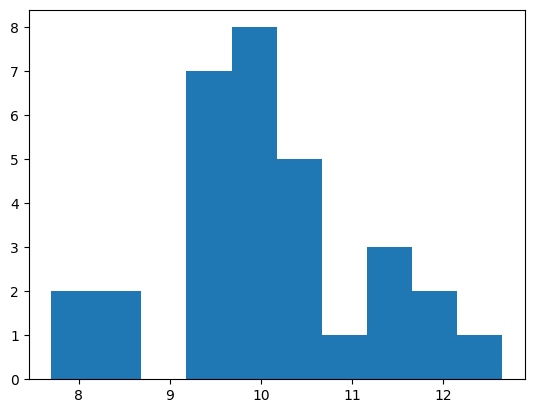

In [91]:
## histogram plot y4_log

from matplotlib import pyplot
pyplot.hist(y4_log)
pyplot.show()

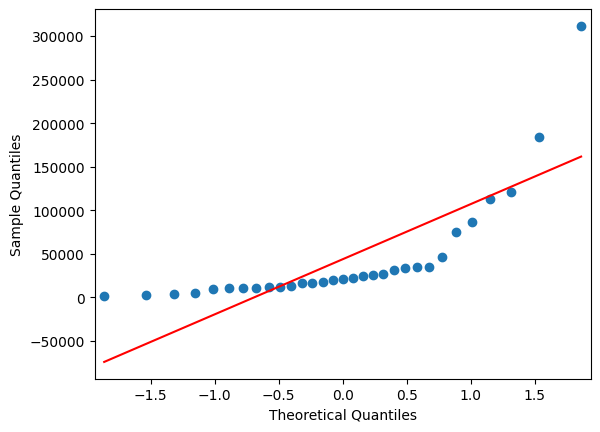

In [89]:
## QQ Plot for y4

from statsmodels.graphics.gofplots import qqplot

qqplot(y4, line='s')
pyplot.show()

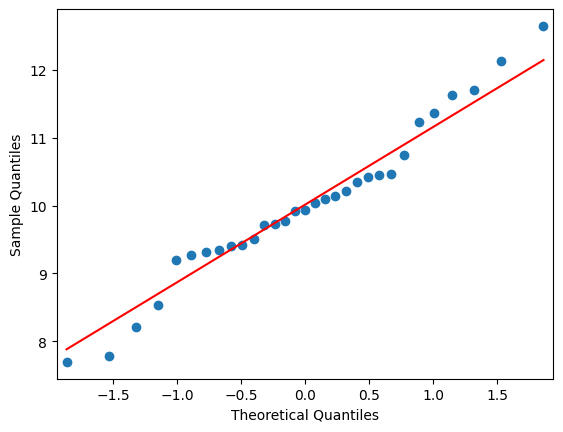

In [90]:
## QQ Plot for y4_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y4_log, line='s')
pyplot.show()

In [87]:
# Normality Test for y4

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y4)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.609, p=0.000
Sample does not look Gaussian (reject H0)


In [88]:
# Normality Test for log_y4

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y4_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.973, p=0.609
Sample looks Gaussian (fail to reject H0)


<br><br><br>
<hr><hr><hr>
<br><br><br>


#### Wilcoxon Test Between y1, y2 And Between y3, y4
#### T Test between y1_log Vs y2_log And y3_log Vs y4_log

<br><br><br><br>

#### y1 ~ y2 And y1_log ~ y2_log

In [107]:
# Importing library
import scipy.stats as stats
  
# conduct the Wilcoxon-Signed Rank Test
result = stats.wilcoxon(y1, y2)
print(result)
# Performing the paired sample t-test
stats.ttest_rel(y1_log, y2_log)

WilcoxonResult(statistic=120.0, pvalue=0.011014155112206936)


TtestResult(statistic=-3.1261966134625494, pvalue=0.003913949900186739, df=30)

<br><br><br><br>

#### y3 ~ y4 And y3_log ~ y4_log

In [108]:
# Importing library
import scipy.stats as stats
  
# conduct the Wilcoxon-Signed Rank Test
result = stats.wilcoxon(y3, y4)
print(result)
# Performing the paired sample t-test
stats.ttest_rel(y3_log, y4_log)

WilcoxonResult(statistic=0.0, pvalue=9.313225746154785e-10)


TtestResult(statistic=18.80321531322818, pvalue=3.763615561762214e-18, df=30)